# Thesis EDA Project
### Jiyoung Kim - Student ID 110075

## **Step 1. Sample**

In [158]:
# Import packages
import pandas as pd
import numpy as np
#import sklearn import preprocessing

## For Visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [159]:
from pandas.plotting import scatter_matrix
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, f1_score, confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, LabelEncoder, LabelBinarizer
from sklearn_pandas import DataFrameMapper #, cross_val_score
import datetime
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Set font size for plotting
sns.set(font_scale=1)

# global setting for use normal number, not exponential
pd.set_option('display.float_format', lambda x: '%.5f' %x)

In [6]:
# Load dataset
df = pd.read_csv("/Users/jiyoung/Master thesis/data_cleaned/df_wholeset.csv")

# to prevent values with blank space being considered as value
df.head()

,uuid,name,rank,country_code,status,num_funding_rounds,total_funding_usd,founded_on,last_funding_on,employee_count,...,age_Acquired,age_years,success,age_success,age_closed,homepage_active,category,category_num,has_VC_investor,has_angel_investor
0,e1393508-30ea-8a36-3f96-dd3226033abd,Wetpaint,198861.00000,USA,acquired,3,39750000.00000,2005-06-01,2008-05-19,1,...,8.50000,11.60000,1,8.50000,NaN,1,Digital Media & Publishing,Industry 5,1,0
1,5f2b40b8-d1b3-d323-d81a-b7a8e89553d0,Digg,22761.00000,USA,acquired,6,49000000.00000,2004-10-11,2016-09-13,1,...,7.80000,12.20000,1,7.80000,NaN,1,Telecom,Industry 10,1,1
2,60485007-8856-bbac-aa1b-c535c41f5f47,Omnidrive,1025949.00000,USA,closed,1,800000.00000,2005-11-01,2006-12-01,0,...,NaN,11.20000,0,NaN,2.90000,1,Digital Entertainment & Music,Industry 3,0,1
3,4111dc8b-c0df-2d24-ed33-30cd137b3098,Geni,175799.00000,USA,acquired,3,15000000.00000,2006-06-01,2009-01-19,1,...,6.50000,10.60000,1,6.50000,NaN,1,FMCG,Industry 11,1,0
4,3d16cb4c-911e-75c0-de5a-15c316b39f98,StumbleUpon,189805.00000,USA,closed,4,18500000.00000,2001-01-01,2011-03-09,2,...,6.40000,16.00000,0,NaN,17.50000,1,Telecom,Industry 10,1,1


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115690 entries, 0 to 115689
Data columns (total 65 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   uuid                       115690 non-null  object 
 1   name                       115690 non-null  object 
 2   rank                       115687 non-null  float64
 3   country_code               115330 non-null  object 
 4   status                     115690 non-null  object 
 5   num_funding_rounds         115690 non-null  int64  
 6   total_funding_usd          115690 non-null  float64
 7   founded_on                 115690 non-null  object 
 8   last_funding_on            115690 non-null  object 
 9   employee_count             115690 non-null  int64  
 10  primary_role               115690 non-null  object 
 11  num_exits                  795 non-null     float64
 12  first_funding_on           115690 non-null  object 
 13  avg_investors_per_round    89

In [8]:
df[['status','employee_count','has_angel', 'has_pre_seed', 'has_seed', 'has_seriesUnknown', 'has_seriesA', 'has_seriesB', 'has_seriesC', 
'has_seriesD', 'has_seriesE_J', 'has_equity_crowdfunding', 'has_product_crowdfunding', 'has_private_equity', 'has_convertible_note', 
'has_debt_financing', 'has_secondary_market', 'has_grant', 'has_corporate_round', 'has_initial_coin_offering', 'has_post_ipo_equity', 
'has_post_ipo_debt', 'has_post_ipo_secondary', 'has_non_equity_assistance', 'has_undisclosed','has_VC_investor', 'has_angel_investor',
'success', 'homepage_active', 'category', 'category_num']] = df[['status','employee_count','has_angel', 'has_pre_seed', 'has_seed', 'has_seriesUnknown', 'has_seriesA', 'has_seriesB', 'has_seriesC', 
'has_seriesD', 'has_seriesE_J', 'has_equity_crowdfunding', 'has_product_crowdfunding', 'has_private_equity', 'has_convertible_note', 
'has_debt_financing', 'has_secondary_market', 'has_grant', 'has_corporate_round', 'has_initial_coin_offering', 'has_post_ipo_equity', 
'has_post_ipo_debt', 'has_post_ipo_secondary', 'has_non_equity_assistance', 'has_undisclosed','has_VC_investor', 'has_angel_investor',
'success', 'homepage_active', 'category', 'category_num']].apply(lambda x: x.astype('category'))

In [9]:
df[['rank', 'num_funding_rounds', 'num_exits', 'investor_rank', 'avg_investors_per_round']] = df[['rank', 'num_funding_rounds', 'num_exits', 'investor_rank', 'avg_investors_per_round']].apply(lambda x: x.astype('Int64'))

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115690 entries, 0 to 115689
Data columns (total 65 columns):
 #   Column                     Non-Null Count   Dtype   
---  ------                     --------------   -----   
 0   uuid                       115690 non-null  object  
 1   name                       115690 non-null  object  
 2   rank                       115687 non-null  Int64   
 3   country_code               115330 non-null  object  
 4   status                     115690 non-null  category
 5   num_funding_rounds         115690 non-null  Int64   
 6   total_funding_usd          115690 non-null  float64 
 7   founded_on                 115690 non-null  object  
 8   last_funding_on            115690 non-null  object  
 9   employee_count             115690 non-null  category
 10  primary_role               115690 non-null  object  
 11  num_exits                  795 non-null     Int64   
 12  first_funding_on           115690 non-null  object  
 13  avg_investors_

In [11]:
# continuous variables statistics
df.describe() 

,rank,num_funding_rounds,total_funding_usd,num_exits,avg_investors_per_round,acquired_price_usd,investor_rank,age_first_funding,age_seriesA,age_seriesB,age_seriesC,age_seriesD,age_fundings,age_IPO,age_Acquired,age_years,age_success,age_closed
count,115687.00000,115690.00000,115690.00000,795.00000,89948.00000,4443.00000,89493.00000,115690.00000,33001.00000,18590.00000,9146.00000,4022.00000,115690.00000,6653.00000,17704.00000,115690.00000,24035.00000,6653.00000
mean,191426.08165,2.44767,25313202.31093,2.21258,2.03585,511557439.16858,201444.12052,3.92223,3.94472,5.09045,6.29278,7.54828,2.08976,8.49982,8.99845,7.09763,8.70299,6.08784
std,286203.77551,2.08783,89041522.60967,3.81154,1.54099,1699362496.22784,434585.15278,4.89199,3.41952,3.36483,3.33168,3.47287,3.02856,5.57182,5.42889,5.96978,5.30791,3.91640
min,5.00000,1.00000,3116.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.10000,0.00000
25%,52683.00000,1.00000,463226.00000,1.00000,1.00000,29800000.00000,7278.00000,0.80000,1.60000,2.80000,4.00000,5.20000,0.00000,4.20000,5.00000,2.60000,4.90000,3.30000
50%,104442.00000,2.00000,2450000.00000,1.00000,2.00000,111000000.00000,57210.00000,2.10000,3.00000,4.30000,5.70000,6.90000,0.70000,7.60000,7.70000,5.00000,7.50000,5.30000
75%,173501.50000,3.00000,13000000.00000,2.00000,2.00000,350000000.00000,164877.00000,5.10000,5.20000,6.40000,7.70000,9.10000,3.30000,11.70000,11.80000,10.00000,11.40000,8.00000
max,1943753.00000,41.00000,1444785824.00000,44.00000,38.00000,39000000000.00000,3371152.00000,32.20000,28.60000,28.80000,28.70000,28.80000,29.90000,31.40000,32.30000,27.00000,32.30000,30.00000


In [12]:
# let's keep original dataset done with basic preprocessing
df_copy = df.copy()

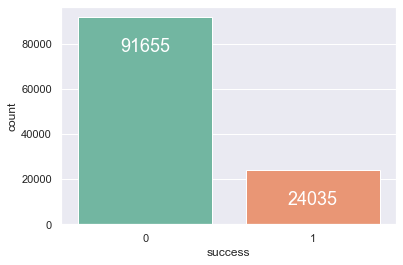

In [13]:
# Plot - target var: Success (Before Pre-processing)
success_bar = sns.countplot(data=df_copy, x="success", palette="Set2")
for p in success_bar.patches:
    success_bar.annotate(f'\n{p.get_height()}', (p.get_x()+0.4, p.get_height()), ha='center', va='top', color='white', size=18)

plt.show()

## **Step 2. Explore**

### **EDA (Multiplot in SAS Miner)**

Through this basic EDA part, we will check all variables' distribution and proportion of Churn(yes or no) in each of them. (we can also consider this EDA results when we decide how to deal with highly correlated variables(variables with multicollinearity) in our next step. 

**Numeric Variables**

In [ ]:
filtered = df[df['num_funding_rounds']<= 10]
filtered2 = df[df['total_funding_usd']<= 410400]
#filtered2 = df[df['total_funding_usd']<= 22410000]

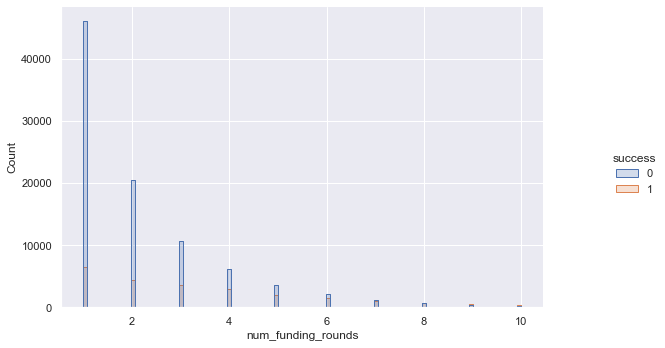

In [ ]:
g = sns.displot(filtered, x='num_funding_rounds', hue='success', element='step')
g.fig.set_figwidth(10)
g.fig.set_figheight(5)


#sns.displot(df, x='total_funding_usd', hue='success', element='step')

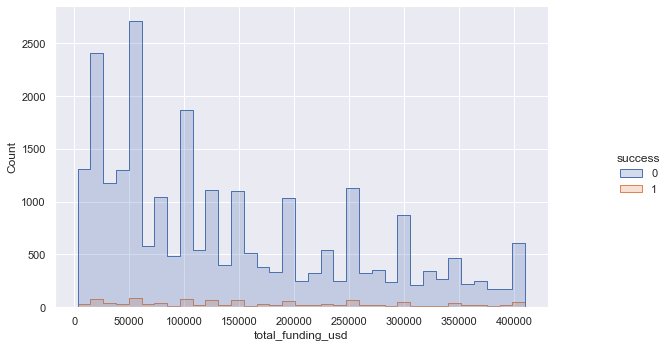

In [ ]:
s = sns.displot(filtered2, x='total_funding_usd', hue='success', element='step')
s.fig.set_figwidth(10)
s.fig.set_figheight(5)


In [ ]:
filtered4 = df[df['avg_investors_per_round']<= 5]


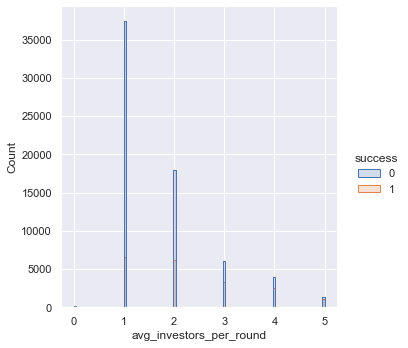

In [ ]:
sns.displot(filtered4, x='avg_investors_per_round', hue='success', element='step')
# g.fig.set_figwidth(10)
# g.fig.set_figheight(5)

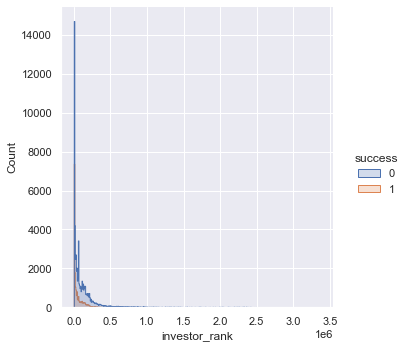

In [ ]:
sns.displot(df, x='investor_rank', hue='success', element='step')
# g.fig.set_figwidth(10)
# g.fig.set_figheight(5)

**Categorical Variables**

In [32]:
print(list(df.select_dtypes('number')))

['rank', 'num_funding_rounds', 'total_funding_usd', 'num_exits', 'avg_investors_per_round', 'acquired_price_usd', 'investor_rank', 'age_first_funding', 'age_seriesA', 'age_seriesB', 'age_seriesC', 'age_seriesD', 'age_fundings', 'age_IPO', 'age_Acquired', 'age_years', 'age_success', 'age_closed']


In [33]:
pd.set_option('display.max_rows', 100)
df.dtypes

uuid                           object
name                           object
rank                            Int64
country_code                   object
status                       category
num_funding_rounds              Int64
total_funding_usd             float64
founded_on                     object
last_funding_on                object
employee_count               category
primary_role                   object
num_exits                       Int64
first_funding_on               object
avg_investors_per_round         Int64
has_angel                    category
has_pre_seed                 category
has_seed                     category
has_seriesUnknown            category
has_seriesA                  category
has_seriesB                  category
has_seriesC                  category
has_seriesD                  category
has_seriesE_J                category
has_equity_crowdfunding      category
has_product_crowdfunding     category
has_private_equity           category
has_converti

In [24]:
cat_columns = list(df.select_dtypes('category'))
len(cat_columns)
print(cat_columns)



['status', 'employee_count', 'has_angel', 'has_pre_seed', 'has_seed', 'has_seriesUnknown', 'has_seriesA', 'has_seriesB', 'has_seriesC', 'has_seriesD', 'has_seriesE_J', 'has_equity_crowdfunding', 'has_product_crowdfunding', 'has_private_equity', 'has_convertible_note', 'has_debt_financing', 'has_secondary_market', 'has_grant', 'has_corporate_round', 'has_initial_coin_offering', 'has_post_ipo_equity', 'has_post_ipo_debt', 'has_post_ipo_secondary', 'has_non_equity_assistance', 'has_undisclosed', 'success', 'homepage_active', 'category', 'category_num', 'has_VC_investor', 'has_angel_investor']


In [25]:
cat_columns_to_remove = ['success', 'category', 'category_num']

# removing the elements from the list
# using set() and - operator
cat_columns_final = list(set(cat_columns) - set(cat_columns_to_remove))
print(cat_columns_final)


['has_seriesA', 'has_non_equity_assistance', 'has_initial_coin_offering', 'has_convertible_note', 'has_pre_seed', 'has_grant', 'has_seriesE_J', 'has_seriesUnknown', 'has_post_ipo_equity', 'has_secondary_market', 'has_undisclosed', 'has_product_crowdfunding', 'has_debt_financing', 'has_private_equity', 'has_equity_crowdfunding', 'has_angel_investor', 'has_post_ipo_debt', 'homepage_active', 'has_seriesB', 'has_seed', 'has_corporate_round', 'has_seriesC', 'employee_count', 'has_post_ipo_secondary', 'has_angel', 'has_VC_investor', 'status', 'has_seriesD']


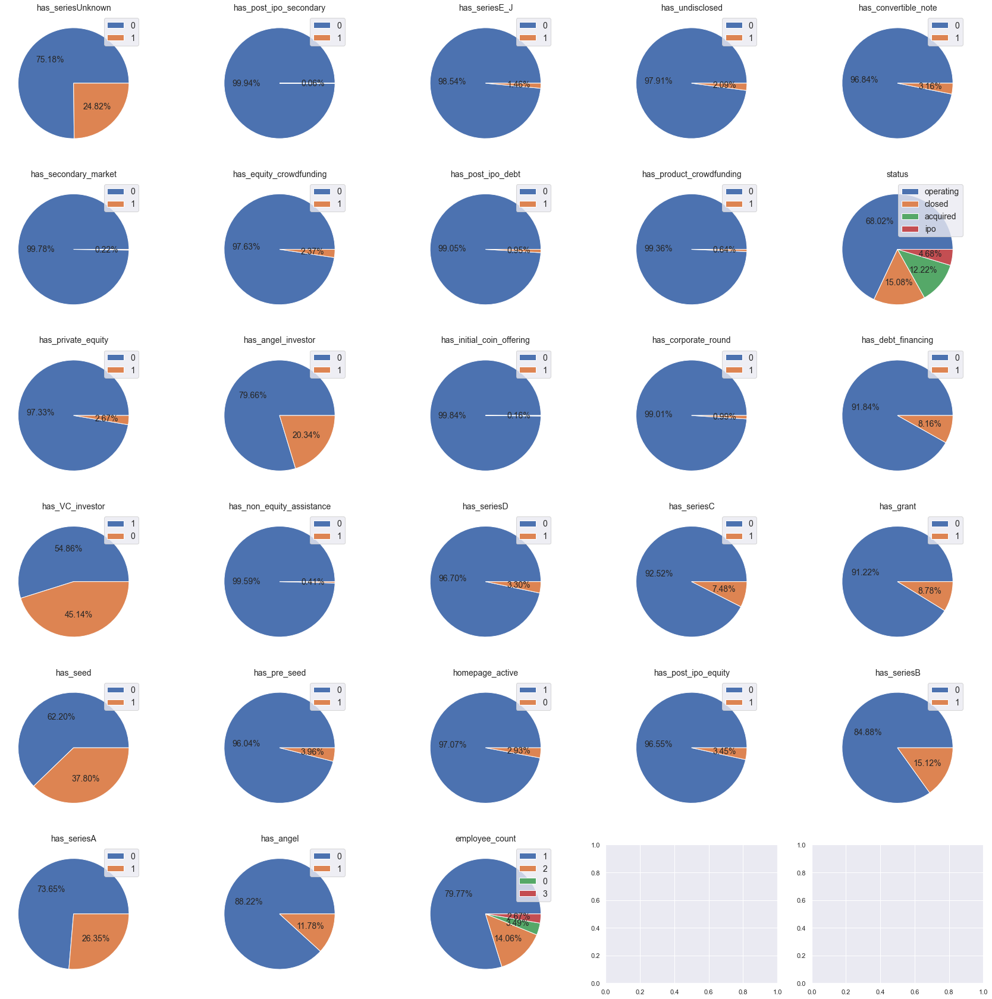

In [65]:
# Plot - How does distribution of all variables look like in overall
import math
from matplotlib.pyplot import figure

#cat_columns = list(df.select_dtypes('category'))

f, axes = plt.subplots(math.ceil(len(cat_columns_final)/5), 5, figsize=(30,30))
for col, ax in zip(cat_columns_final, axes.ravel()):
        data = df[col].value_counts().values.tolist()
        labels = df[col].value_counts().index.tolist()
        ax.pie(data,autopct='%0.2f%%', textprops={'fontsize': 14})
        ax.set_title(col, fontsize = 14)
        # ax.xaxis.label.set_size(14)
        ax.legend(labels,loc='best', fontsize = 14)

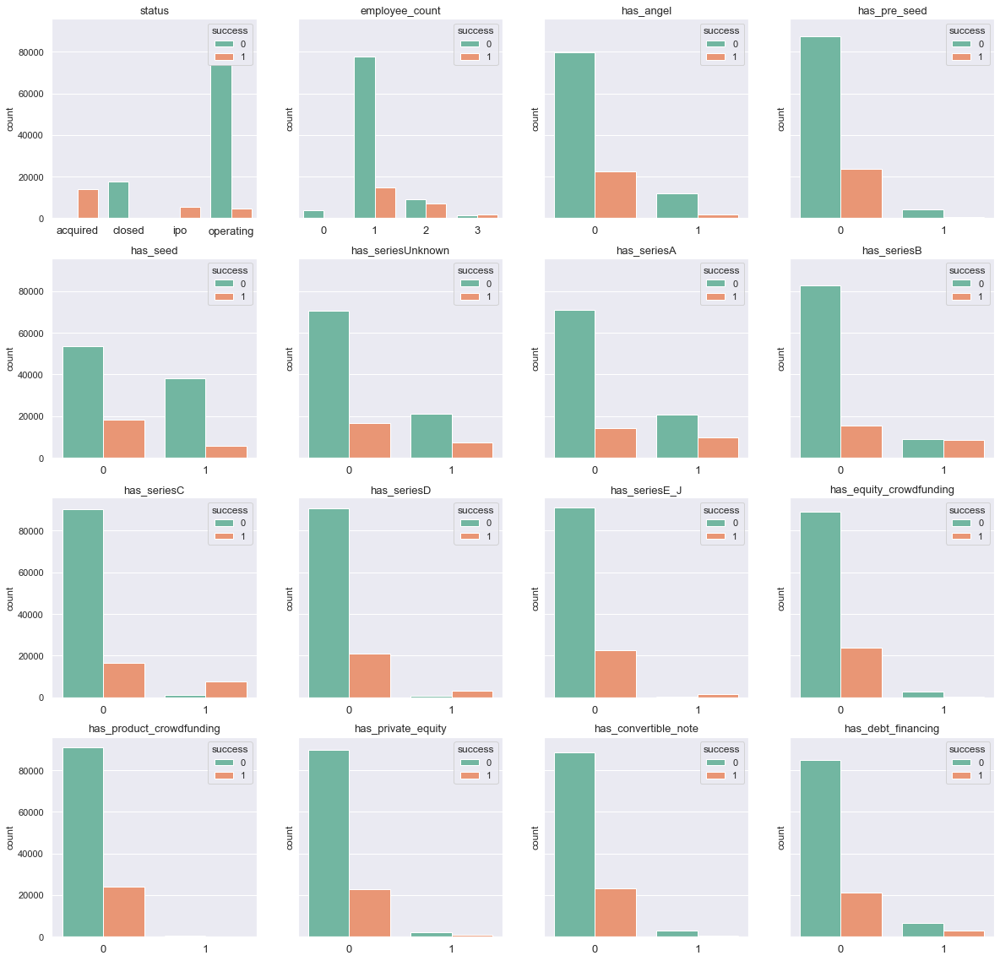

In [85]:
# MultiPlot - target var: Successs

cat_columns_part1 = ['status', 'employee_count', 'has_angel', 'has_pre_seed', 'has_seed', 'has_seriesUnknown', 'has_seriesA', 'has_seriesB', 'has_seriesC', 'has_seriesD', 'has_seriesE_J', 'has_equity_crowdfunding', 'has_product_crowdfunding', 'has_private_equity', 'has_convertible_note', 'has_debt_financing']

fig, axs = plt.subplots(4, 4, sharex=False, sharey=True, figsize=(20,20))

count_row = 0
count_columns = 0

for column in cat_columns_part1:    
    
    Bar_Plot = sns.countplot(x=column,hue='success',data=df, palette="Set2", ax = axs[count_row][count_columns])
    Bar_Plot.set(title=str(column))
    plt.rcParams['xtick.labelsize']=13
    Bar_Plot.set(xlabel=None)
    plt.rc('axes', titlesize=13)

    count_columns +=1
    
    if count_columns == 4:
        count_row+=1
        count_columns=0

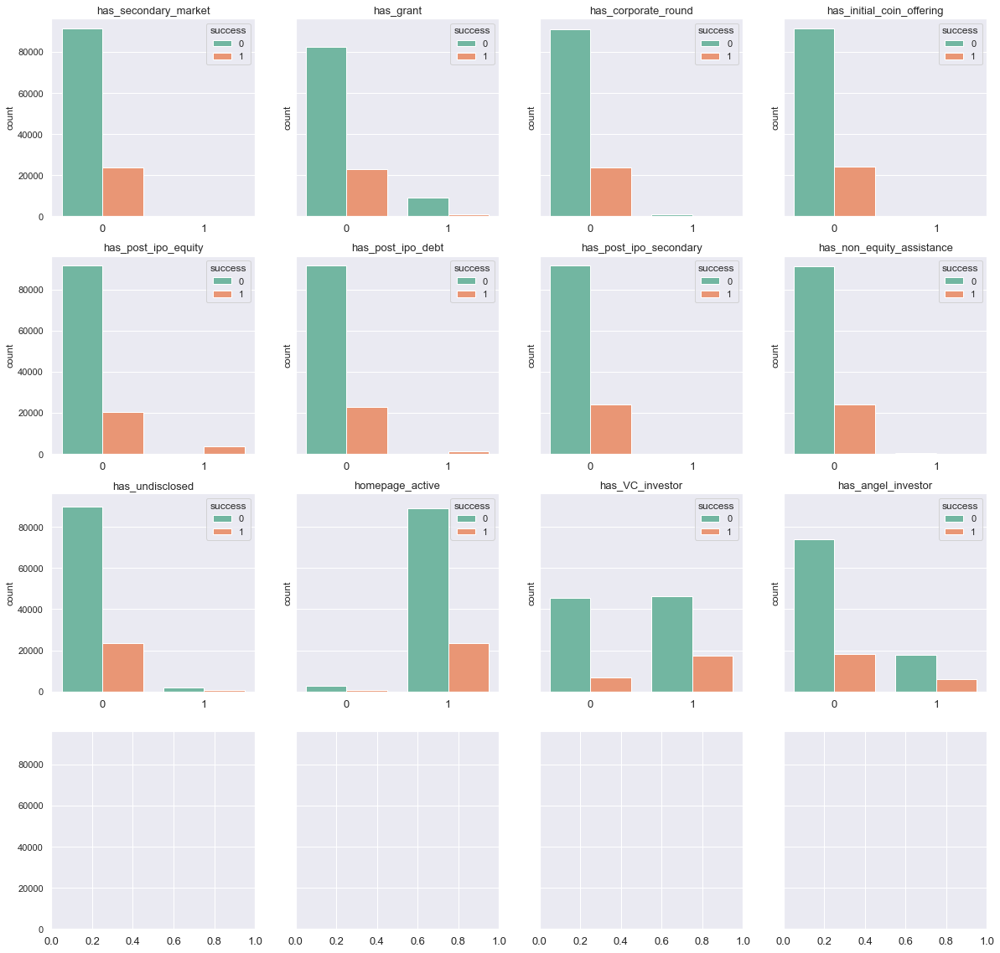

In [86]:
# Second part of plots
# MultiPlot - target var: Success
# 'category' variable will be explored separately

cat_columns_part2 = ['has_secondary_market', 'has_grant', 'has_corporate_round', 'has_initial_coin_offering', 'has_post_ipo_equity', 'has_post_ipo_debt', 'has_post_ipo_secondary', 'has_non_equity_assistance', 'has_undisclosed', 'homepage_active', 'has_VC_investor', 'has_angel_investor']

fig, axs = plt.subplots(4, 4, sharex=False, sharey=True, figsize=(20,20))

count_row = 0
count_columns = 0
for column in cat_columns_part2:    
    
    Bar_Plot = sns.countplot(x=column,hue='success',data=df, palette="Set2", ax = axs[count_row][count_columns])
    Bar_Plot.set(title=str(column))
    plt.rcParams['xtick.labelsize']=13
    Bar_Plot.set(xlabel=None)
    plt.rc('axes', titlesize=13)
   
    count_columns +=1
    
    if count_columns == 4:
        count_row+=1
        count_columns=0

### With a Newly created Category after clustering

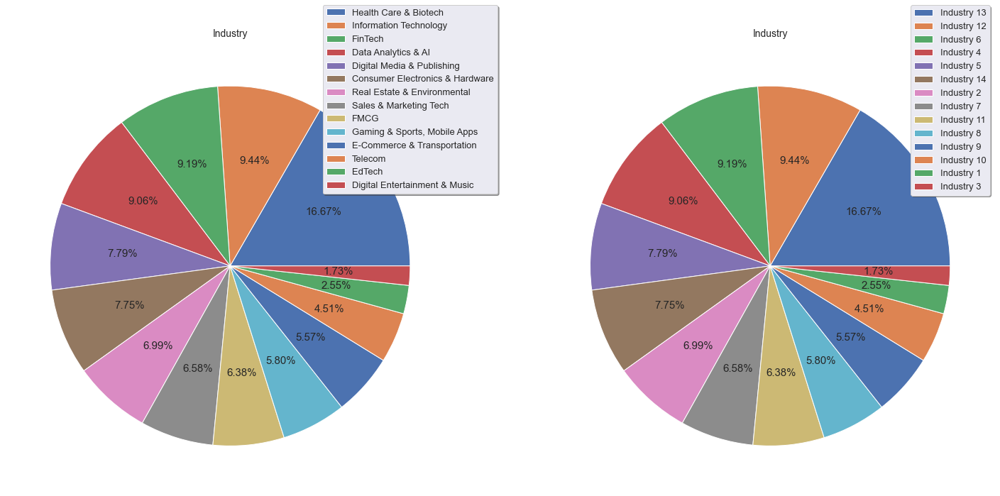

In [118]:
# Plot - How does distribution of all variables look like in overall
import math
from matplotlib.pyplot import figure

cat_columns = ['category', 'category_num']
    
f, axes = plt.subplots(math.ceil(len(cat_columns)/2),2, figsize=(25,30))
for col, ax in zip(cat_columns, axes.ravel()):
        data = df[col].value_counts().values.tolist()
        labels = df[col].value_counts().index.tolist()
        ax.pie(data,autopct='%0.2f%%', textprops={'fontsize': 15})
        ax.set_title("Industry", fontsize = 14)
        ax.legend(labels,loc='upper center', bbox_to_anchor=(0.9, 1.09), ncol=1, shadow=True, fontsize = 13)

Text(0.5, 1.0, 'Frequeny distribution of Success for Category')

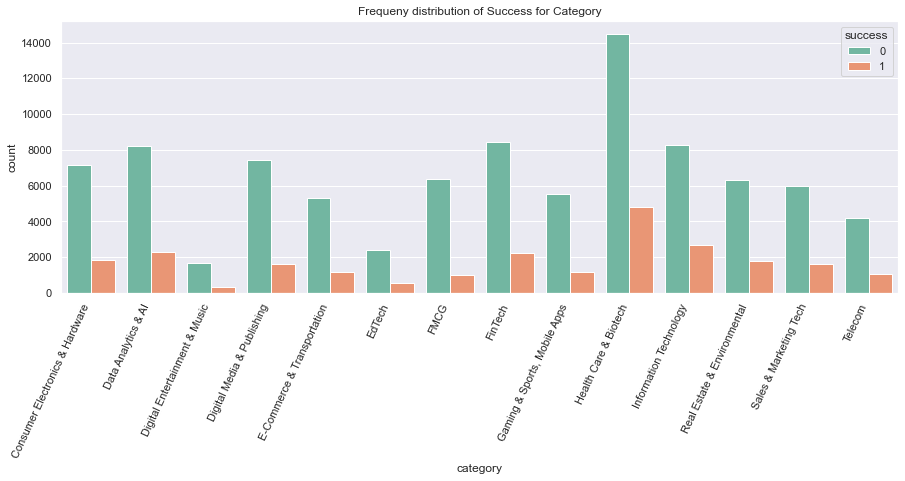

In [ ]:
plt.figure(figsize=(15,5))

Bar_Plot = sns.countplot(
    data=df,
    x='category',
    hue='success',
    palette='Set2'
)

Bar_Plot.set_xticklabels(Bar_Plot.get_xticklabels(), rotation=65, horizontalalignment='right')
Bar_Plot.set_title("Frequeny distribution of Success for Category")


Text(0.5, 1.0, 'Frequeny distribution of Success for Category')

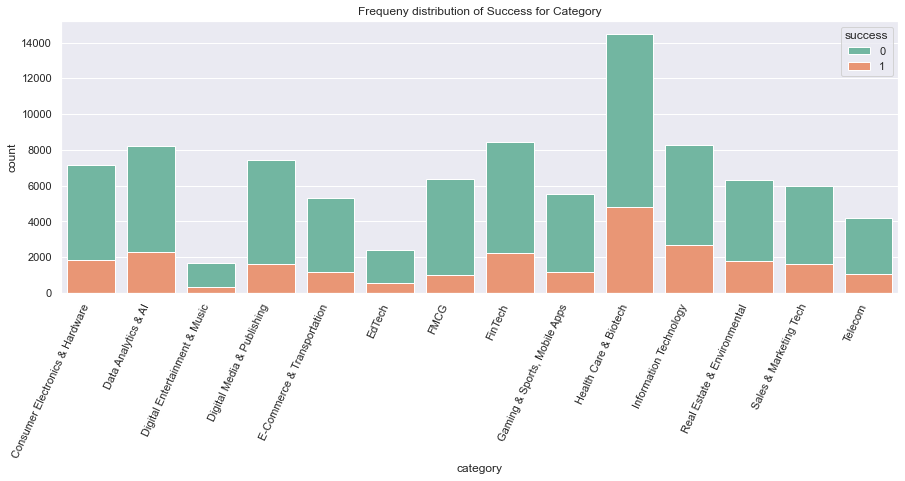

In [ ]:
plt.figure(figsize=(15,5))

Bar_Plot = sns.countplot(
    data=df,
    x='category',
    hue='success',
    palette='Set2',
    dodge=False
)

Bar_Plot.set_xticklabels(Bar_Plot.get_xticklabels(), rotation=65, horizontalalignment='right')
Bar_Plot.set_title("Frequeny distribution of Success for Category")


Text(0.5, 1.0, 'Frequeny distribution of Success for Category')

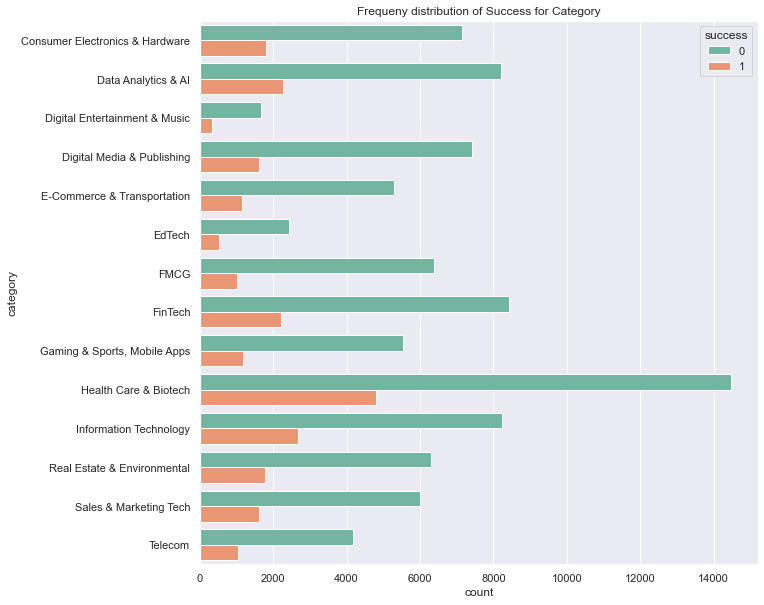

In [ ]:
plt.figure(figsize=(10,10))

Bar_Plot = sns.countplot(
    data=df,
    y='category',
    hue='success',
    palette='Set2'
)

Bar_Plot.set_title("Frequeny distribution of Success for Category")


Text(0.5, 1.0, 'Frequeny distribution of Success for Category')

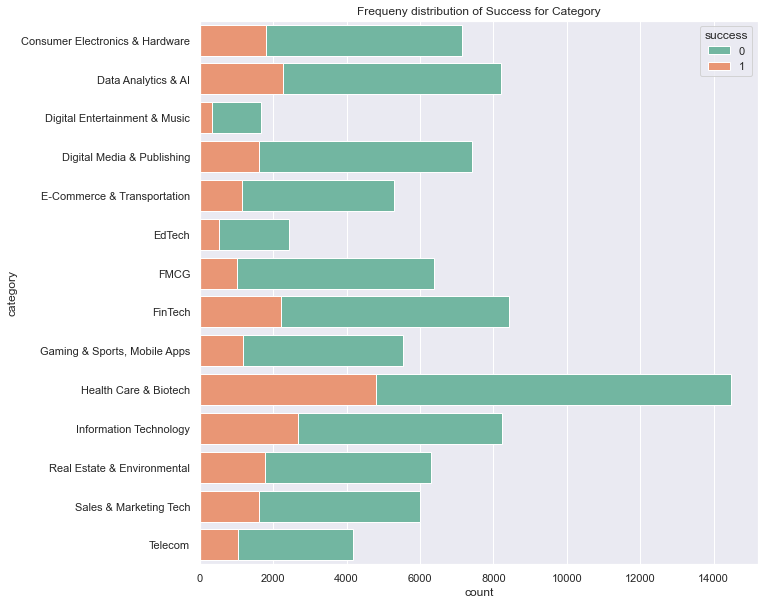

In [ ]:
plt.figure(figsize=(10,10))

Bar_Plot = sns.countplot(
    data=df,
    y='category',
    hue='success',
    palette='Set2', 
    dodge=False
)

Bar_Plot.set_title("Frequeny distribution of Success for Category")


Text(0.5, 1.0, 'Frequeny distribution of Staus for Category')

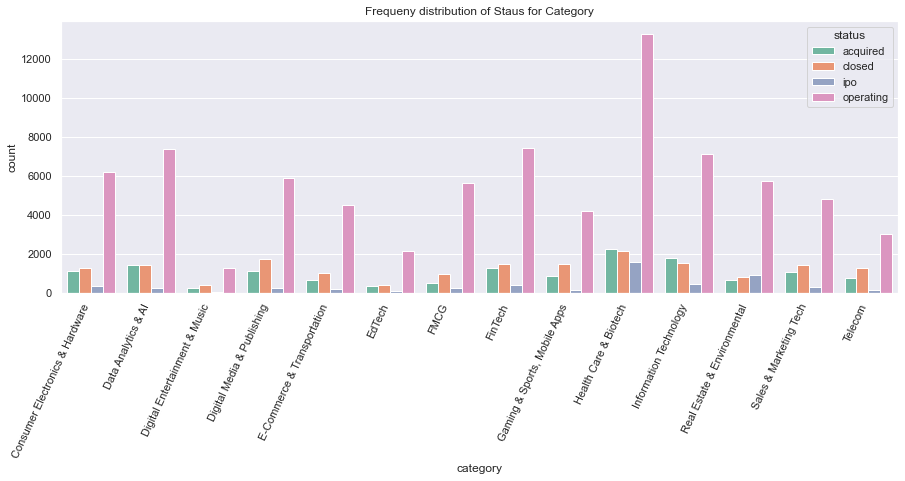

In [ ]:
plt.figure(figsize=(15,5))

Bar_Plot = sns.countplot(
    data=df,
    x='category',
    hue='status',
    palette='Set2'
)

Bar_Plot.set_xticklabels(Bar_Plot.get_xticklabels(), rotation=65, horizontalalignment='right')
Bar_Plot.set_title("Frequeny distribution of Staus for Category")

Text(0.5, 1.0, 'Frequeny distribution of Staus by Category')

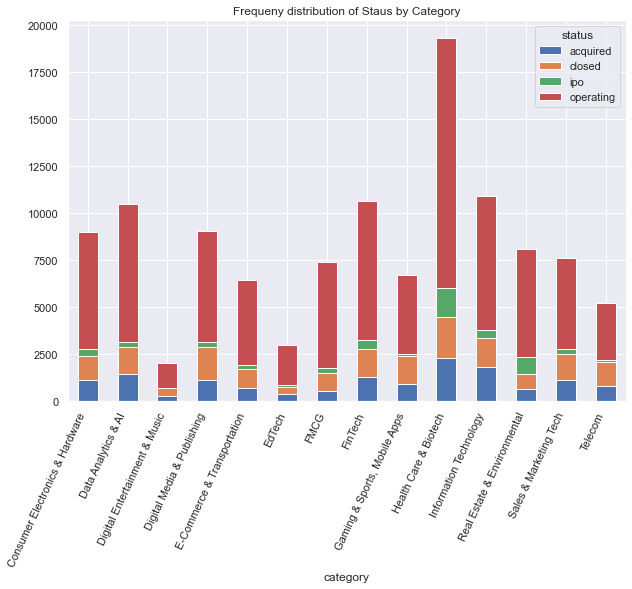

In [ ]:
df_bar_plot_2 = df.groupby(['category', 'status']).size().reset_index().pivot(columns='status', index= 'category', values=0)

#plt.figure(figsize=(20,15))
ax = df_bar_plot_2.plot(kind='bar', stacked=True)
ax.figure.set_size_inches(10,7)

ax.set_xticklabels(ax.get_xticklabels(), rotation=65, horizontalalignment='right')
ax.set_title("Frequeny distribution of Staus by Category")

Text(0.5, 1.0, 'Frequeny distribution of Staus by Category')

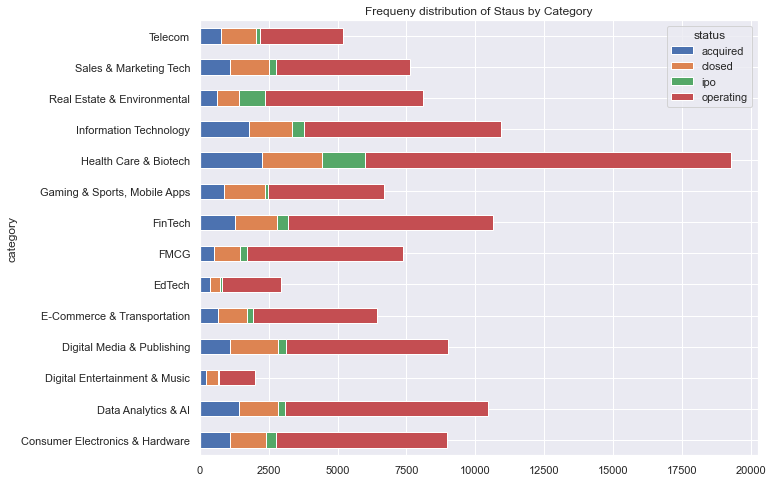

In [ ]:
df_bar_plot_2 = df.groupby(['category', 'status']).size().reset_index().pivot(columns='status', index= 'category', values=0)

#plt.figure(figsize=(20,15))
ax = df_bar_plot_2.plot.barh(stacked=True)
ax.figure.set_size_inches(10,8)

ax.set_title("Frequeny distribution of Staus by Category")

Text(0.5, 1.0, 'Frequeny distribution of Staus for Category')

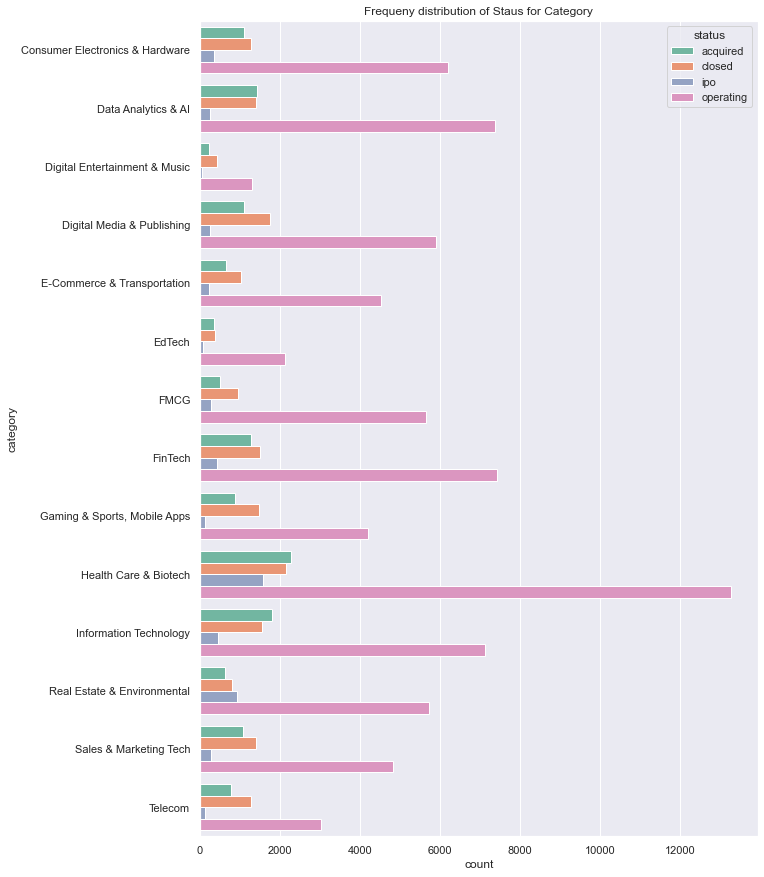

In [ ]:
plt.figure(figsize=(10,15))

Bar_Plot = sns.countplot(
    data=df,
    y='category',
    hue='status',
    palette='Set2'
)

Bar_Plot.set_title("Frequeny distribution of Staus for Category")

Text(0.5, 1.0, 'Frequeny distribution of Category')

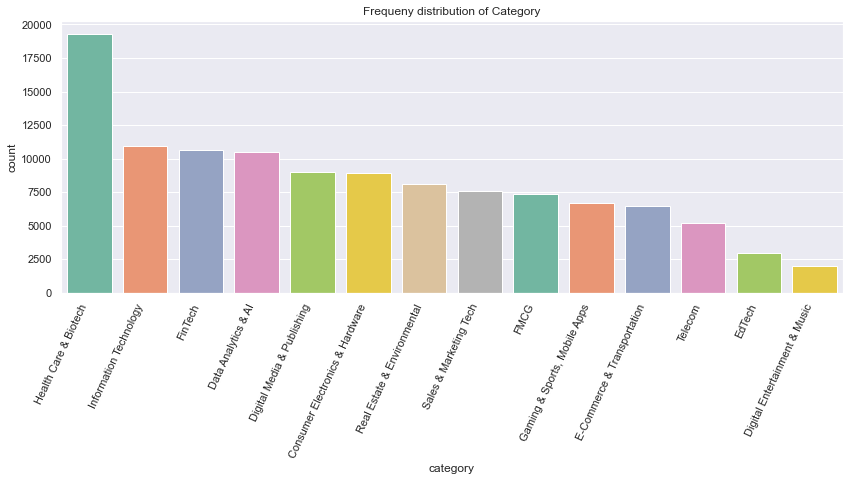

In [ ]:
plt.figure(figsize=(14,5))

Bar_Plot = sns.countplot(
    data=df,
    x='category',
    palette='Set2',
    order = df['category'].value_counts().index
)

Bar_Plot.set_xticklabels(Bar_Plot.get_xticklabels(), rotation=65, horizontalalignment='right')
Bar_Plot.set_title("Frequeny distribution of Category")


Text(0.5, 1.0, 'Frequeny distribution of country_code')

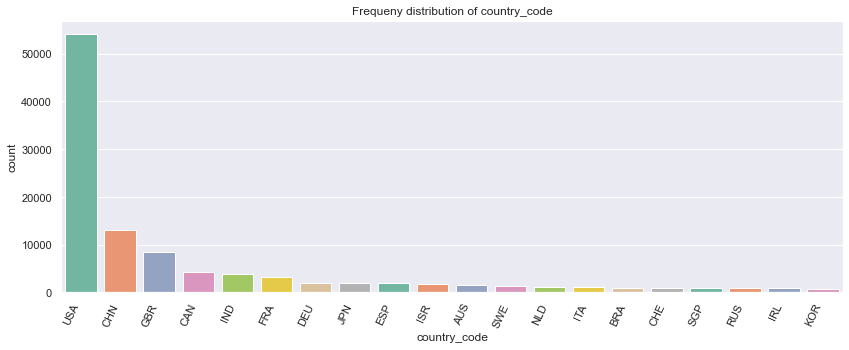

In [ ]:
plt.figure(figsize=(14,5))

Bar_Plot = sns.countplot(
    data=df,
    x='country_code',
    palette='Set2',
    order=df.country_code.value_counts().iloc[:20].index
)

Bar_Plot.set_xticklabels(Bar_Plot.get_xticklabels(), rotation=65, horizontalalignment='right')
Bar_Plot.set_title("Frequeny distribution of country_code")

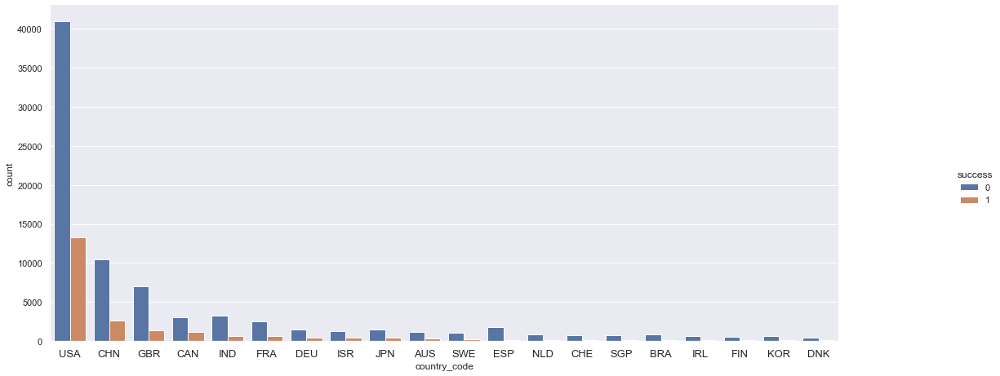

In [162]:
order = pd.crosstab(df.country_code, df.success).sort_values(1, ascending=False).iloc[:20].index

sns.catplot(x="country_code", hue="success",
                data=df, kind="count",
                order=order)
                #height=4, aspect=.7)

plt.gcf().set_size_inches(20, 7)

[Text(0, 0, 'USA'),
 Text(1, 0, 'CHN'),
 Text(2, 0, 'GBR'),
 Text(3, 0, 'CAN'),
 Text(4, 0, 'IND'),
 Text(5, 0, 'FRA'),
 Text(6, 0, 'DEU'),
 Text(7, 0, 'ISR'),
 Text(8, 0, 'JPN'),
 Text(9, 0, 'AUS'),
 Text(10, 0, 'SWE'),
 Text(11, 0, 'ESP'),
 Text(12, 0, 'NLD'),
 Text(13, 0, 'CHE'),
 Text(14, 0, 'SGP'),
 Text(15, 0, 'BRA'),
 Text(16, 0, 'IRL'),
 Text(17, 0, 'FIN'),
 Text(18, 0, 'KOR'),
 Text(19, 0, 'DNK')]

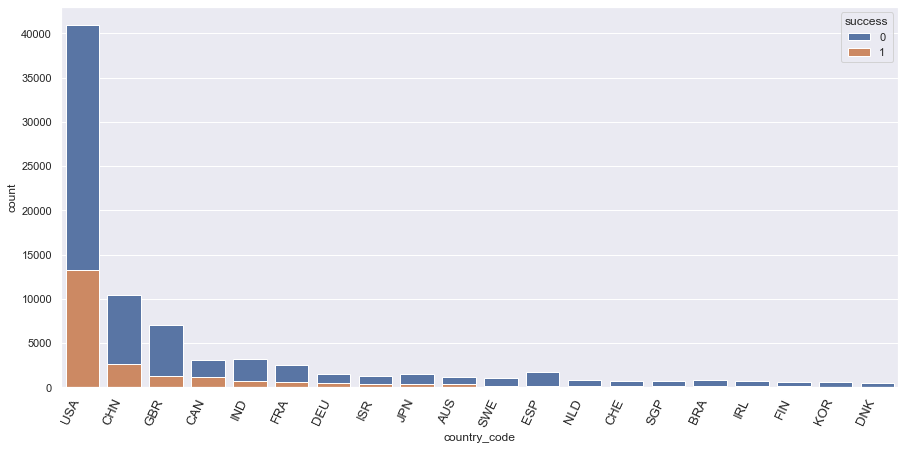

In [163]:
order = pd.crosstab(df.country_code, df.success).sort_values(1, ascending=False).iloc[:20].index

plt.figure(figsize=(15, 7))

Bar_Plot = sns.countplot(
    data=df,
    x='country_code',
    hue='success',
    dodge=False, 
    order=order
)

Bar_Plot.set_xticklabels(Bar_Plot.get_xticklabels(), rotation=65, horizontalalignment='right')
#Bar_Plot.set_title("Frequeny distribution of Success by Country")


In [175]:
# Load dataset
success_ratio_country_only = pd.read_csv("~/Master thesis/data_cleaned/success_ratio_country_only.csv") 
failed_ratio_country_only = pd.read_csv("~/Master thesis/data_cleaned/failed_ratio_country_only.csv")

In [178]:
success_ratio_country_only= success_ratio_country_only.sort_values('n_pct', ascending=False)
success_ratio_country_only

,country_code,success,n,n_pct
57,MAF,1,1,100.00000
83,TGO,1,1,100.00000
9,BMU,1,13,59.09091
51,LBR,1,1,50.00000
47,KNA,1,1,50.00000
...,...,...,...,...
40,ISL,1,9,3.67347
70,PER,1,2,2.40964
78,SAU,1,2,2.27273
6,BGD,1,1,2.22222


In [179]:
failed_ratio_country_only= failed_ratio_country_only.sort_values('n_pct', ascending=False)
failed_ratio_country_only

,country_code,success,n,n_pct
0,AFG,0,6,100.00000
117,OMN,0,4,100.00000
18,BLM,0,1,100.00000
13,BFA,0,1,100.00000
43,DZA,0,4,100.00000
...,...,...,...,...
89,LIE,0,4,66.66667
87,LBR,0,1,50.00000
82,KNA,0,1,50.00000
76,JEY,0,4,50.00000


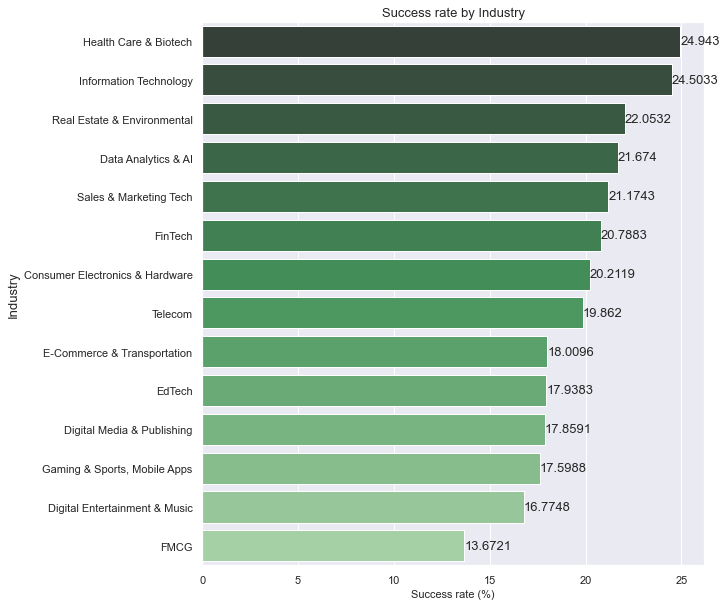

In [ ]:
palette = sns.color_palette("Greens_d", n_colors=14)
palette.reverse()

Bar_Plot = sns.barplot(
    data=success_ratio_only,
    x='n_pct',
    y='category',
    palette=palette
)

Bar_Plot.set_xlabel("Success rate (%)", fontsize=11)
Bar_Plot.set_ylabel("Industry", fontsize=13)
Bar_Plot.bar_label(Bar_Plot.containers[0], fontsize=13)
Bar_Plot.set_title("Success rate by Industry", fontsize=13)

plt.gcf().set_size_inches(9, 10)


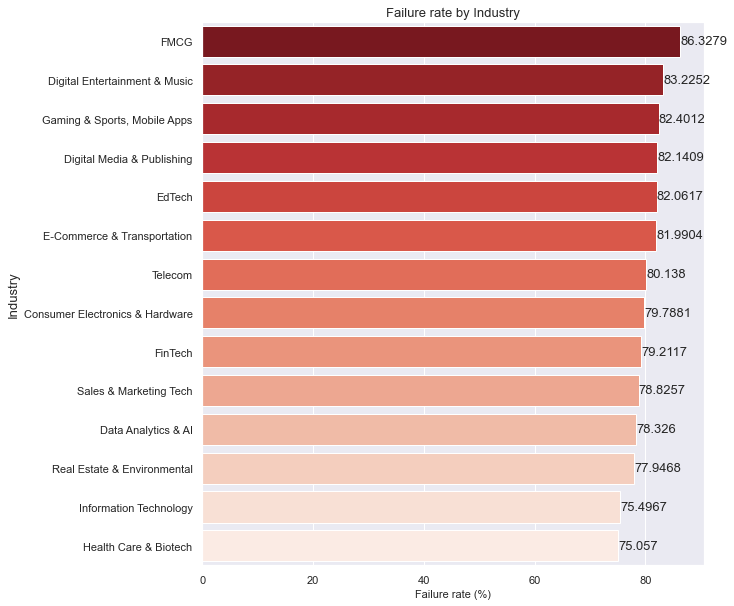

In [ ]:
palette = sns.color_palette("Reds", n_colors=14)
palette.reverse()

Bar_Plot = sns.barplot(
    data=failed_ratio_only,
    x='n_pct',
    y='category',
    palette=palette
)

Bar_Plot.set_xlabel("Failure rate (%)", fontsize=11)
Bar_Plot.set_ylabel("Industry", fontsize=13)
Bar_Plot.bar_label(Bar_Plot.containers[0], fontsize=13)
Bar_Plot.set_title("Failure rate by Industry", fontsize=13)

plt.gcf().set_size_inches(9, 10)


In [ ]:
options = ['SGP', 'KOR']
filtered_country = df[df['country_code'].isin(options)]
filtered_country

,uuid,name,rank,country_code,status,num_funding_rounds,total_funding_usd,founded_on,last_funding_on,employee_count,...,age_Acquired,age_years,success,age_success,age_closed,homepage_active,category,category_num,has_VC_investor,has_angel_investor
426,9ffdc2cd-a6a8-12a0-a57f-5ff75c5f4f2d,StoryBlender,1057555,KOR,closed,1,1500000.0,2005-01-01,2007-04-01,1,...,NaN,12.0,0,NaN,NaN,1,Telecom,Industry 10,0,0
591,2eadc422-ef94-6e5a-cdf2-c95e354456d3,vSocial,266628,SGP,operating,2,2408000.0,2005-01-01,2007-09-01,1,...,NaN,12.0,0,NaN,NaN,1,Telecom,Industry 10,1,1
1029,5e6dc493-5df3-0481-9fda-a70c9c319ed8,Paprika Lab,414706,KOR,closed,2,3200000.0,2007-09-19,2010-10-01,1,...,4.7,9.3,0,NaN,4.7,1,EdTech,Industry 1,0,0
1322,13a3f411-ce74-8b0e-c746-37b19267050c,Bubbly,51220,SGP,acquired,5,40000000.0,2005-01-01,2012-08-23,1,...,9.6,12.0,1,9.6,NaN,1,Telecom,Industry 10,1,0
1381,b5d3ca63-9c87-deda-74dc-686352228d8a,Pandora.TV,174039,KOR,closed,2,16000000.0,2004-10-01,2007-04-03,1,...,NaN,12.2,0,NaN,NaN,1,Digital Media & Publishing,Industry 5,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115083,e24708b8-217c-4da1-8083-7bf6a4017b1c,Hyundai Glovis,35499,KOR,ipo,1,506726163.0,2001-02-22,2022-01-06,3,...,NaN,15.9,1,9.6,NaN,1,E-Commerce & Transportation,Industry 9,0,0
115336,a5dd6eb8-5edd-46a7-a48c-da64e6c35c47,Himnanda,81664,KOR,operating,2,1549473.0,2015-01-01,2021-12-01,0,...,NaN,2.0,0,NaN,NaN,1,FMCG,Industry 11,1,0
115506,78fbd5e0-eb97-40ea-8e17-5b5e24fd2904,Inanomo,31514,SGP,operating,1,6000000.0,2015-01-01,2022-03-16,2,...,NaN,2.0,0,NaN,NaN,1,FinTech,Industry 6,0,0
115611,816705a8-1a94-497c-a362-3a727259ae4b,Doosan Mobility Innovation,36304,KOR,operating,1,22231534.0,2016-01-01,2022-04-04,0,...,NaN,1.0,0,NaN,NaN,1,Real Estate & Environmental,Industry 2,1,0


Text(0.5, 1.0, 'The number of Startups in Singapore vs South Korea')

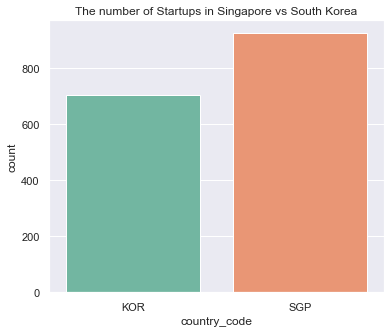

In [ ]:
plt.figure(figsize=(6,5))

Bar_Plot = sns.countplot(
    data=filtered_country,
    x='country_code',
    palette='Set2')

Bar_Plot.set_title("The number of Startups in Singapore vs South Korea")

Text(0.5, 1.0, 'Frequeny distribution of Staus for Category')

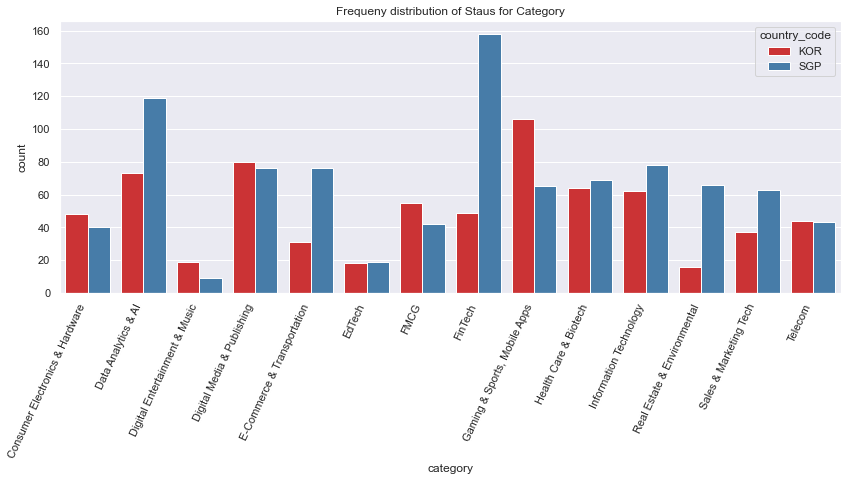

In [ ]:
plt.figure(figsize=(14,5))

Bar_Plot = sns.countplot(
    data=filtered_country,
    x='category',
    hue='country_code',
    palette='Set1'
)

Bar_Plot.set_xticklabels(Bar_Plot.get_xticklabels(), rotation=65, horizontalalignment='right')
Bar_Plot.set_title("Frequeny distribution of Staus for Category")

In [ ]:
df_SGP = filtered_country[filtered_country['country_code']=='SGP']
df_KOR = filtered_country[filtered_country['country_code']=='KOR']

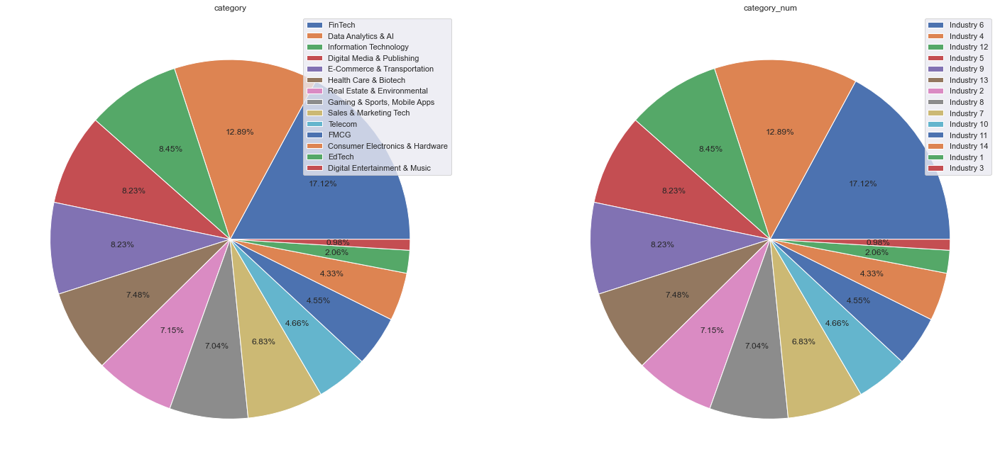

In [ ]:
# Plot - How does distribution of all variables look like in overall in SINGAPORE
import math
from matplotlib.pyplot import figure

cat_columns = ['category', 'category_num']
    
f, axes = plt.subplots(math.ceil(len(cat_columns)/2),2, figsize=(25,30))
for col, ax in zip(cat_columns, axes.ravel()):
        data = df_SGP[col].value_counts().values.tolist()
        labels = df_SGP[col].value_counts().index.tolist()
        ax.pie(data,autopct='%0.2f%%')
        ax.set_title(col)
        ax.legend(labels,loc='best')

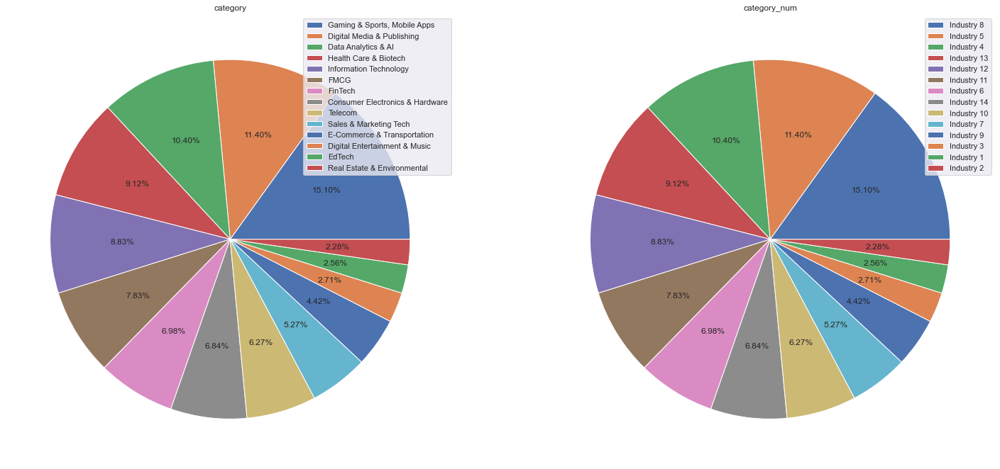

In [ ]:
# Plot - How does distribution of all variables look like in overall in SOUTH KOREA
import math
from matplotlib.pyplot import figure

cat_columns = ['category', 'category_num']
    
f, axes = plt.subplots(math.ceil(len(cat_columns)/2),2, figsize=(25,30))
for col, ax in zip(cat_columns, axes.ravel()):
        data = df_KOR[col].value_counts().values.tolist()
        labels = df_KOR[col].value_counts().index.tolist()
        ax.pie(data,autopct='%0.2f%%')
        ax.set_title(col)
        ax.legend(labels,loc='best')

Text(0.5, 1.0, 'Frequeny distribution of Success for Category')

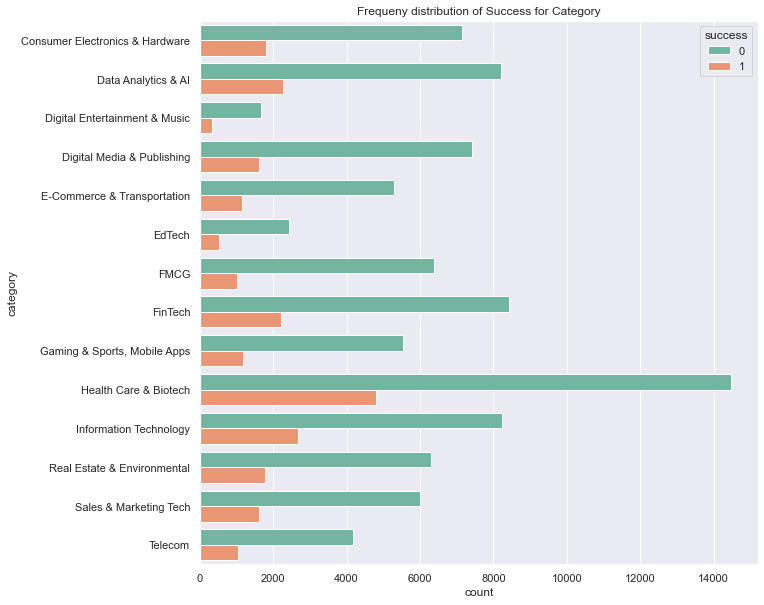

In [ ]:
plt.figure(figsize=(10,10))

Bar_Plot = sns.countplot(
    data=df,
    y='category',
    hue='success',
    palette='Set2'
)

Bar_Plot.set_title("Frequeny distribution of Success for Category")


In [164]:
df_biotech = df[df['category']== 'Health Care & Biotech']
df_biotech

,uuid,name,rank,country_code,status,num_funding_rounds,total_funding_usd,founded_on,last_funding_on,employee_count,...,age_Acquired,age_years,success,age_success,age_closed,homepage_active,category,category_num,has_VC_investor,has_angel_investor
190,992a336f-6710-fc12-5856-15bdd1a6eb5c,Lively,30638,USA,acquired,4,81707100.00000,2006-01-01,2012-06-21,2,...,11.40000,11.00000,1,11.40000,NaN,1,Health Care & Biotech,Industry 13,1,0
333,0523073c-9f57-8f41-905d-9d971a21a6bd,Care.com,1171,USA,acquired,7,156850000.00000,2006-10-01,2016-06-29,2,...,13.20000,10.30000,1,13.20000,NaN,1,Health Care & Biotech,Industry 13,1,1
494,f93d65c7-11da-f085-0bdd-d54510f77a41,23andMe,18289,USA,ipo,19,1118573609.00000,2006-04-01,2021-06-17,2,...,NaN,10.80000,1,15.20000,NaN,1,Health Care & Biotech,Industry 13,1,1
626,0131c0b9-f013-50f6-e33e-7d0067e80f71,RealSelf,8190,USA,operating,4,41950000.00000,2006-10-01,2018-08-10,2,...,NaN,10.30000,0,NaN,NaN,1,Health Care & Biotech,Industry 13,1,1
629,f6d81c22-5682-702c-2ea4-10652265078a,Caring.com,30436,USA,acquired,4,23519998.00000,2007-01-01,2013-05-24,2,...,7.30000,10.00000,1,7.30000,NaN,1,Health Care & Biotech,Industry 13,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115675,7f55fbf8-1fdc-4bbc-987a-9677d115a251,HomeLink Healthcare,111008,GBR,operating,1,3448882.00000,2015-01-01,2022-04-20,2,...,NaN,2.00000,0,NaN,NaN,1,Health Care & Biotech,Industry 13,1,0
115680,f969186a-88be-4ee6-b12b-85beba56cd26,Biopharma,145209,CHN,operating,1,7819831.00000,2014-01-01,2022-04-19,1,...,NaN,3.00000,0,NaN,NaN,1,Health Care & Biotech,Industry 13,1,0
115681,86be7e64-befe-4a5b-af4f-fa0e298e80c2,Mercy Health Clinic,309710,USA,operating,1,20000.00000,2000-01-01,2022-04-21,1,...,NaN,17.00000,0,NaN,NaN,1,Health Care & Biotech,Industry 13,0,0
115687,9b631de9-8b0d-46e5-884b-a386163cdd0c,PROVA Innovations,<NA>,CAN,operating,1,39578.00000,2015-01-01,2022-04-22,0,...,NaN,2.00000,0,NaN,NaN,1,Health Care & Biotech,Industry 13,0,0


In [165]:
df_game = df[df['category']== 'Gaming & Sports, Mobile Apps']
df_game

,uuid,name,rank,country_code,status,num_funding_rounds,total_funding_usd,founded_on,last_funding_on,employee_count,...,age_Acquired,age_years,success,age_success,age_closed,homepage_active,category,category_num,has_VC_investor,has_angel_investor
49,301ed09b-263f-660e-fd1c-eaac39b549b9,iSkoot,254590,USA,acquired,3,32200000.00000,2005-04-22,2008-11-07,3,...,5.50000,11.70000,1,5.50000,NaN,1,"Gaming & Sports, Mobile Apps",Industry 8,1,0
57,e4d10a5e-9ec1-88b6-9acf-d8585c89bcb3,Yelp,22734,USA,ipo,6,56000000.00000,2004-01-01,2010-01-27,3,...,NaN,13.00000,1,8.20000,NaN,1,"Gaming & Sports, Mobile Apps",Industry 8,1,1
65,2c0b76f3-f98d-e778-7fc9-d057f93fe995,RockYou,12993,USA,closed,15,187725336.00000,2005-11-01,2017-01-01,2,...,NaN,11.20000,0,NaN,13.20000,1,"Gaming & Sports, Mobile Apps",Industry 8,1,0
121,200f1b82-93c9-7b1a-c0ed-37d6fda3199f,Socialtext,217129,USA,closed,9,47620000.00000,2002-12-01,2012-05-01,1,...,9.40000,14.10000,0,NaN,NaN,1,"Gaming & Sports, Mobile Apps",Industry 8,1,1
128,ed54b2d5-f2f1-d4e9-9bbe-40961ff08d44,Action Engine,279249,USA,acquired,5,58200000.00000,2000-02-01,2007-07-01,1,...,8.70000,16.90000,1,8.70000,NaN,1,"Gaming & Sports, Mobile Apps",Industry 8,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115500,538a412e-5e56-4a76-8e46-0b0b5a47e1c7,Gray Lake Studios,104657,NLD,operating,1,200000.00000,2010-12-20,2022-02-01,1,...,NaN,6.00000,0,NaN,NaN,1,"Gaming & Sports, Mobile Apps",Industry 8,0,0
115555,a26517e4-4b05-4815-9ee2-fc7d4a3393c1,1080Motion,107367,SWE,operating,1,600000.00000,2013-12-05,2021-10-05,1,...,NaN,3.10000,0,NaN,NaN,1,"Gaming & Sports, Mobile Apps",Industry 8,0,0
115608,85937283-b9b1-4f85-bcc8-4bdaad1cec46,Silks,22144,USA,operating,1,2000000.00000,2015-01-01,2022-04-01,1,...,NaN,2.00000,0,NaN,NaN,1,"Gaming & Sports, Mobile Apps",Industry 8,0,0
115644,82355d44-5352-444a-bafd-ff2892f809a4,Corrida Perfeita,110144,NaN,operating,1,340455.00000,2016-01-01,2022-04-08,0,...,NaN,1.00000,0,NaN,NaN,1,"Gaming & Sports, Mobile Apps",Industry 8,0,0


Text(0.5, 1.0, 'Frequeny distribution of Gaming & Sports, Mobile Apps startups around countries')

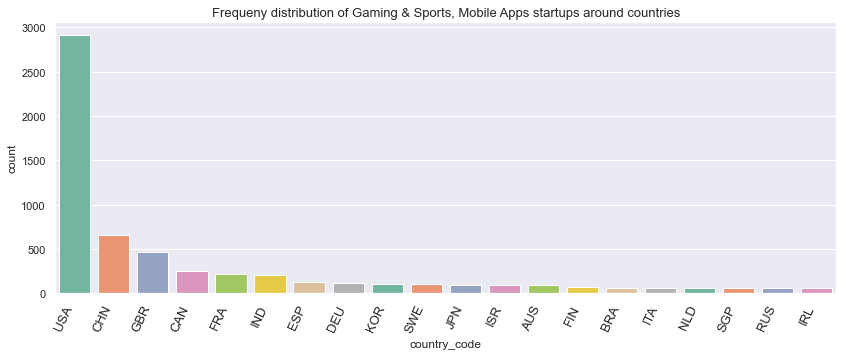

In [166]:
plt.figure(figsize=(14,5))

Bar_Plot = sns.countplot(
    data=df_game,
    x='country_code',
    palette='Set2',
    order=df_game.country_code.value_counts().iloc[:20].index
)

Bar_Plot.set_xticklabels(Bar_Plot.get_xticklabels(), rotation=65, horizontalalignment='right')
Bar_Plot.set_title("Frequeny distribution of Gaming & Sports, Mobile Apps startups around countries")

<Figure size 1440x720 with 0 Axes>

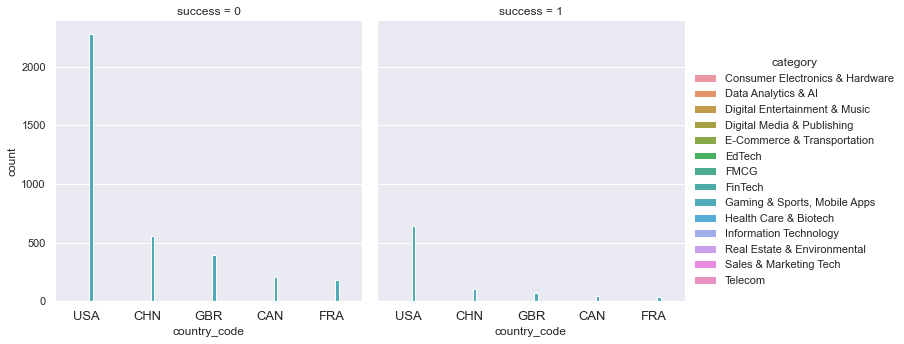

In [167]:
plt.figure(figsize=(20,10))

g = sns.catplot(x="country_code", hue="category", col="success",
                data=df_game, kind="count",
                order=df_game.country_code.value_counts().iloc[:5].index)
                #height=4, aspect=.7)

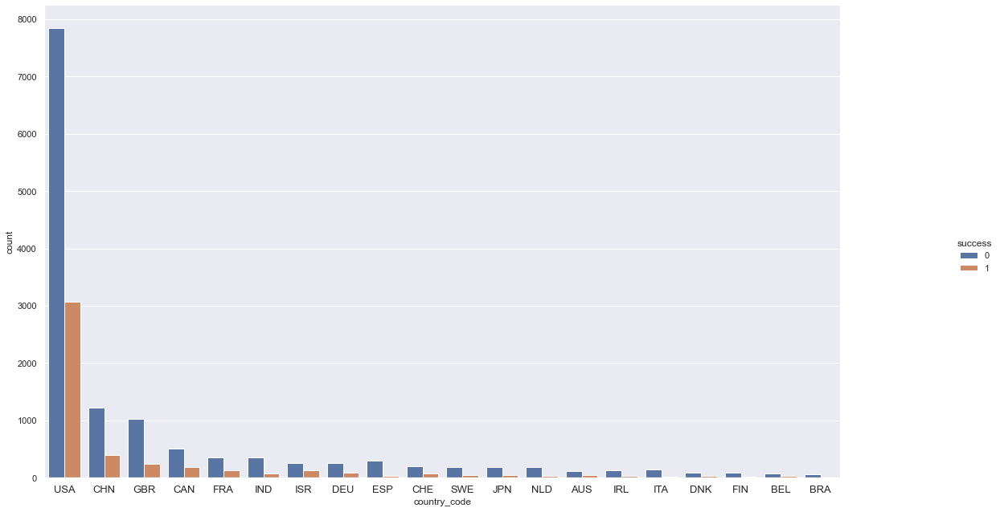

In [168]:
sns.catplot(x="country_code", hue="success",
                data=df_biotech, kind="count",
                order=df_biotech.country_code.value_counts().iloc[:20].index)
                #height=4, aspect=.7)

plt.gcf().set_size_inches(20, 10)


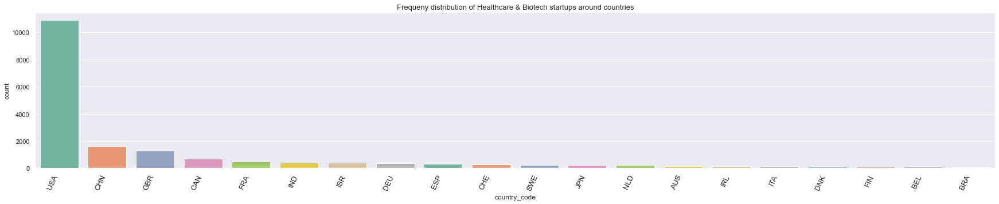

In [169]:
Bar_Plot = sns.countplot(
    data=df_biotech,
    x='country_code',
    palette='Set2',
    order=df_biotech.country_code.value_counts().iloc[:20].index
)

Bar_Plot.set_xticklabels(Bar_Plot.get_xticklabels(), rotation=65, horizontalalignment='right')
Bar_Plot.set_title("Frequeny distribution of Healthcare & Biotech startups around countries")

plt.gcf().set_size_inches(30, 5)


Text(0.5, 1.0, 'Frequeny distribution of industy for Success')

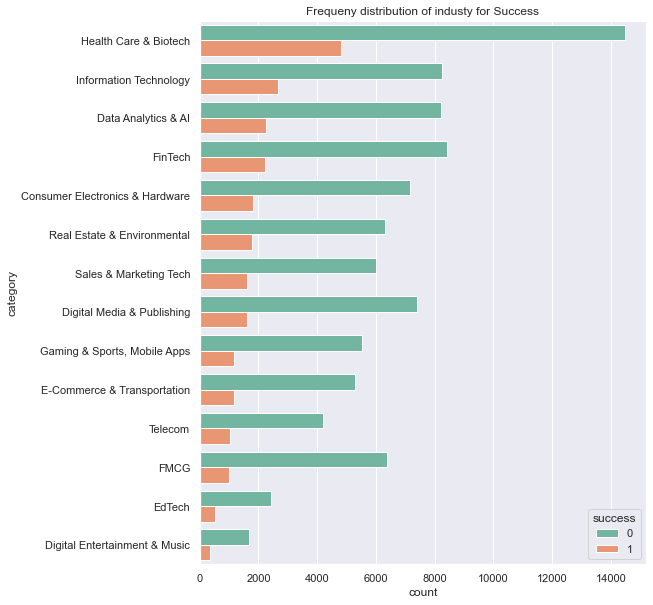

In [ ]:
plt.figure(figsize=(8,10))

order = pd.crosstab(df.category, df.success).sort_values(1, ascending=False).index

Bar_Plot = sns.countplot(
    data=df,
    y='category',
    hue='success',
    palette='Set2',
    order=order
)
# order=df.groupby('success').size().sort_values().index[::-1]
Bar_Plot.set_title("Frequeny distribution of industy for Success")

In [172]:
# Load dataset
success_ratio_only = pd.read_csv("~/Master thesis/data_cleaned/success_ratio_only_v2.csv") 
failed_ratio_only = pd.read_csv("~/Master thesis/data_cleaned/failed_ratio_only_v2.csv")

In [173]:
success_ratio_only= success_ratio_only.sort_values('n_pct', ascending=False)
success_ratio_only.head()

,category,success,n,n_pct
9,Health Care & Biotech,1,4811,24.94297
10,Information Technology,1,2676,24.50325
11,Real Estate & Environmental,1,1783,22.05318
1,Data Analytics & AI,1,2271,21.67398
12,Sales & Marketing Tech,1,1612,21.17431


In [174]:
failed_ratio_only= failed_ratio_only.sort_values('n_pct', ascending=False)
failed_ratio_only.head()

,category,success,n,n_pct
7,FMCG,0,6371,86.32791
2,Digital Entertainment & Music,0,1667,83.22516
8,"Gaming & Sports, Mobile Apps",0,5525,82.40119
3,Digital Media & Publishing,0,7405,82.14088
5,EdTech,0,2420,82.06172


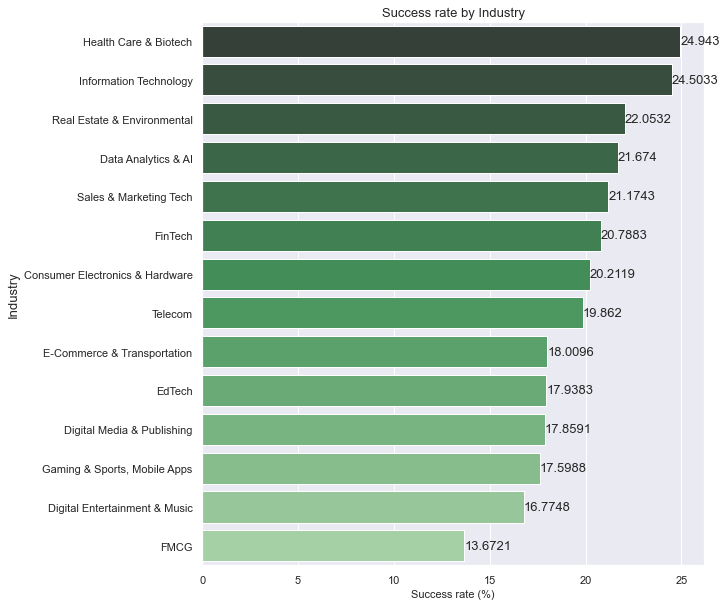

In [11]:
palette = sns.color_palette("Greens_d", n_colors=14)
palette.reverse()

Bar_Plot = sns.barplot(
    data=success_ratio_only,
    x='n_pct',
    y='category',
    palette=palette
)

Bar_Plot.set_xlabel("Success rate (%)", fontsize=11)
Bar_Plot.set_ylabel("Industry", fontsize=13)
Bar_Plot.bar_label(Bar_Plot.containers[0], fontsize=13)
Bar_Plot.set_title("Success rate by Industry", fontsize=13)

plt.gcf().set_size_inches(9, 10)


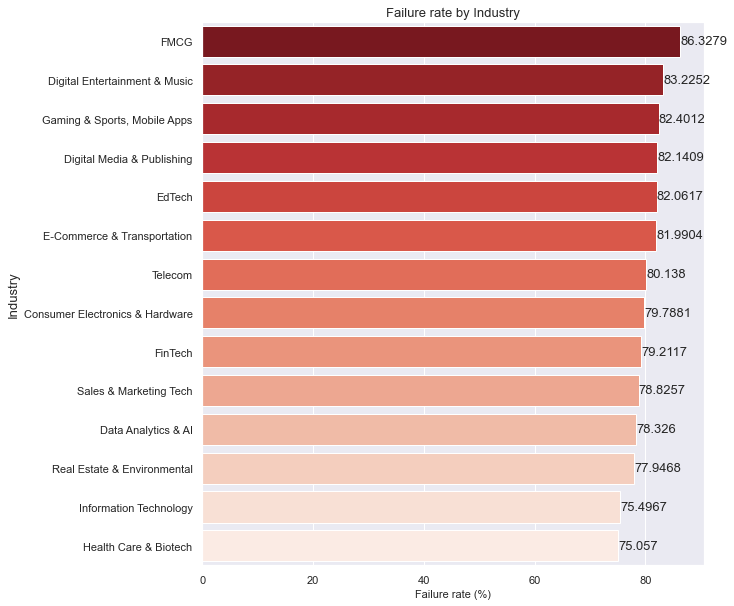

In [12]:
palette = sns.color_palette("Reds", n_colors=14)
palette.reverse()

Bar_Plot = sns.barplot(
    data=failed_ratio_only,
    x='n_pct',
    y='category',
    palette=palette
)

Bar_Plot.set_xlabel("Failure rate (%)", fontsize=11)
Bar_Plot.set_ylabel("Industry", fontsize=13)
Bar_Plot.bar_label(Bar_Plot.containers[0], fontsize=13)
Bar_Plot.set_title("Failure rate by Industry", fontsize=13)

plt.gcf().set_size_inches(9, 10)


In [ ]:
funding_sorted_category = pd.pivot_table(df,
              index=['category'],
              values=['total_funding_usd'],
              aggfunc=['sum', 'mean']
              ).reset_index()
funding_sorted_category.columns = ['category', 'total_funding_usd', 'average_total_funding_usd']
funding_sorted_category = funding_sorted_category.sort_values(['average_total_funding_usd'], ascending = False)
funding_sorted_category.head(10)

,category,total_funding_usd,average_total_funding_usd
11,Real Estate & Environmental,3.422208e+11,4.232786e+07
7,FinTech,3.948233e+11,3.713887e+07
9,Health Care & Biotech,6.560394e+11,3.401282e+07
4,E-Commerce & Transportation,1.724815e+11,2.677869e+07
1,Data Analytics & AI,2.449862e+11,2.338100e+07
10,Information Technology,2.455020e+11,2.247981e+07
0,Consumer Electronics & Hardware,1.907200e+11,2.127384e+07
13,Telecom,1.032177e+11,1.978868e+07
5,EdTech,5.503269e+10,1.866148e+07
3,Digital Media & Publishing,1.520645e+11,1.686794e+07


In [6]:
# global setting for use normal number, not exponential
pd.set_option('display.float_format', lambda x: '%.5f' %x)

In [ ]:
funding_sorted_category.style.set_precision(precision=0)

/var/folders/t_/dwstmp493p7gx9yhs6_r4cyr0000gn/T/ipykernel_8217/4199922853.py:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  funding_sorted_category.style.set_precision(precision=0)


,category,total_funding_usd,average_total_funding_usd
11,Real Estate & Environmental,342220751148,42327860
7,FinTech,394823325098,37138870
9,Health Care & Biotech,656039353499,34012824
4,E-Commerce & Transportation,172481544942,26778690
1,Data Analytics & AI,244986161124,23381004
10,Information Technology,245501978573,22479808
0,Consumer Electronics & Hardware,190719983345,21273841
13,Telecom,103217742261,19788678
5,EdTech,55032690964,18661475
3,Digital Media & Publishing,152064490955,16867941


In [ ]:
funding_sorted_category_2 = funding_sorted_category.sort_values(['total_funding_usd'], ascending = False)
funding_sorted_category_2.style.set_precision(precision=0)

/var/folders/t_/dwstmp493p7gx9yhs6_r4cyr0000gn/T/ipykernel_8217/1720809570.py:2: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  funding_sorted_category_2.style.set_precision(precision=0)


,category,total_funding_usd,average_total_funding_usd
9,Health Care & Biotech,656039353499,34012824
7,FinTech,394823325098,37138870
11,Real Estate & Environmental,342220751148,42327860
10,Information Technology,245501978573,22479808
1,Data Analytics & AI,244986161124,23381004
0,Consumer Electronics & Hardware,190719983345,21273841
4,E-Commerce & Transportation,172481544942,26778690
3,Digital Media & Publishing,152064490955,16867941
6,FMCG,120392728518,16313378
12,Sales & Marketing Tech,119867000016,15745041


In [55]:
# Load dataset
funding_sorted_category = pd.read_csv("/Users/jiyoung/Master thesis/data_cleaned/fundingamount_by_category_avg.csv") 
funding_sorted_category_2 = pd.read_csv("/Users/jiyoung/Master thesis/data_cleaned/fundingamount_by_category_total.csv")

Text(0.5, 1.0, 'Average Funding USD($) by Industry')

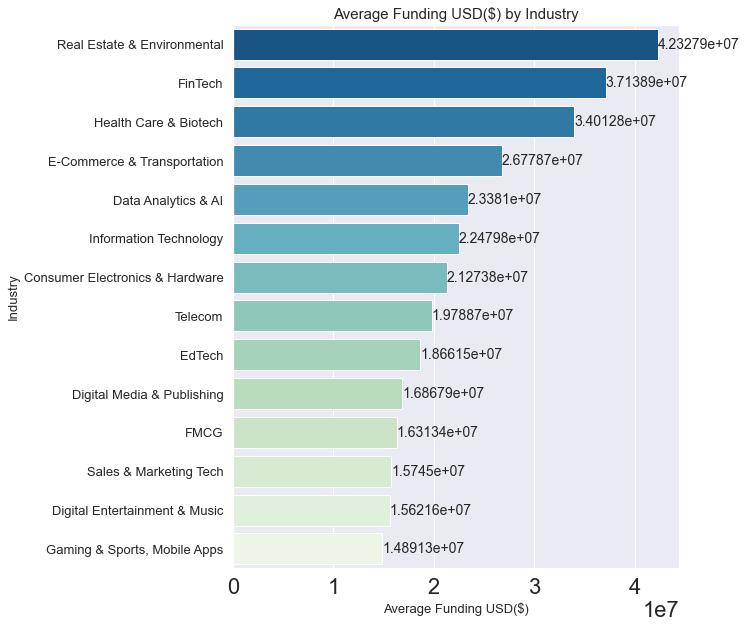

In [58]:
fig, ax = plt.subplots(figsize=(8,10))

palette = sns.color_palette("GnBu", n_colors=14)
palette.reverse()

Bar_Plot = sns.barplot(
    data=funding_sorted_category,
    x='average_total_funding_usd',
    y='category',
    palette=palette,
    order=funding_sorted_category.sort_values('average_total_funding_usd',ascending = False).category
    )

_, ylabels = plt.yticks()
Bar_Plot.set_xlabel("Average Funding USD($)", fontsize=13)
Bar_Plot.set_ylabel("Industry", fontsize=13)
Bar_Plot.bar_label(Bar_Plot.containers[0], fontsize=14)
sns.set(font_scale = 2)
Bar_Plot.set_yticklabels(ylabels, size=13)
Bar_Plot.set_title("Average Funding USD($) by Industry", fontsize=15)

Text(0.5, 1.0, 'Total Funding USD($) by Industry')

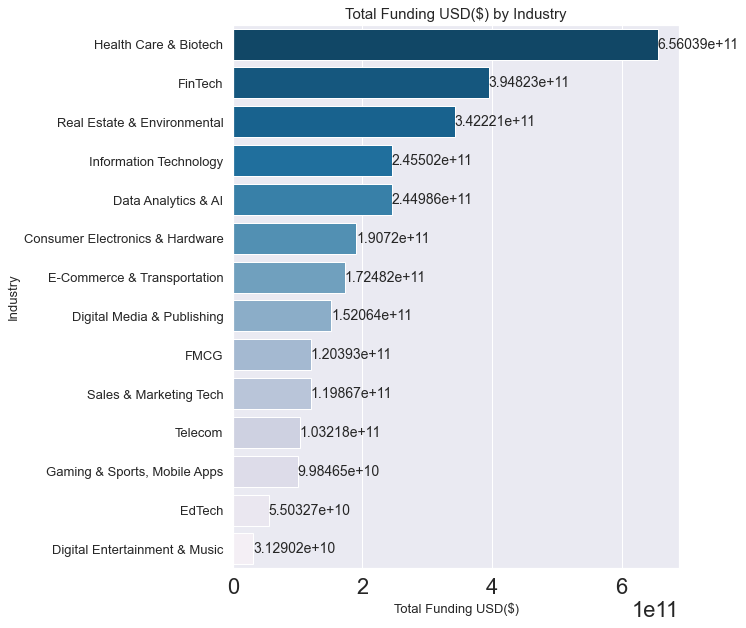

In [57]:
fig, ax = plt.subplots(figsize=(8,10))

palette = sns.color_palette("PuBu", n_colors=14)
palette.reverse()

Bar_Plot = sns.barplot(
    data=funding_sorted_category_2,
    x='total_funding_usd',
    y='category',
    palette=palette,
    order=funding_sorted_category_2.sort_values('total_funding_usd',ascending = False).category
    )

_, ylabels = plt.yticks()
Bar_Plot.set_xlabel("Total Funding USD($)", fontsize=13)
Bar_Plot.set_ylabel("Industry", fontsize=13)
Bar_Plot.bar_label(Bar_Plot.containers[0], fontsize=14)
sns.set(font_scale = 2)
Bar_Plot.set_yticklabels(ylabels, size=13)
Bar_Plot.set_title("Total Funding USD($) by Industry", fontsize=15)

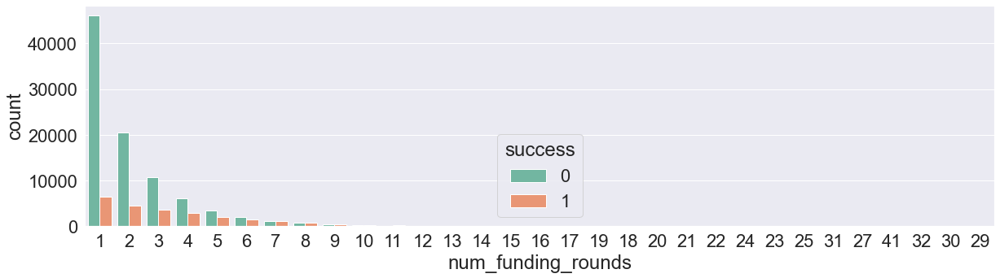

In [ ]:
#which funding_rounds related to acquired or closed startup?
fig, ax = plt.subplots(figsize=(20,5))

ax = sns.countplot(x="num_funding_rounds", hue="success", data=df, palette="Set2",
              order=df.num_funding_rounds.value_counts().index)
# plt.legend(bbox_to_anchor=(0.945, 0.90))

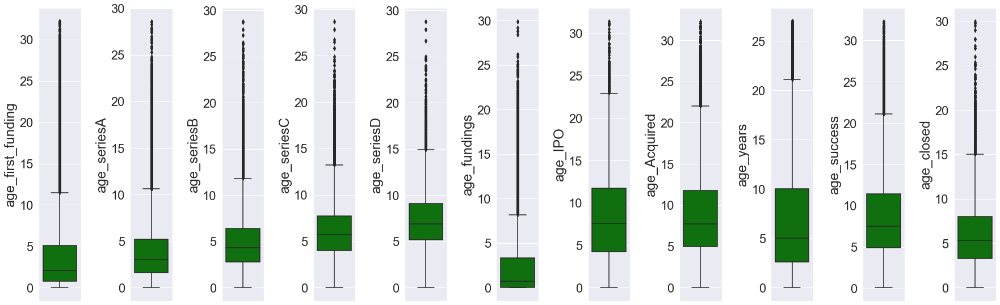

In [ ]:
featuresNumfinal = ['age_first_funding','age_seriesA','age_seriesB','age_seriesC','age_seriesD','age_fundings','age_IPO','age_Acquired','age_years', 'age_success', 'age_closed']

plt.figure(figsize=(25, 8))
for i in range(0, len(featuresNumfinal)):
    plt.subplot(1, len(featuresNumfinal), i+1)
    sns.boxplot(y=df[featuresNumfinal[i]], color='green', orient='v')
    plt.tight_layout()

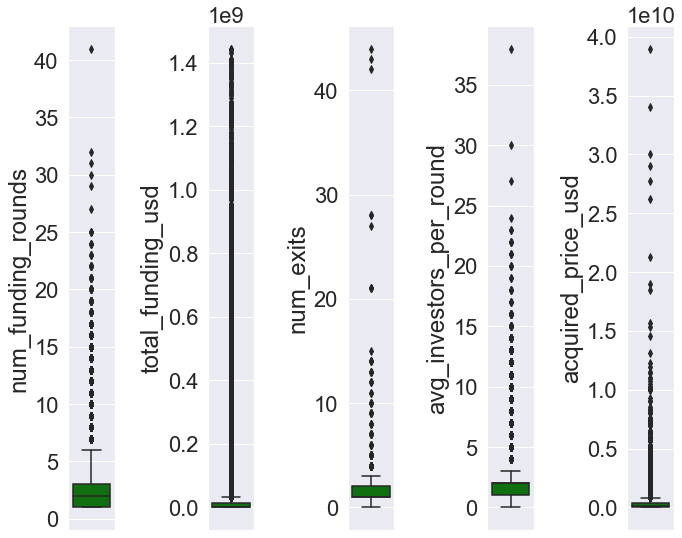

In [ ]:
featuresNumfinal2 = ['num_funding_rounds','total_funding_usd','num_exits','avg_investors_per_round','acquired_price_usd']

plt.figure(figsize=(10, 8))
for i in range(0, len(featuresNumfinal2)):
    plt.subplot(1, len(featuresNumfinal2), i+1)
    sns.boxplot(y=df[featuresNumfinal2[i]], color='green', orient='v')
    plt.tight_layout()

Text(0.5, 0.98, '')

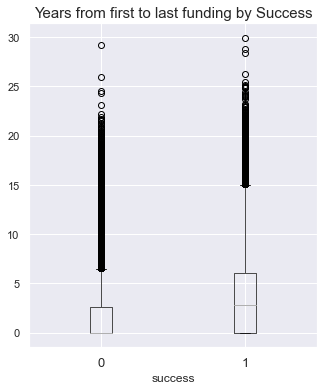

In [202]:
# Generating boxplot for age_fundings Vs Success
axes = df.boxplot(column='age_fundings', by='success', figsize=(5,6))
axes.set_title("Years from first to last funding by Success", fontsize=15)
plt.suptitle('')

Text(0.5, 0.98, '')

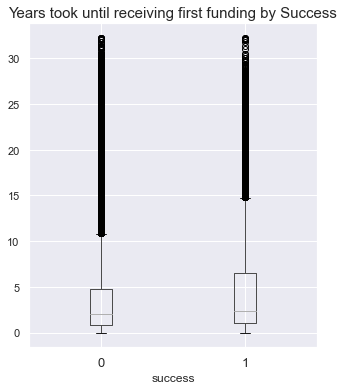

In [198]:
# Generating boxplot for age_first_funding Vs Success
axes = df.boxplot(column='age_first_funding', by='success', figsize=(5,6))
axes.set_title("Years took until receiving first funding by Success", fontsize=15)
plt.suptitle('')

Text(0.5, 0.98, '')

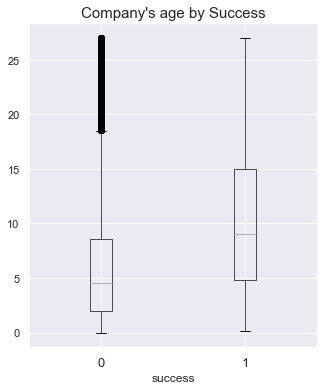

In [197]:
# Generating boxplot for company's age_years Vs Success
axes = df.boxplot(column='age_years', by='success', figsize=(5,6))
axes.set_title("Company's age by Success", fontsize=15)
plt.suptitle('')

Text(0.5, 0.98, '')

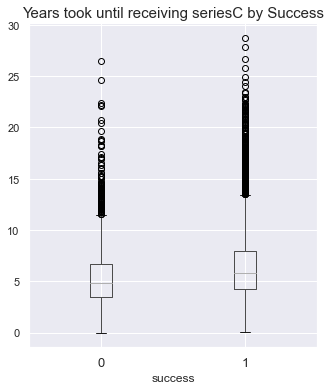

In [184]:
# Generating boxplot for company's age_years Vs Success
axes = df.boxplot(column='age_seriesC', by='success', figsize=(5,6))
axes.set_title("Years took until receiving seriesC by Success", fontsize=15)
plt.suptitle('')

Text(0.5, 0.98, '')

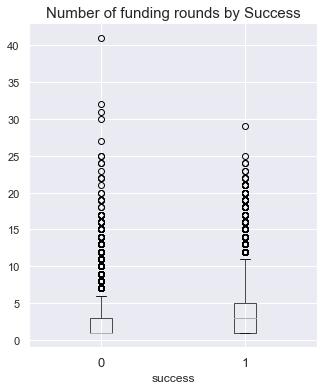

In [191]:
# Generating boxplot for company's age_years Vs Success
axes = df.boxplot(column='num_funding_rounds', by='success', figsize=(5,6))
axes.set_title("Number of funding rounds by Success", fontsize=15)
plt.suptitle('')

Text(0.5, 0.98, '')

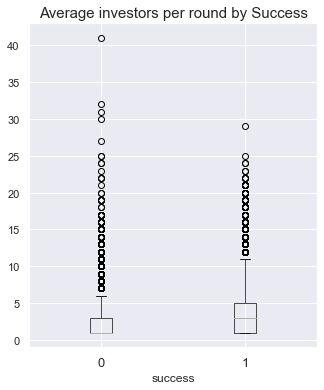

In [192]:
# Generating boxplot for company's age_years Vs Success
axes = df.boxplot(column='num_funding_rounds', by='success', figsize=(5,6))
axes.set_title("Average investors per round by Success", fontsize=15)
plt.suptitle('')

In [193]:
# Calculate natural logarithm on 'total_funding_usd' column
data_log = df.copy()
data_log['natural_log_total_funding_usd'] = np.log(data_log['total_funding_usd'])


# Calculate logarithm to base 10 on 'total_funding_usd' column
data_log['logarithm_base10_total_funding_usd'] = np.log10(data_log['total_funding_usd'])

# Calculate logarithm to base 2 on 'total_funding_usd' column
data_log['logarithm_base2_total_funding_usd'] = np.log2(data_log['total_funding_usd'])
  

Text(0.5, 0.98, '')

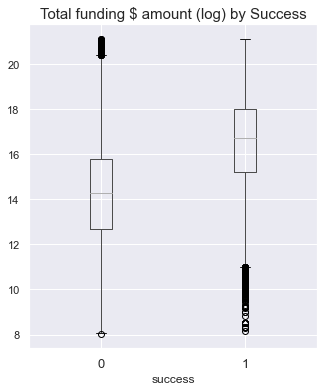

In [196]:
# Generating boxplot for Natural_log_total_funding_usd Vs Success
axes = data_log.boxplot(column='natural_log_total_funding_usd', by='success', figsize=(5,6))
axes.set_title("Total funding $ amount (log) by Success", fontsize=15)
plt.suptitle('')

[Text(0.5, 0, 'num_funding_rounds'), Text(0, 0.5, 'total_funding_usd')]

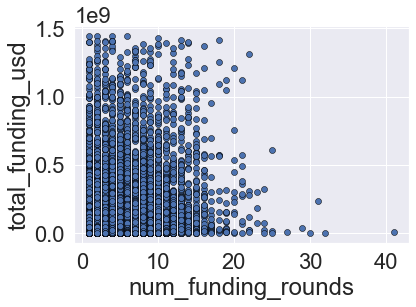

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
fig, ax = plt.subplots()
plt.scatter(x=df['num_funding_rounds'], y=df['total_funding_usd'], edgecolors="#000000", linewidths=0.5)
ax.set(xlabel="num_funding_rounds", ylabel="total_funding_usd")

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115690 entries, 0 to 115689
Data columns (total 65 columns):
 #   Column                     Non-Null Count   Dtype   
---  ------                     --------------   -----   
 0   uuid                       115690 non-null  object  
 1   name                       115690 non-null  object  
 2   rank                       115687 non-null  Int64   
 3   country_code               115330 non-null  object  
 4   status                     115690 non-null  category
 5   num_funding_rounds         115690 non-null  Int64   
 6   total_funding_usd          115690 non-null  float64 
 7   founded_on                 115690 non-null  object  
 8   last_funding_on            115690 non-null  object  
 9   employee_count             115690 non-null  category
 10  primary_role               115690 non-null  object  
 11  num_exits                  795 non-null     Int64   
 12  first_funding_on           115690 non-null  object  
 13  avg_investors_

#### **Cleaning whole dataset before splitting and do feature selection & engineering**
**1) Remove unnecessary variables (columns) from dataset**

***On Whole dataset***

In [15]:
# Drop all columns which don't require/need for our modelling (but kept it just bcz previously only needed for EDA) like organization name, uuid, etc.) 
# 17 variables dropped
df_final = df.drop(['uuid', 'name', 'country_code', 'founded_on', 'last_funding_on', 'primary_role', 'first_funding_on', 'acquirer_country_code', 'acquirer_city',
'acquisition_type', 'acquired_on', 'IPO_on', 'investor_uuid', 'investor_name', 'investor_country_code', 'investor_city', 'category'], axis=1)

In [ ]:
# df_final.to_csv('df_final_before_split_ver0.csv')

***On Additional/Extra Test dataset (2016~2020)***

In [16]:
# Load Additional/Extra Test dataset
df_extra_testset = pd.read_csv("/Users/jiyoung/Master thesis/data_cleaned/df_extra_testset.csv")

In [17]:
# drop all columns which don't require/need for our modelling 
# (but kept it just bcz previously only needed for EDA) like organization name, uuid, etc.
# also from extra test set
# 17 variables dropped

df_extra_testset_final = df_extra_testset.drop(['uuid', 'name', 'country_code', 'founded_on', 'last_funding_on', 'primary_role', 'first_funding_on', 'acquirer_country_code', 'acquirer_city',
'acquisition_type', 'acquired_on', 'IPO_on', 'investor_uuid', 'investor_name', 'investor_country_code', 'investor_city', 'category'], axis=1)

**2) Remove variables with too much high Missing ratio**  \
There were several variables created for checking in process of EDA, but it's necessary to check if it can be also used in Modeling by checking NA(Missing) ratio  \
(Checked missing ratio in R, the variables to drop are as below (we cannot keep the variables with over 70% missing ratio and it's not easy to imputate or even have risk of distort the data itself by imputating without domain expert knowledge in this case). Therefore, these 10 variables were dropped due to high missing ratio from both whole dataset and additional/extra test dataset)

In [18]:
# From whole dataset
df_final = df_final.drop(['num_exits', 'age_seriesD', 'acquired_price_usd', 'age_IPO', 'age_closed', 'age_seriesC', 'age_Acquired', 'age_seriesB', 'age_success', 'age_seriesA'], axis=1)

In [19]:
# From Additional/Extra Test dataset
df_extra_testset_final = df_extra_testset_final.drop(['num_exits', 'age_seriesD', 'acquired_price_usd', 'age_IPO', 'age_closed', 'age_seriesC', 'age_Acquired', 'age_seriesB', 'age_success', 'age_seriesA'], axis=1)

In [ ]:
# # save whole dataset before Splitting
# # 115690 obs
# df_final.to_csv('df_final_before_split.csv')

# # save additional/extra test dataset before Splitting
# # 33472 obs
# df_extra_testset_final.to_csv('df_extra_testset_final_before_split.csv')

**3) Remove variables with 'OK' missing ratio to be used in models like LR** \
There are still some NA in variables avg_investors_per_rond & investor_rank because most of those NA companies didn't have investor related information(data) (some of them are closed, operating, etc...)
Even though those variables with missing values are assigned as 'OK' in missing plot checked in R, \
the rows containing NA value in those variables were dropped to make our data to be used in models like Logistic regression 

In [20]:
df_final.info()

#CHECK TARGET VAR PERCENTAGE(BALANCE AFTER REMOVE NA ROWS)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115690 entries, 0 to 115689
Data columns (total 38 columns):
 #   Column                     Non-Null Count   Dtype   
---  ------                     --------------   -----   
 0   rank                       115687 non-null  Int64   
 1   status                     115690 non-null  category
 2   num_funding_rounds         115690 non-null  Int64   
 3   total_funding_usd          115690 non-null  float64 
 4   employee_count             115690 non-null  category
 5   avg_investors_per_round    89948 non-null   Int64   
 6   has_angel                  115690 non-null  category
 7   has_pre_seed               115690 non-null  category
 8   has_seed                   115690 non-null  category
 9   has_seriesUnknown          115690 non-null  category
 10  has_seriesA                115690 non-null  category
 11  has_seriesB                115690 non-null  category
 12  has_seriesC                115690 non-null  category
 13  has_seriesD   

In [21]:
df_final.isnull().sum() # the ones with 'OK' sign for missing data ratio, I kept them as way it is like (avg_investors_per_round or investor_rank)

rank                             3
status                           0
num_funding_rounds               0
total_funding_usd                0
employee_count                   0
avg_investors_per_round      25742
has_angel                        0
has_pre_seed                     0
has_seed                         0
has_seriesUnknown                0
has_seriesA                      0
has_seriesB                      0
has_seriesC                      0
has_seriesD                      0
has_seriesE_J                    0
has_equity_crowdfunding          0
has_product_crowdfunding         0
has_private_equity               0
has_convertible_note             0
has_debt_financing               0
has_secondary_market             0
has_grant                        0
has_corporate_round              0
has_initial_coin_offering        0
has_post_ipo_equity              0
has_post_ipo_debt                0
has_post_ipo_secondary           0
has_non_equity_assistance        0
has_undisclosed     

In [22]:
df_extra_testset_final.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33472 entries, 0 to 33471
Data columns (total 38 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   rank                       33468 non-null  float64
 1   status                     33472 non-null  object 
 2   num_funding_rounds         33472 non-null  int64  
 3   total_funding_usd          33472 non-null  float64
 4   employee_count             33472 non-null  int64  
 5   avg_investors_per_round    25240 non-null  float64
 6   has_angel                  33472 non-null  int64  
 7   has_pre_seed               33472 non-null  int64  
 8   has_seed                   33472 non-null  int64  
 9   has_seriesUnknown          33472 non-null  int64  
 10  has_seriesA                33472 non-null  int64  
 11  has_seriesB                33472 non-null  int64  
 12  has_seriesC                33472 non-null  int64  
 13  has_seriesD                33472 non-null  int

In [23]:
df_extra_testset_final.isnull().sum() 

rank                            4
status                          0
num_funding_rounds              0
total_funding_usd               0
employee_count                  0
avg_investors_per_round      8232
has_angel                       0
has_pre_seed                    0
has_seed                        0
has_seriesUnknown               0
has_seriesA                     0
has_seriesB                     0
has_seriesC                     0
has_seriesD                     0
has_seriesE_J                   0
has_equity_crowdfunding         0
has_product_crowdfunding        0
has_private_equity              0
has_convertible_note            0
has_debt_financing              0
has_secondary_market            0
has_grant                       0
has_corporate_round             0
has_initial_coin_offering       0
has_post_ipo_equity             0
has_post_ipo_debt               0
has_post_ipo_secondary          0
has_non_equity_assistance       0
has_undisclosed                 0
investor_rank 

In [24]:
# Deleting the rows with missing data
# Even though those variables with missing values are assigned as 'OK' in missing plot checked in R, 
# the variables were dropped to make our data to be used in models like Logistic regression 

df_final = df_final.dropna(axis=0)
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89490 entries, 0 to 115686
Data columns (total 38 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   rank                       89490 non-null  Int64   
 1   status                     89490 non-null  category
 2   num_funding_rounds         89490 non-null  Int64   
 3   total_funding_usd          89490 non-null  float64 
 4   employee_count             89490 non-null  category
 5   avg_investors_per_round    89490 non-null  Int64   
 6   has_angel                  89490 non-null  category
 7   has_pre_seed               89490 non-null  category
 8   has_seed                   89490 non-null  category
 9   has_seriesUnknown          89490 non-null  category
 10  has_seriesA                89490 non-null  category
 11  has_seriesB                89490 non-null  category
 12  has_seriesC                89490 non-null  category
 13  has_seriesD                894

In [25]:
df_final.isnull().sum() 

rank                         0
status                       0
num_funding_rounds           0
total_funding_usd            0
employee_count               0
avg_investors_per_round      0
has_angel                    0
has_pre_seed                 0
has_seed                     0
has_seriesUnknown            0
has_seriesA                  0
has_seriesB                  0
has_seriesC                  0
has_seriesD                  0
has_seriesE_J                0
has_equity_crowdfunding      0
has_product_crowdfunding     0
has_private_equity           0
has_convertible_note         0
has_debt_financing           0
has_secondary_market         0
has_grant                    0
has_corporate_round          0
has_initial_coin_offering    0
has_post_ipo_equity          0
has_post_ipo_debt            0
has_post_ipo_secondary       0
has_non_equity_assistance    0
has_undisclosed              0
investor_rank                0
age_first_funding            0
age_fundings                 0
age_year

In [26]:
# Deleting the rows with missing data
# Even though those variables with missing values are assigned as 'OK' in missing plot checked in R, 
# the variables were dropped to make our data to be used in models like Logistic regression 

df_extra_testset_final = df_extra_testset_final.dropna(axis=0)
df_extra_testset_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25092 entries, 0 to 33463
Data columns (total 38 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   rank                       25092 non-null  float64
 1   status                     25092 non-null  object 
 2   num_funding_rounds         25092 non-null  int64  
 3   total_funding_usd          25092 non-null  float64
 4   employee_count             25092 non-null  int64  
 5   avg_investors_per_round    25092 non-null  float64
 6   has_angel                  25092 non-null  int64  
 7   has_pre_seed               25092 non-null  int64  
 8   has_seed                   25092 non-null  int64  
 9   has_seriesUnknown          25092 non-null  int64  
 10  has_seriesA                25092 non-null  int64  
 11  has_seriesB                25092 non-null  int64  
 12  has_seriesC                25092 non-null  int64  
 13  has_seriesD                25092 non-null  int

In [27]:
df_extra_testset_final.isnull().sum() 

rank                         0
status                       0
num_funding_rounds           0
total_funding_usd            0
employee_count               0
avg_investors_per_round      0
has_angel                    0
has_pre_seed                 0
has_seed                     0
has_seriesUnknown            0
has_seriesA                  0
has_seriesB                  0
has_seriesC                  0
has_seriesD                  0
has_seriesE_J                0
has_equity_crowdfunding      0
has_product_crowdfunding     0
has_private_equity           0
has_convertible_note         0
has_debt_financing           0
has_secondary_market         0
has_grant                    0
has_corporate_round          0
has_initial_coin_offering    0
has_post_ipo_equity          0
has_post_ipo_debt            0
has_post_ipo_secondary       0
has_non_equity_assistance    0
has_undisclosed              0
investor_rank                0
age_first_funding            0
age_fundings                 0
age_year

In [ ]:
# df_final.to_csv('df_final_before_split_noNA.csv')
# df_extra_testset_final.to_csv('df_extra_testset_final_before_split_noNA.csv')

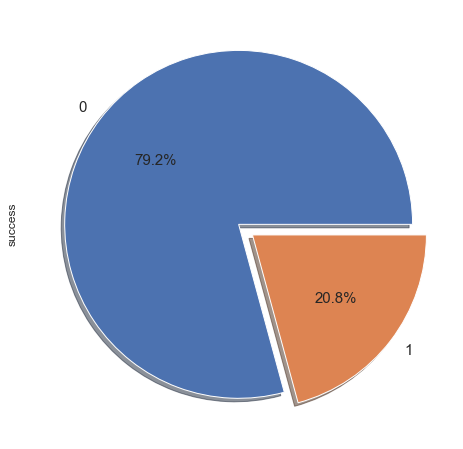

In [28]:
# previous Pre-processing (remove outlier, NA)
plt.figure(figsize=[8,8])
df['success'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%', textprops={'fontsize': 15}, shadow=True)
plt.show()

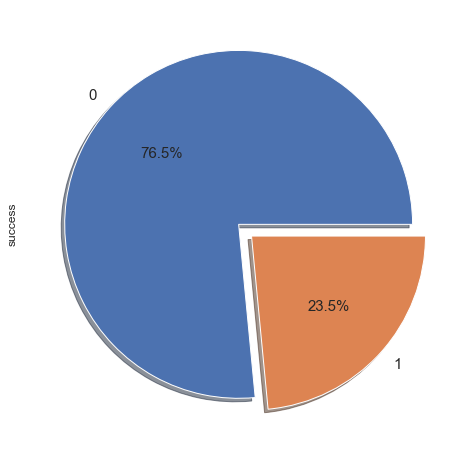

In [29]:
# after Pre-Processing
plt.figure(figsize=[8,8])
df_final['success'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%', textprops={'fontsize': 15}, shadow=True)
plt.show()

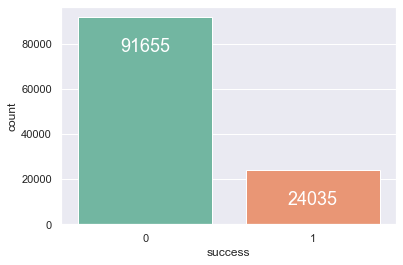

In [30]:
# Plot - target var: Success (Before Pre-processing) # 115,690 obs
success_bar = sns.countplot(data=df_copy, x="success", palette="Set2")
for p in success_bar.patches:
    success_bar.annotate(f'\n{p.get_height()}', (p.get_x()+0.4, p.get_height()), ha='center', va='top', color='white', size=18)

plt.show()

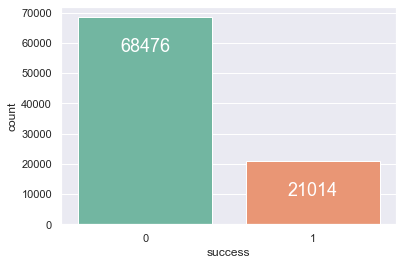

In [31]:
# Plot - target var: Success (After Pre-processing) # 89,490 obs
success_bar = sns.countplot(data=df_final, x="success", palette="Set2")
for p in success_bar.patches:
    success_bar.annotate(f'\n{p.get_height()}', (p.get_x()+0.4, p.get_height()), ha='center', va='top', color='white', size=18)

plt.show()

#### **Data Partitioning (Splitting)**
Before applying feature engineering, we will split our dataset for train/test set

In [32]:
# Data Partitioning (80/20) 
# - On whole dataset
# - In default way of using sklearn (X-only independent variables, y-our target variables)

from sklearn.model_selection import train_test_split

X = df_final.drop('success', axis=1) 
y = df_final['success']

# Train - Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify = y, random_state = 42)

X_train_shape = X_train.shape
X_test_shape = X_test.shape
print("X_train shape = {}\nX_test shape = {}".format(X_train_shape, X_test_shape))

X_train shape = (71592, 37)
X_test shape = (17898, 37)


In [33]:
y_train_shape = y_train.shape
y_test_shape = y_test.shape
print("y_train shape = {}\ny_test shape = {}".format(y_train_shape, y_test_shape))

y_train shape = (71592,)
y_test shape = (17898,)


### **Feature Engineering (or Feature Selection)**

##### **Checking Correlation (StatExplore in SAS miner)**

Checking correlation between variables, drawing correlation matrix using Spearman's Rank Correlation for numerical variables.




##### Spearman correlation matrix for continuous variables

In [34]:
print(list(X_train.select_dtypes('number')))

['rank', 'num_funding_rounds', 'total_funding_usd', 'avg_investors_per_round', 'investor_rank', 'age_first_funding', 'age_fundings', 'age_years']


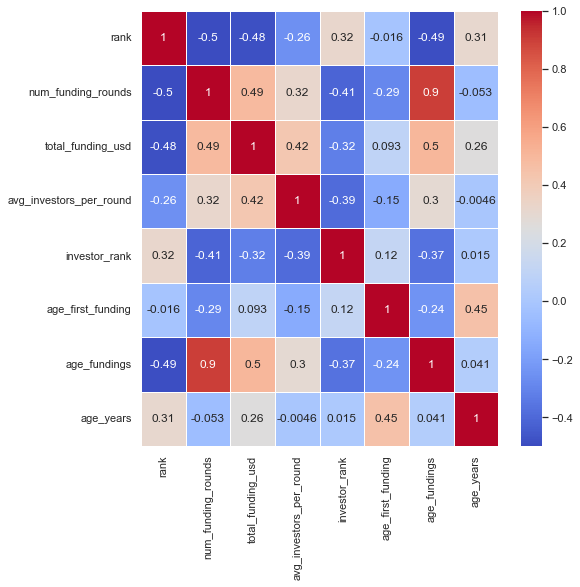

In [35]:
#cont_var = X_train[['rank', 'num_funding_rounds', 'total_funding_usd', 'num_exits', 'avg_investors_per_round', 'acquired_price_usd', 'investor_rank', 'age_first_funding', 'age_seriesA', 'age_seriesB', 'age_seriesC', 'age_seriesD', 'age_fundings', 'age_IPO', 'age_Acquired', 'age_years', 'age_success', 'age_closed']]
cont_var = X_train[['rank', 'num_funding_rounds', 'total_funding_usd', 'avg_investors_per_round', 'investor_rank', 'age_first_funding', 'age_fundings', 'age_years']]

corr = cont_var.corr(method = 'spearman') #correlation matrix for float and int (all numeric variables)

sns.set(font_scale=1) 
corr_map = plt.figure(figsize=(8,8))
our_map = sns.heatmap(corr, xticklabels = corr.columns, cmap='coolwarm', yticklabels = corr.columns, linewidths =.75, annot = True)

In [36]:
corr

,rank,num_funding_rounds,total_funding_usd,avg_investors_per_round,investor_rank,age_first_funding,age_fundings,age_years
rank,1.00000,-0.49810,-0.48159,-0.25552,0.31797,-0.01626,-0.48667,0.31065
num_funding_rounds,-0.49810,1.00000,0.48943,0.31614,-0.41451,-0.29283,0.90348,-0.05285
total_funding_usd,-0.48159,0.48943,1.00000,0.42205,-0.31701,0.09303,0.50412,0.25664
avg_investors_per_round,-0.25552,0.31614,0.42205,1.00000,-0.38935,-0.14551,0.29512,-0.00463
investor_rank,0.31797,-0.41451,-0.31701,-0.38935,1.00000,0.12045,-0.36842,0.01451
age_first_funding,-0.01626,-0.29283,0.09303,-0.14551,0.12045,1.00000,-0.24479,0.45362
age_fundings,-0.48667,0.90348,0.50412,0.29512,-0.36842,-0.24479,1.00000,0.04138
age_years,0.31065,-0.05285,0.25664,-0.00463,0.01451,0.45362,0.04138,1.00000


In [ ]:
# fig = our_map.figure
# fig.savefig('corr_map_numeric_final.png')

#### **Cramers V correlation matrix for categorical variables**

In [ ]:
print(list(X_train.select_dtypes('category')))

['status', 'employee_count', 'has_angel', 'has_pre_seed', 'has_seed', 'has_seriesUnknown', 'has_seriesA', 'has_seriesB', 'has_seriesC', 'has_seriesD', 'has_seriesE_J', 'has_equity_crowdfunding', 'has_product_crowdfunding', 'has_private_equity', 'has_convertible_note', 'has_debt_financing', 'has_secondary_market', 'has_grant', 'has_corporate_round', 'has_initial_coin_offering', 'has_post_ipo_equity', 'has_post_ipo_debt', 'has_post_ipo_secondary', 'has_non_equity_assistance', 'has_undisclosed', 'homepage_active', 'category_num', 'has_VC_investor', 'has_angel_investor']


In [ ]:
# create separate whole_train_set by re-combining X_train and y_train to check correlation with our Target Variable 'success'
whole_train_set = pd.merge(X_train, y_train, how = 'left',left_index = True, right_index = True)

In [ ]:
import scipy.stats as ss
import builtins

# Cramers V only for success and other X columns
columns_all_with_success = ['status', 'employee_count', 'has_angel', 'has_pre_seed', 'has_seed', 'has_seriesUnknown', 'has_seriesA', 'has_seriesB', 'has_seriesC', 'has_seriesD', 'has_seriesE_J', 'has_equity_crowdfunding', 'has_product_crowdfunding', 'has_private_equity', 'has_convertible_note', 'has_debt_financing', 'has_secondary_market', 'has_grant', 'has_corporate_round', 'has_initial_coin_offering', 'has_post_ipo_equity', 'has_post_ipo_debt', 'has_post_ipo_secondary', 'has_non_equity_assistance', 'has_undisclosed', 'homepage_active', 'category_num', 'has_VC_investor', 'has_angel_investor', 'success']

df_corr = whole_train_set[columns_all_with_success]

# Cramers V for categorical correlations
def cramers_v(x, y):
    x = np.array(x)
    y = np.array(y)
    confusion_matrix = pd.crosstab(x, y)
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = __builtin__.max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/__builtin__.min((kcorr-1),(rcorr-1)))

cramersv = pd.DataFrame(index=df_corr.columns,columns=df_corr.columns)
columns = df_corr.columns

for i in range(0,len(columns)):
    for j in range(0,len(columns)):
        #print(data[columns[i]].tolist())
        u = cramers_v(df_corr[columns[i]].tolist(),df_corr[columns[j]].tolist())
        cramersv.loc[columns[i],columns[j]] = u
        
cramersv.fillna(value=np.nan,inplace=True)

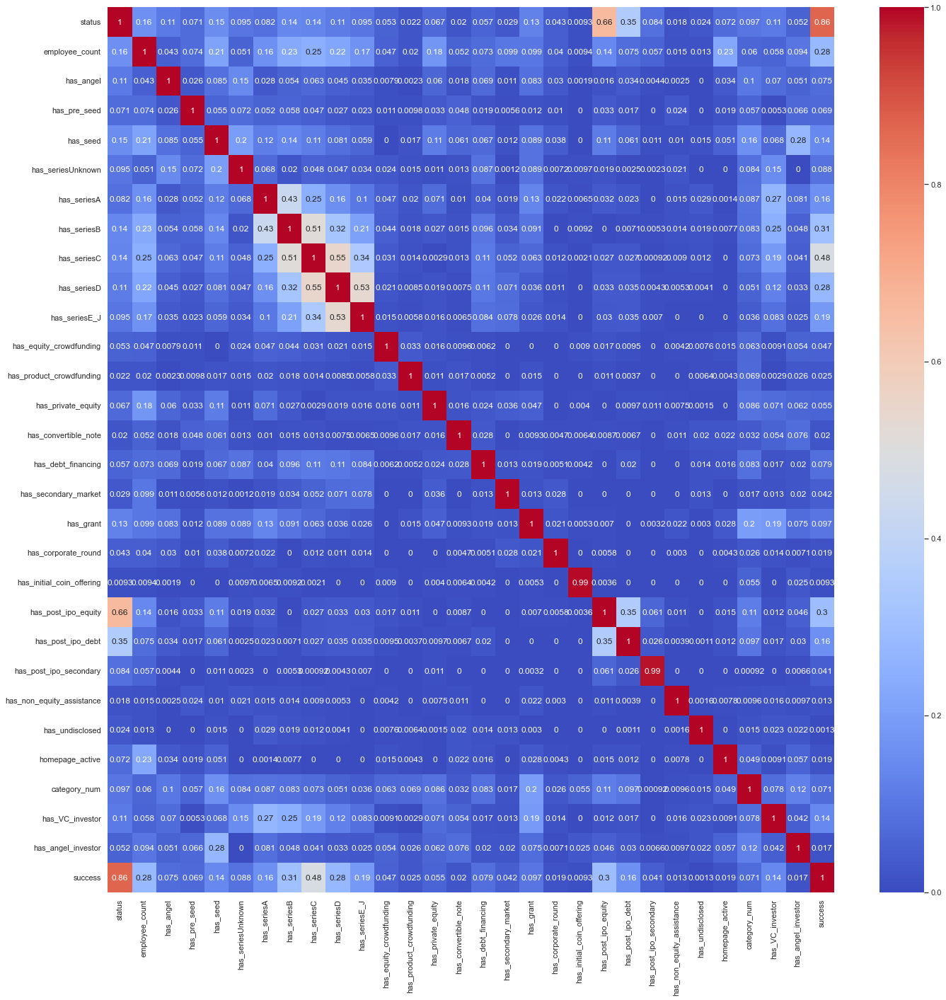

In [ ]:
sns.set(font_scale=1) 
plt.figure(figsize=(23,23))
ax = sns.heatmap(cramersv,cmap="coolwarm", annot = True)
plt.show()

In [ ]:
# fig = ax.figure
# fig.savefig('corr_map_categorical_final.png')


Checking the highest correlation with our target variable as code

In [ ]:
success_only = cramersv[['success']]
new_success = success_only.sort_values(by=['success'])

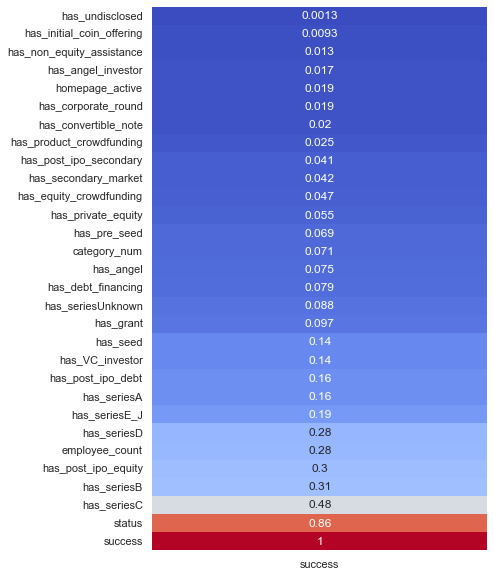

In [ ]:
plt.figure(figsize=(6,10))
ax = sns.heatmap(new_success, cmap="coolwarm", annot=True, cbar = False)
plt.show()

In [ ]:
# fig = ax.figure
# fig.savefig('corr_map_categorical_withTarget_final.png')

### Data processing based on Correlation Result

**Findings:**
Criteria for level of correlation

0.00-0.19: very weak
0.20-0.39: weak
0.40-0.59: moderate
0.60-0.79: strong 
0.80-1.00: very strong 


From numerical variables' correlation plot:

1) age_fundings and num_funding_rounds are highly correlated. \
→ So, I will drop the num_funding_rounds

From categorical variables' correlation plot:

1) status variable is highly correlated with both has_post_ipo_equity and success variable, which is really natural(of course) thing to happen since success variable is containing all information of company who did IPO, Acquisition, operating&had seriesD funding, and closed which basically referred from status variable. \
→ Considering this fact, we decided to remove status variable. 


Other than above variables, all other variables are moderately or weakly correlated.

In [37]:
# Drop some variables based on the result of Correlation matrix (total 8 variables dropped, 47 -> 39)

# From Train set
X_train_after_corr = X_train.drop(['num_funding_rounds', 'status'], axis=1)

# From Test set
X_test_after_corr = X_test.drop(['num_funding_rounds', 'status'], axis=1)


In [38]:
# X_train_after_corr.to_csv('X_train_after_corr.csv')
# X_test_after_corr.to_csv('X_test_after_corr.csv')

In [39]:
# From Additional/Extra Test set 
# (This extra test set has one more variable bcz it's not splitted yet into X, y)
df_extra_testset_after_corr = df_extra_testset_final.drop(['num_funding_rounds', 'status'], axis=1)

In [40]:
# df_extra_testset_after_corr.to_csv('df_extra_testset_after_corr.csv')

### **Conversion of Categorical variables (non-numeric inputs)**

Category_num Variable with 14 levels (14 different Industry category) → create dummy columns

In [41]:
# For these variables, we will create dummy columns.

dummy_col = ['category_num']
X_train_after_dummy = pd.get_dummies(data=X_train_after_corr, columns = dummy_col, drop_first=True) # drop_first used to have only (n-1) dummy variables
# remove space from 'category_num_Industry 1~14' kind of column names
X_train_after_dummy.columns = X_train_after_dummy.columns.str.replace(' ', '')
X_train_after_dummy.head()

,rank,total_funding_usd,employee_count,avg_investors_per_round,has_angel,has_pre_seed,has_seed,has_seriesUnknown,has_seriesA,has_seriesB,...,category_num_Industry13,category_num_Industry14,category_num_Industry2,category_num_Industry3,category_num_Industry4,category_num_Industry5,category_num_Industry6,category_num_Industry7,category_num_Industry8,category_num_Industry9
4390,475561,36000000.00000,1,2,0,0,0,0,1,1,...,1,0,0,0,0,0,0,0,0,0
44979,92080,3490088.00000,1,1,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
46988,157638,50000.00000,1,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
104677,268531,442030.00000,1,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2568,1027433,37500000.00000,0,4,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0


In [42]:
# same procedure applied to test set
dummy_col = ['category_num']
X_test_after_dummy = pd.get_dummies(data=X_test_after_corr, columns = dummy_col, drop_first=True) # drop_first used to have only (n-1) dummy variables
# remove space from 'category_num_Industry 1~14' kind of column names 
X_test_after_dummy.columns = X_test_after_dummy.columns.str.replace(' ', '')
X_test_after_dummy.head()

,rank,total_funding_usd,employee_count,avg_investors_per_round,has_angel,has_pre_seed,has_seed,has_seriesUnknown,has_seriesA,has_seriesB,...,category_num_Industry13,category_num_Industry14,category_num_Industry2,category_num_Industry3,category_num_Industry4,category_num_Industry5,category_num_Industry6,category_num_Industry7,category_num_Industry8,category_num_Industry9
46966,19912,8000000.00000,1,2,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
38468,133962,701151.00000,1,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
74466,46897,3585293.00000,1,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
470,53754,22733231.00000,1,2,1,0,1,1,1,1,...,0,1,0,0,0,0,0,0,0,0
21843,1367,196250000.00000,2,4,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0


In [43]:
# same procedure applied to Additional/Extra test set
dummy_col = ['category_num']
df_extra_testset_after_dummy = pd.get_dummies(data=df_extra_testset_after_corr, columns = dummy_col, drop_first=True) # drop_first used to have only (n-1) dummy variables
# remove space from 'category_num_Industry 1~14' kind of column names 
df_extra_testset_after_dummy.columns = df_extra_testset_after_dummy.columns.str.replace(' ', '')
df_extra_testset_after_dummy.head()

,rank,total_funding_usd,employee_count,avg_investors_per_round,has_angel,has_pre_seed,has_seed,has_seriesUnknown,has_seriesA,has_seriesB,...,category_num_Industry13,category_num_Industry14,category_num_Industry2,category_num_Industry3,category_num_Industry4,category_num_Industry5,category_num_Industry6,category_num_Industry7,category_num_Industry8,category_num_Industry9
0,110414.00000,4000000.00000,1,1.00000,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2,26268.00000,1200000.00000,1,4.00000,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,92809.00000,200000.00000,1,1.00000,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,52030.00000,4100000.00000,1,2.00000,0,0,1,0,0,1,...,1,0,0,0,0,0,0,0,0,0
5,37527.00000,1020000.00000,1,1.00000,0,1,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [44]:
# change 'category_num_Industry2~14' (Industry 1 is dropped to avoid multicollinearity issue) kind of columns into 'category' dtypes (currently it's uint8)
X_train_after_dummy[['category_num_Industry2', 'category_num_Industry3', 'category_num_Industry4', 'category_num_Industry5', 'category_num_Industry6',
'category_num_Industry7', 'category_num_Industry8', 'category_num_Industry9', 'category_num_Industry10', 'category_num_Industry11', 'category_num_Industry12',
'category_num_Industry13', 'category_num_Industry14']] = X_train_after_dummy[['category_num_Industry2', 'category_num_Industry3', 'category_num_Industry4', 'category_num_Industry5', 'category_num_Industry6',
'category_num_Industry7', 'category_num_Industry8', 'category_num_Industry9', 'category_num_Industry10', 'category_num_Industry11', 'category_num_Industry12',
'category_num_Industry13', 'category_num_Industry14']].apply(lambda x: x.astype('category'))

X_test_after_dummy[['category_num_Industry2', 'category_num_Industry3', 'category_num_Industry4', 'category_num_Industry5', 'category_num_Industry6',
'category_num_Industry7', 'category_num_Industry8', 'category_num_Industry9', 'category_num_Industry10', 'category_num_Industry11', 'category_num_Industry12',
'category_num_Industry13', 'category_num_Industry14']] = X_test_after_dummy[['category_num_Industry2', 'category_num_Industry3', 'category_num_Industry4', 'category_num_Industry5', 'category_num_Industry6',
'category_num_Industry7', 'category_num_Industry8', 'category_num_Industry9', 'category_num_Industry10', 'category_num_Industry11', 'category_num_Industry12',
'category_num_Industry13', 'category_num_Industry14']].apply(lambda x: x.astype('category'))

df_extra_testset_after_dummy[['category_num_Industry2', 'category_num_Industry3', 'category_num_Industry4', 'category_num_Industry5', 'category_num_Industry6',
'category_num_Industry7', 'category_num_Industry8', 'category_num_Industry9', 'category_num_Industry10', 'category_num_Industry11', 'category_num_Industry12',
'category_num_Industry13', 'category_num_Industry14']] = df_extra_testset_after_dummy[['category_num_Industry2', 'category_num_Industry3', 'category_num_Industry4', 'category_num_Industry5', 'category_num_Industry6',
'category_num_Industry7', 'category_num_Industry8', 'category_num_Industry9', 'category_num_Industry10', 'category_num_Industry11', 'category_num_Industry12',
'category_num_Industry13', 'category_num_Industry14']].apply(lambda x: x.astype('category'))

In [ ]:
# X_train_after_dummy.to_csv('X_train_after_dummy.csv')
# X_test_after_dummy.to_csv('X_test_after_dummy.csv')
# df_extra_testset_after_dummy.to_csv('df_extra_testset_after_dummy.csv')

In [45]:
X_train_after_dummy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 71592 entries, 4390 to 26678
Data columns (total 47 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   rank                       71592 non-null  Int64   
 1   total_funding_usd          71592 non-null  float64 
 2   employee_count             71592 non-null  category
 3   avg_investors_per_round    71592 non-null  Int64   
 4   has_angel                  71592 non-null  category
 5   has_pre_seed               71592 non-null  category
 6   has_seed                   71592 non-null  category
 7   has_seriesUnknown          71592 non-null  category
 8   has_seriesA                71592 non-null  category
 9   has_seriesB                71592 non-null  category
 10  has_seriesC                71592 non-null  category
 11  has_seriesD                71592 non-null  category
 12  has_seriesE_J              71592 non-null  category
 13  has_equity_crowdfunding    7

### **Feature Scaling - using Standardization(Normalization)**

Before we proceed the Clustering, it's necessary to do a feature scaling for the numerical(continuous) variables in our dataset since each numeric variable has different standard of measure. There are several methods to proceed Feature Scaling such as normalization, standardization, etc. Among them, we will do Standardization using StandardScaler function. It makes each numerical feature to have mean '0', std '1' while keeping the shape of the data.

In [46]:
numeric_columns = list(X_train_after_dummy.select_dtypes('number'))

In [47]:
print(numeric_columns)

['rank', 'total_funding_usd', 'avg_investors_per_round', 'investor_rank', 'age_first_funding', 'age_fundings', 'age_years']


In [48]:
#Feature Scaling for continuous(num) variables before Clustering

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
sc.fit(X_train_after_dummy[numeric_columns])
X_train_after_dummy[numeric_columns] = sc.transform(X_train_after_dummy[numeric_columns])

X_train_after_dummy[numeric_columns].describe()

,rank,total_funding_usd,avg_investors_per_round,investor_rank,age_first_funding,age_fundings,age_years
count,71592.00000,71592.00000,71592.00000,71592.00000,71592.00000,71592.00000,71592.00000
mean,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000
std,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001,1.00001
min,-0.65562,-0.31381,-1.32115,-0.46310,-0.80489,-0.77863,-1.18726
25%,-0.49006,-0.30701,-0.67281,-0.44635,-0.63750,-0.77863,-0.76099
50%,-0.30106,-0.27541,-0.02447,-0.33178,-0.36549,-0.37147,-0.36751
75%,-0.04416,-0.12899,-0.02447,-0.08475,0.22036,0.47417,0.55060
max,6.71299,14.51009,23.31572,7.29330,5.93246,8.58607,3.23937


In [49]:
# Normalize test datasets with mean and standart deviation resulted from fitting with our trianing data set. 
# (Test dataset should not separately fit again. Because, in the real-world, you cannot know the distribution of the test set. So you need to work with distribution of your training set.)
X_test_after_dummy[numeric_columns] = sc.transform(X_test_after_dummy[numeric_columns])
df_extra_testset_after_dummy[numeric_columns] = sc.transform(df_extra_testset_after_dummy[numeric_columns])

In [ ]:
# X_train_after_dummy.to_csv('X_train_after_scaling.csv')
# X_test_after_dummy.to_csv('X_test_after_scaling.csv')
# df_extra_testset_after_dummy.to_csv('df_extra_testset_after_scaling.csv')

In [50]:
X_train_after_dummy.head()

,rank,total_funding_usd,employee_count,avg_investors_per_round,has_angel,has_pre_seed,has_seed,has_seriesUnknown,has_seriesA,has_seriesB,...,category_num_Industry13,category_num_Industry14,category_num_Industry2,category_num_Industry3,category_num_Industry4,category_num_Industry5,category_num_Industry6,category_num_Industry7,category_num_Industry8,category_num_Industry9
4390,1.14718,0.05586,1,-0.02447,0,0,0,0,1,1,...,1,0,0,0,0,0,0,0,0,0
44979,-0.30657,-0.27800,1,-0.67281,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
46988,-0.05804,-0.31333,1,-0.67281,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
104677,0.36235,-0.30930,1,-0.67281,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2568,3.23929,0.07126,0,1.27221,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0


### **Additional Feature Selection (other than Correlation method)**

Variable selection part.

The null hypothesis (H0) and alternative hypothesis (H1) of the **ANOVA F-value test** can be expressed like below

H0: “[success] is independent of [Variable]”

H1: “[success] is not independent of [Variable]”

We are using **α = 0.05,** that would be 95% confidence interval. Based on above heat map we can conclude following inference





#### **Method 1> Univariate Statistical Tests**
**(ANOVA F-value Test)**

We can use many different statistical test like Chi-square, ANOVA F-value test for this Univariate Selection method. Among them, we will use chisquare method using chi2() function from sckitlearn.


In [51]:
# ANOVA feature selection for numeric input and categorical output
from sklearn.datasets import make_classification
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
import plotly.offline as py
import plotly.figure_factory as ff

# define feature selection
fs = SelectKBest(score_func=f_classif, k=20)
# apply feature selection
fit = fs.fit(X_train_after_dummy, y_train)

# create result dataframe
score = pd.DataFrame({"Variable": X_train_after_dummy.columns, "Score": fit.scores_, "p_value": fit.pvalues_ })
score = score.sort_values(by = "Score", ascending=False)

table_score = ff.create_table(score)
py.iplot(table_score)

In [52]:
# if we want to only leave the best 20 variables
X_best_new = fs.fit_transform(X_train_after_dummy, y_train)

mask = fit.get_support() #list of booleans for selected features
new_feat = [] 
for bool, feature in zip(mask, X_train_after_dummy.columns):
 if bool:
   new_feat.append(feature)
print('The best features are:{}'.format(new_feat)) # The list of 20 best features
print('Original number of features:', X_train_after_dummy.shape)
print('Reduced number of features:', X_best_new.shape)

The best features are:['rank', 'total_funding_usd', 'employee_count', 'avg_investors_per_round', 'has_angel', 'has_seed', 'has_seriesUnknown', 'has_seriesA', 'has_seriesB', 'has_seriesC', 'has_seriesD', 'has_seriesE_J', 'has_debt_financing', 'has_grant', 'has_post_ipo_equity', 'has_post_ipo_debt', 'investor_rank', 'age_fundings', 'age_years', 'has_VC_investor']
Original number of features: (71592, 47)
Reduced number of features: (71592, 20)


In [53]:
# Create new dataset considering this Variable Selection
selected_features = pd.DataFrame(fs.inverse_transform(X_best_new), 
                                 index=X_train_after_dummy.index, 
                                 columns=X_train_after_dummy.columns)

# Dropped columns with values of all 0s, so var is 0, drop them
selected_columns = selected_features.columns[selected_features.var() != 0]

In [54]:
selected_columns

Index(['rank', 'total_funding_usd', 'employee_count',
       'avg_investors_per_round', 'has_angel', 'has_seed', 'has_seriesUnknown',
       'has_seriesA', 'has_seriesB', 'has_seriesC', 'has_seriesD',
       'has_seriesE_J', 'has_debt_financing', 'has_grant',
       'has_post_ipo_equity', 'has_post_ipo_debt', 'investor_rank',
       'age_fundings', 'age_years', 'has_VC_investor'],
      dtype='object')

In [55]:
# Create new dataframe with selected variables
X_train_selected = X_train_after_dummy[selected_columns]
X_test_selected = X_test_after_dummy[selected_columns]
df_extra_testset_selected = df_extra_testset_after_dummy[selected_columns]

In [56]:
X_train_selected

,rank,total_funding_usd,employee_count,avg_investors_per_round,has_angel,has_seed,has_seriesUnknown,has_seriesA,has_seriesB,has_seriesC,has_seriesD,has_seriesE_J,has_debt_financing,has_grant,has_post_ipo_equity,has_post_ipo_debt,investor_rank,age_fundings,age_years,has_VC_investor
4390,1.14718,0.05586,1,-0.02447,0,0,0,1,1,0,0,0,0,0,0,0,-0.41067,-0.34015,0.94408,1
44979,-0.30657,-0.27800,1,-0.67281,0,1,1,0,0,0,0,0,0,0,0,0,-0.46237,0.16097,-0.33472,0
46988,-0.05804,-0.31333,1,-0.67281,0,0,0,0,0,0,0,0,1,0,0,0,-0.37695,-0.71599,-0.20356,0
104677,0.36235,-0.30930,1,-0.67281,0,0,1,0,0,0,0,0,0,0,0,0,-0.01836,-0.77863,1.27198,0
2568,3.23929,0.07126,0,1.27221,0,0,1,0,0,0,0,0,0,0,0,0,-0.46237,-0.77863,1.76383,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23142,-0.64888,2.56673,2,1.27221,0,1,0,1,1,1,1,1,0,0,0,0,-0.46065,1.03793,-0.20356,1
35834,-0.54078,3.16750,1,-0.02447,0,0,0,1,1,0,0,0,0,0,0,0,0.07675,1.06925,-0.20356,0
57447,1.78762,-0.25223,2,0.62387,0,0,0,1,0,0,0,0,0,0,0,0,-0.42453,-0.77863,2.58357,1
20502,-0.33025,-0.20088,1,4.51390,0,0,0,1,0,0,0,0,0,0,0,0,-0.45861,-0.77863,-0.20356,1


In [315]:
# X_train_selected.to_csv('X_train_selected_ANOVA.csv')
# X_test_selected.to_csv('X_test_selected_ANOVA.csv')
# df_extra_testset_selected.to_csv('df_extra_testset_selected_ANOVA.csv')

#### **Step 3. Modify**

All the process we did for Correlation&Feature selection with Classifiers & maybe Imbalnce data handling (SMOTE)

#### **Step 4. Model**

##### **1> Logistic Regression**
We will build 3 different Logistic Regression Model: 

1) Model with full range of variables

2) Model with Selected Variables

*   2-1) Model with Selected variables using RFE (recursive feature elimination) 
*   2-2) Model with Selected variables from Previous Explore Step (Univariate selection with ANOVA f-score test result) 


 
 


##### **1) Logistic Regression Modelling with Full Variables**

In [78]:
from sklearn.linear_model import LogisticRegression

lr_model = LogisticRegression(fit_intercept = False, C = 1e9, solver='lbfgs', max_iter=15000, random_state = 42) # add C = 1e9 for not doing a regularization
lr_model.fit(X_train_after_dummy, y_train)
lr_y_pred = lr_model.predict(X_test_after_dummy)
lr_y_pred_train = lr_model.predict(X_train_after_dummy)

Text(0.5, 12.5, 'Predicted label')

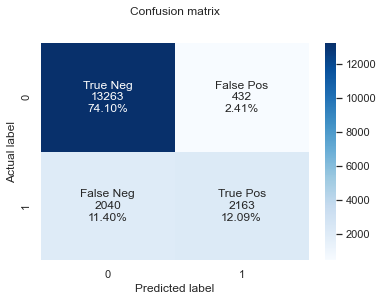

In [79]:
from sklearn import metrics
# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, lr_y_pred)

group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cnf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cnf_matrix.flatten()/np.sum(cnf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cnf_matrix, annot=labels, fmt='', cmap='Blues')
#sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="Blues" ,fmt='g')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')


In [80]:
print("R²=", lr_model.score(X_train_after_dummy, y_train))
print("intercept = ", lr_model.intercept_)

R²= 0.8627220918538384
intercept =  [0.]


In this step we are printing all coefficient of each variable.

In [81]:
for f, w in zip(X_train_after_dummy.columns, lr_model.coef_[0]):
  print(f"{f:<30} {w}")

rank                           -0.7088492832012897
total_funding_usd              0.09482568618733327
employee_count                 0.4037730907154076
avg_investors_per_round        0.0682219622352341
has_angel                      -0.2904877958898171
has_pre_seed                   -0.47549516819678445
has_seed                       -0.21686498225641557
has_seriesUnknown              0.11856118151629941
has_seriesA                    0.12037047245137265
has_seriesB                    0.10696660291188483
has_seriesC                    2.9381067722823313
has_seriesD                    -0.32496918847219847
has_seriesE_J                  -0.1833820483448637
has_equity_crowdfunding        -0.6902096070274762
has_product_crowdfunding       -0.7847574323757682
has_private_equity             0.1226947398969044
has_convertible_note           -0.09122199845556407
has_debt_financing             0.038052389981672735
has_secondary_market           0.1885892425590959
has_grant                      

In [82]:
from sklearn.metrics import classification_report
print(classification_report(lr_y_pred, y_test))

              precision    recall  f1-score   support

           0       0.97      0.87      0.91     15303
           1       0.51      0.83      0.64      2595

    accuracy                           0.86     17898
   macro avg       0.74      0.85      0.78     17898
weighted avg       0.90      0.86      0.87     17898



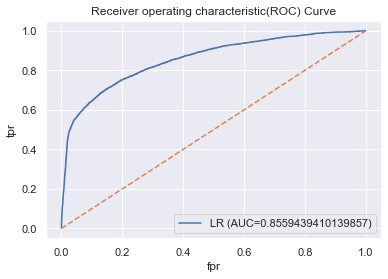

AUC score for test data: 0.8559439410139857
AUC score for train data: 0.8591980806794383


In [83]:
# ROC Curve
lr_predictions_proba = lr_model.predict_proba(X_test_after_dummy)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, lr_predictions_proba)

auc = metrics.roc_auc_score(y_test, lr_predictions_proba) 

plt.plot(fpr,tpr,label="LR (AUC="+str(auc)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score for the case is 0.83 (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_log_train = lr_model.predict_proba(X_train_after_dummy)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_log_train)

print(f"AUC score for test data: {auc}")
print(f"AUC score for train data: {auc_train}")

In [84]:
# Precision-Recall Curve (PR AUC | average precision)
from sklearn.metrics import average_precision_score

# PR AUC score (average precision)
pr_auc = average_precision_score(y_test, lr_predictions_proba)
pr_auc_train = average_precision_score(y_train, y_proba_log_train)

print(f"Average PR AUC score for test data: {pr_auc}")
print(f"Average PR AUC score for train data: {pr_auc_train}")

Average PR AUC score for test data: 0.7192108970098743
Average PR AUC score for train data: 0.7175025829182641


<Figure size 504x504 with 0 Axes>

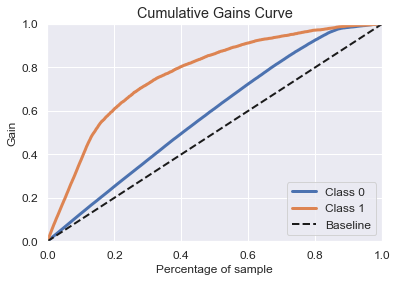

In [85]:
import scikitplot as skplt

pred1 = lr_model.predict_proba(X_test_after_dummy)
# pred2 = model2.predict_proba(test_x)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred1)
plt.show()

In [86]:
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

test_acc = metrics.accuracy_score(lr_y_pred, y_test)
train_acc = metrics.accuracy_score(lr_y_pred_train, y_train)
prec = metrics.precision_score(lr_y_pred, y_test)
rec = metrics.recall_score(lr_y_pred, y_test)
f1 = f1_score(lr_y_pred, y_test)
auc = metrics.roc_auc_score(y_test, lr_predictions_proba) 
pr_auc = average_precision_score(y_test, lr_predictions_proba)

results = pd.DataFrame([['Logistic Regression (Base model)', test_acc, train_acc, prec, rec, f1, auc, pr_auc]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score', 'AUC Score', 'AUPR Score'])
results


,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,Logistic Regression (Base model),0.86188,0.86272,0.51463,0.83353,0.63636,0.85594,0.71921


**[For interpretation] Detailed summary of Logistic Regression full model result**

In [50]:
# with regression parameter estimate for each variables
import statsmodels.api as sm
glm = sm.GLM(y_train, X_train_after_dummy, family = sm.families.Binomial()).fit()
glm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                success   No. Observations:                71592
Model:                            GLM   Df Residuals:                    71545
Model Family:                Binomial   Df Model:                           46
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -26052.
Date:                Tue, 30 Aug 2022   Deviance:                       52103.
Time:                        20:23:04   Pearson chi2:                 1.44e+05
No. Iterations:                    23   Pseudo R-squ. (CS):             0.3039
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
rank                         -0.7089      0.022    -32.377      0.000      -0.752      -0.666
total_funding_usd             0.0949      0.014      6.885      0.000       0.068       0.122
employee_count                0.4037      0.022     18.697      0.000       0.361       0.446
avg_investors_per_round       0.0682      0.012      5.758      0.000       0.045       0.091
has_angel                    -0.2905      0.041     -7.163      0.000      -0.370      -0.211
has_pre_seed                 -0.4759      0.072     -6.604      0.000      -0.617      -0.335
has_seed                     -0.2169      0.029     -7.451      0.000      -0.274      -0.160
has_seriesUnknown             0.1185      0.028      4.207      0.000       0.063       0.174
has_seriesA                   0.1204      0.028      4.372      0.000       0.066       0.174
has_seriesB                   0.1070      0.033      3.232      0.001       0.042       0.172
has_seriesC                   2.9382      0.048     60.711      0.000       2.843       3.033
has_seriesD                  -0.3253      0.072     -4.539      0.000      -0.466      -0.185
has_seriesE_J                -0.1834      0.098     -1.874      0.061      -0.375       0.008
has_equity_crowdfunding      -0.6902      0.129     -5.354      0.000      -0.943      -0.438
has_product_crowdfunding     -0.7785      0.242     -3.217      0.001      -1.253      -0.304
has_private_equity            0.1228      0.060      2.059      0.039       0.006       0.240
has_convertible_note         -0.0915      0.066     -1.389      0.165      -0.221       0.038
has_debt_financing            0.0380      0.040      0.942      0.346      -0.041       0.117
has_secondary_market          0.1888      0.191      0.986      0.324      -0.186       0.564
has_grant                    -0.6419      0.049    -12.979      0.000      -0.739      -0.545
has_corporate_round           0.4298      0.092      4.671      0.000       0.249       0.610
has_initial_coin_offering    -0.6499      0.403     -1.614      0.106      -1.439       0.139
has_post_ipo_equity           4.0941      0.100     41.001      0.000       3.898       4.290
has_post_ipo_debt             3.0768      0.200     15.366      0.000       2.684       3.469
has_post_ipo_secondary       24.3488    1.5e+04      0.002      0.999   -2.93e+04    2.94e+04
has_non_equity_assistance     0.0971      0.180      0.540      0.589      -0.255       0.450
has_undisclosed              -0.0763      0.080     -0.951      0.341      -0.233       0.081
investor_rank                -0.1246      0.016     -7.740      0.000      -0.156      -0.093
age_first_funding            -0.5965      0.019    -31.686      0.000      -0.633      -0.560
age_fundings                 -0.1741      0.016    -10.862      0.000      

In [51]:
# Odds Ratio
np.exp(glm.params)

rank                                  0.49219
total_funding_usd                     1.09949
employee_count                        1.49738
avg_investors_per_round               1.07059
has_angel                             0.74786
has_pre_seed                          0.62134
has_seed                              0.80503
has_seriesUnknown                     1.12584
has_seriesA                           1.12789
has_seriesB                           1.11288
has_seriesC                          18.88126
has_seriesD                           0.72229
has_seriesE_J                         0.83243
has_equity_crowdfunding               0.50148
has_product_crowdfunding              0.45909
has_private_equity                    1.13064
has_convertible_note                  0.91254
has_debt_financing                    1.03875
has_secondary_market                  1.20777
has_grant                             0.52627
has_corporate_round                   1.53688
has_initial_coin_offering         

**Droping(rejecting) the variables with p-value >0.05 and re-do LR model fitting**

In [87]:
# Variable filtering based on p-value
X_train_new = X_train_after_dummy.drop(['has_seriesE_J', 'has_convertible_note', 'has_debt_financing', 'has_secondary_market', 'has_initial_coin_offering', 'has_post_ipo_secondary',
'has_non_equity_assistance', 'has_undisclosed', 'has_VC_investor'], axis=1)
X_test_new = X_test_after_dummy.drop(['has_seriesE_J', 'has_convertible_note', 'has_debt_financing', 'has_secondary_market', 'has_initial_coin_offering', 'has_post_ipo_secondary',
'has_non_equity_assistance', 'has_undisclosed', 'has_VC_investor'], axis=1)

Text(0.5, 12.5, 'Predicted label')

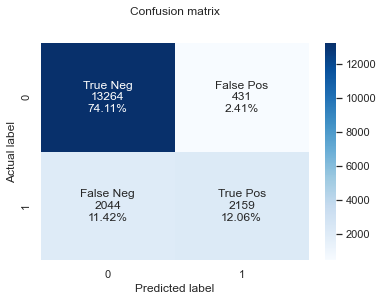

In [88]:
from sklearn.linear_model import LogisticRegression

lr1_model = LogisticRegression(fit_intercept = False, C = 1e9, solver='lbfgs', max_iter=15000, random_state = 42) # add C = 1e9 for not doing a regularization
lr1_model.fit(X_train_new, y_train)
lr1_y_pred = lr1_model.predict(X_test_new)
lr1_y_pred_train = lr1_model.predict(X_train_new)

from sklearn import metrics
# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, lr1_y_pred)

group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cnf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cnf_matrix.flatten()/np.sum(cnf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cnf_matrix, annot=labels, fmt='', cmap='Blues')
#sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="Blues" ,fmt='g')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

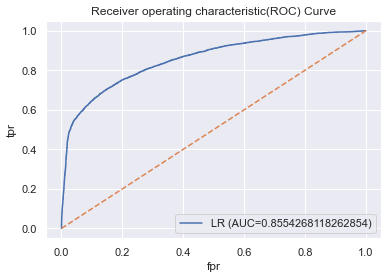

AUC score for test data: 0.8554268118262854
AUC score for train data: 0.8588857235357159


In [89]:
# ROC Curve
lr1_predictions_proba = lr1_model.predict_proba(X_test_new)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, lr1_predictions_proba)

auc = metrics.roc_auc_score(y_test, lr1_predictions_proba) 

plt.plot(fpr,tpr,label="LR (AUC="+str(auc)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score for the case is 0.83 (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_log_train_1 = lr1_model.predict_proba(X_train_new)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_log_train_1)

print(f"AUC score for test data: {auc}")
print(f"AUC score for train data: {auc_train}")

In [90]:
# Precision-Recall Curve (PR AUC | average precision)
from sklearn.metrics import average_precision_score

# PR AUC score (average precision)
pr_auc = average_precision_score(y_test, lr1_predictions_proba)
pr_auc_train = average_precision_score(y_train, y_proba_log_train_1)

print(f"Average PR AUC score for test data: {pr_auc}")
print(f"Average PR AUC score for train data: {pr_auc_train}")

Average PR AUC score for test data: 0.7179005515142011
Average PR AUC score for train data: 0.7167094628321715


<Figure size 504x504 with 0 Axes>

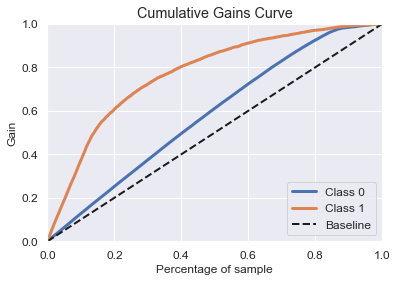

In [91]:
import scikitplot as skplt

pred11 = lr1_model.predict_proba(X_test_new)
# pred2 = model2.predict_proba(test_x)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred11)
plt.show()

In [92]:
from sklearn.metrics import classification_report
print(classification_report(lr1_y_pred, y_test))

              precision    recall  f1-score   support

           0       0.97      0.87      0.91     15308
           1       0.51      0.83      0.64      2590

    accuracy                           0.86     17898
   macro avg       0.74      0.85      0.78     17898
weighted avg       0.90      0.86      0.87     17898



In [93]:
# Confusion Matrix Evaluation Metrics
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

test_acc = metrics.accuracy_score(lr1_y_pred, y_test)
train_acc = metrics.accuracy_score(lr1_y_pred_train, y_train)
prec = metrics.precision_score(lr1_y_pred, y_test)
rec = metrics.recall_score(lr1_y_pred, y_test)
f1 = f1_score(lr1_y_pred, y_test)
auc = metrics.roc_auc_score(y_test, lr1_predictions_proba)
pr_auc = average_precision_score(y_test, lr1_predictions_proba)


results0 = pd.DataFrame([['Logistic Regression (var select with p-value)', test_acc, train_acc, prec, rec, f1, auc, pr_auc]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score', 'AUC Score', 'AUPR Score'])
results0

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,Logistic Regression (var select with p-value),0.86172,0.86248,0.51368,0.83359,0.63565,0.85543,0.71790


In [59]:
import statsmodels.api as sm
glm = sm.GLM(y_train, X_train_new, family = sm.families.Binomial()).fit()
glm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                success   No. Observations:                71592
Model:                            GLM   Df Residuals:                    71554
Model Family:                Binomial   Df Model:                           37
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -26079.
Date:                Tue, 30 Aug 2022   Deviance:                       52158.
Time:                        20:24:05   Pearson chi2:                 1.43e+05
No. Iterations:                     7   Pseudo R-squ. (CS):             0.3034
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
rank                        -0.7072      0.022    -32.352      0.000      -0.750      -0.664
total_funding_usd            0.0983      0.013      7.322      0.000       0.072       0.125
employee_count               0.4078      0.022     18.943      0.000       0.366       0.450
avg_investors_per_round      0.0694      0.012      5.969      0.000       0.047       0.092
has_angel                   -0.2907      0.040     -7.188      0.000      -0.370      -0.211
has_pre_seed                -0.4725      0.072     -6.574      0.000      -0.613      -0.332
has_seed                    -0.2155      0.029     -7.463      0.000      -0.272      -0.159
has_seriesUnknown            0.1213      0.028      4.364      0.000       0.067       0.176
has_seriesA                  0.1247      0.027      4.609      0.000       0.072       0.178
has_seriesB                  0.1088      0.033      3.303      0.001       0.044       0.173
has_seriesC                  2.9339      0.048     60.726      0.000       2.839       3.029
has_seriesD                 -0.3774      0.067     -5.654      0.000      -0.508      -0.247
has_equity_crowdfunding     -0.6873      0.129     -5.347      0.000      -0.939      -0.435
has_product_crowdfunding    -0.7821      0.242     -3.235      0.001      -1.256      -0.308
has_private_equity           0.1178      0.059      1.992      0.046       0.002       0.234
has_grant                   -0.6454      0.049    -13.157      0.000      -0.742      -0.549
has_corporate_round          0.4239      0.092      4.612      0.000       0.244       0.604
has_post_ipo_equity          4.0915      0.100     41.071      0.000       3.896       4.287
has_post_ipo_debt            3.0620      0.200     15.308      0.000       2.670       3.454
investor_rank               -0.1270      0.015     -8.220      0.000      -0.157      -0.097
age_first_funding           -0.5932      0.019    -31.668      0.000      -0.630      -0.556
age_fundings                -0.1734      0.016    -11.057      0.000      -0.204      -0.143
age_years                    0.9588      0.021     46.028      0.000       0.918       1.000
homepage_active             -1.4994      0.049    -30.755      0.000      -1.595      -1.404
has_angel_investor           0.2248      0.029      7.808      0.000       0.168       0.281
category_num_Industry10     -0.9186      0.070    -13.133      0.000      -1.056      -0.782
category_num_Industry11     -1.1262      0.068    -16.491      0.000      -1.260      -0.992
category_num_Industry12     -0.7001      0.056    -12.438      0.000      -0.810      -0.590
category_num_Industry13     -0.9116      0.052    -17.548      0.000      -1.013      -0.810
category_num_Industry14     -0.9815      0.061    -16.220      0.000      -1.100      -0.863
category_num_I

In [60]:
# Odds Ratio
np.exp(glm.params)

rank                        0.49304
total_funding_usd           1.10334
employee_count              1.50355
avg_investors_per_round     1.07184
has_angel                   0.74772
has_pre_seed                0.62346
has_seed                    0.80616
has_seriesUnknown           1.12894
has_seriesA                 1.13279
has_seriesB                 1.11499
has_seriesC                18.80168
has_seriesD                 0.68565
has_equity_crowdfunding     0.50294
has_product_crowdfunding    0.45743
has_private_equity          1.12502
has_grant                   0.52443
has_corporate_round         1.52789
has_post_ipo_equity        59.82697
has_post_ipo_debt          21.37012
investor_rank               0.88070
age_first_funding           0.55255
age_fundings                0.84078
age_years                   2.60866
homepage_active             0.22327
has_angel_investor          1.25201
category_num_Industry10     0.39906
category_num_Industry11     0.32425
category_num_Industry12     

##### **2) Logistic Regression Modelling with Selected Variables**

In Python, we don't have option for Stepwise selection but only Forward or Backward selection for variable selection (ex. Sequential Feature Selector from sci-kit learn). So, instead of just using ordinary fw, bw method, we decided to use the RFE which means recursive feature eliminiation. This one is very similar to Backward regression, but still a bit more advanced in that this approach does the whole cycle of eliminations and then chooses the best subset of it while ordinary Backward method stops at the point where the score starts decreasing. 

Recursive feature elimination is based on the idea to repeatedly construct a model (for example an SVM or a regression model) and choose either the best or worst performing feature (for example based on coefficients), setting the feature aside and then repeating the process with the rest of the features. This process is applied until all features in the dataset are exhausted. Features are then ranked according to when they were eliminated. As such, it is a greedy optimization for finding the best performing subset of features.

##### **2-1) Variable Selection using RFE (recursive feature elimination)**

In [94]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn import preprocessing
from sklearn.feature_selection import RFE

# Feature extraction
lr2_model = LogisticRegression(fit_intercept = False, C = 1e9, solver='lbfgs', max_iter=15000, random_state = 42) # add C = 1e9 for not doing a regularization
rfe = RFE(lr2_model, n_features_to_select=None) #None means just half of the features are selected
fit = rfe.fit(X_train_after_dummy, y_train)
print("Num Features: %s" % (fit.n_features_))
print("Selected Features: %s" % (fit.support_))
print("Feature Ranking: %s" % (fit.ranking_))

Num Features: 23
Selected Features: [ True False False False False  True False False False False  True False
 False  True  True False False False False  True False  True  True  True
  True False False False  True False  True  True False False  True  True
 False  True  True  True  True False  True  True False  True  True]
Feature Ranking: [ 1 19  5 23  7  1  9 17 16 13  1  8 18  1  1 15 20 24 11  1  6  1  1  1
  1 22 21 12  1 14  1  1 25 10  1  1  3  1  1  1  1  4  1  1  2  1  1]


In [95]:
selected_features_rfe = list(fit.support_)
final_features_rfe = []    
for status, var in zip(selected_features_rfe, X_train_after_dummy.columns):
    if status == True:
        final_features_rfe.append(var)
        
final_features_rfe

['rank',
 'has_pre_seed',
 'has_seriesC',
 'has_equity_crowdfunding',
 'has_product_crowdfunding',
 'has_grant',
 'has_initial_coin_offering',
 'has_post_ipo_equity',
 'has_post_ipo_debt',
 'has_post_ipo_secondary',
 'age_first_funding',
 'age_years',
 'homepage_active',
 'category_num_Industry10',
 'category_num_Industry11',
 'category_num_Industry13',
 'category_num_Industry14',
 'category_num_Industry2',
 'category_num_Industry3',
 'category_num_Industry5',
 'category_num_Industry6',
 'category_num_Industry8',
 'category_num_Industry9']

In [96]:
X_train_rfe = X_train_after_dummy[final_features_rfe]

In [97]:
X_test_rfe = X_test_after_dummy[final_features_rfe]

In [98]:
# Logistic Regression Model with selected features from RFE

lr2_model = LogisticRegression(fit_intercept = False, C = 1e9, solver='lbfgs', max_iter=15000, random_state = 42) # add C = 1e9 for not doing a regularization

lr2_model.fit(X_train_rfe, y_train)
lr2_y_pred = lr2_model.predict(X_test_rfe)
lr2_y_pred_train = lr2_model.predict(X_train_rfe)

In [99]:
print("R²=", lr2_model.score(X_train_rfe, y_train))
print("intercept = ", lr2_model.intercept_)

R²= 0.8602497485752598
intercept =  [0.]


In [100]:
# Print coefficient of each variable
for f, w in zip(X_train_rfe.columns, lr2_model.coef_[0]):
  print(f"{f:<30} {w}")

rank                           -0.7607732597824716
has_pre_seed                   -0.5490026672916761
has_seriesC                    3.084248651242226
has_equity_crowdfunding        -0.7894816072600851
has_product_crowdfunding       -0.8433676433342439
has_grant                      -0.8100780776957903
has_initial_coin_offering      -0.6584672051717839
has_post_ipo_equity            3.991974239644598
has_post_ipo_debt              3.1427137068545727
has_post_ipo_secondary         11.491705046592218
age_first_funding              -0.5365176932252061
age_years                      0.9979032885925486
homepage_active                -1.563605922034171
category_num_Industry10        -0.2823278431018606
category_num_Industry11        -0.49204155047610887
category_num_Industry13        -0.31637890546248615
category_num_Industry14        -0.3825601287039752
category_num_Industry2         -0.3857478808620882
category_num_Industry3         -0.3205915593322635
category_num_Industry5         -0.239

Text(0.5, 12.5, 'Predicted label')

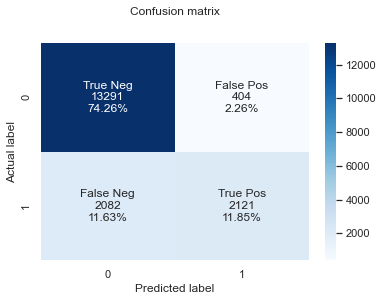

In [101]:
from sklearn import metrics
# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, lr2_y_pred)

group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cnf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cnf_matrix.flatten()/np.sum(cnf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cnf_matrix, annot=labels, fmt='', cmap='Blues')
#sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="Blues" ,fmt='g')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [102]:
from sklearn.metrics import classification_report
print(classification_report(lr2_y_pred, y_test))

              precision    recall  f1-score   support

           0       0.97      0.86      0.91     15373
           1       0.50      0.84      0.63      2525

    accuracy                           0.86     17898
   macro avg       0.74      0.85      0.77     17898
weighted avg       0.90      0.86      0.87     17898



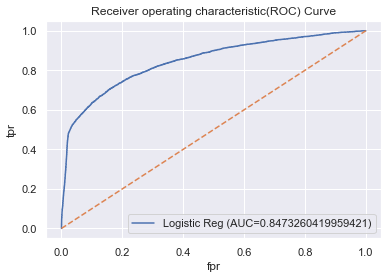

AUC score for test data: 0.8473260419959421
AUC score for train data: 0.8513925074143328


In [103]:
# ROC Curve
lr2_predictions_proba = lr2_model.predict_proba(X_test_rfe)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, lr2_predictions_proba)

auc2 = metrics.roc_auc_score(y_test, lr2_predictions_proba) 

plt.plot(fpr,tpr,label="Logistic Reg (AUC="+str(auc2)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score for the case is 0.84 (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_log_train_2 = lr2_model.predict_proba(X_train_rfe)[:, 1]
auc2_train = metrics.roc_auc_score(y_train, y_proba_log_train_2)

print(f"AUC score for test data: {auc2}")
print(f"AUC score for train data: {auc2_train}")

In [104]:
# Precision-Recall Curve (PR AUC | average precision)
from sklearn.metrics import average_precision_score

# PR AUC score (average precision)
pr_auc = average_precision_score(y_test, lr2_predictions_proba)
pr_auc_train = average_precision_score(y_train, y_proba_log_train_2)

print(f"Average PR AUC score for test data: {pr_auc}")
print(f"Average PR AUC score for train data: {pr_auc_train}")

Average PR AUC score for test data: 0.7085352487231831
Average PR AUC score for train data: 0.7062164535770117


<Figure size 504x504 with 0 Axes>

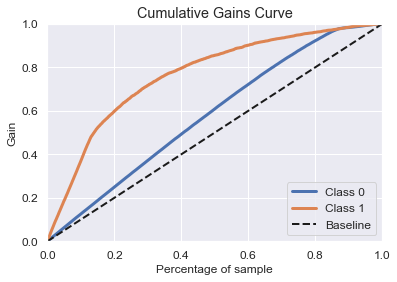

In [105]:
import scikitplot as skplt

# pred1 = clf.predict_proba(X_test)
pred_lr2 = lr2_model.predict_proba(X_test_rfe)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred_lr2)
plt.show()

In [106]:
# Confusion Matrix Evaluation Metrics
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

test_acc = metrics.accuracy_score(lr2_y_pred, y_test)
train_acc = metrics.accuracy_score(lr2_y_pred_train, y_train)
prec = metrics.precision_score(lr2_y_pred, y_test)
rec = metrics.recall_score(lr2_y_pred, y_test)
f1 = f1_score(lr2_y_pred, y_test)
auc2 = metrics.roc_auc_score(y_test, lr2_predictions_proba) 
pr_auc = average_precision_score(y_test, lr2_predictions_proba)

results2 = pd.DataFrame([['Logistic Regression (selected var with RFE)', test_acc, train_acc, prec, rec, f1, auc2, pr_auc]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score', 'AUC Score', 'AUPR Score'])
results2

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,Logistic Regression (selected var with RFE),0.86110,0.86025,0.50464,0.84000,0.63050,0.84733,0.70854


In [74]:
import statsmodels.api as sm
glm2 = sm.GLM(y_train, X_train_rfe, family = sm.families.Binomial()).fit()
glm2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                success   No. Observations:                71592
Model:                            GLM   Df Residuals:                    71569
Model Family:                Binomial   Df Model:                           22
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -26681.
Date:                Tue, 30 Aug 2022   Deviance:                       53362.
Time:                        20:26:07   Pearson chi2:                 1.72e+05
No. Iterations:                    23   Pseudo R-squ. (CS):             0.2916
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
rank                         -0.7609      0.019    -40.786      0.000      -0.797      -0.724
has_pre_seed                 -0.5489      0.071     -7.784      0.000      -0.687      -0.411
has_seriesC                   3.0841      0.039     79.346      0.000       3.008       3.160
has_equity_crowdfunding      -0.7915      0.127     -6.248      0.000      -1.040      -0.543
has_product_crowdfunding     -0.8480      0.240     -3.538      0.000      -1.318      -0.378
has_grant                    -0.8101      0.048    -17.028      0.000      -0.903      -0.717
has_initial_coin_offering    -0.6559      0.396     -1.654      0.098      -1.433       0.121
has_post_ipo_equity           3.9912      0.097     40.942      0.000       3.800       4.182
has_post_ipo_debt             3.1430      0.198     15.901      0.000       2.756       3.530
has_post_ipo_secondary       24.7713   1.48e+04      0.002      0.999    -2.9e+04    2.91e+04
age_first_funding            -0.5365      0.015    -34.740      0.000      -0.567      -0.506
age_years                     0.9977      0.017     59.205      0.000       0.965       1.031
homepage_active              -1.5636      0.020    -77.657      0.000      -1.603      -1.524
category_num_Industry10      -0.2816      0.056     -5.007      0.000      -0.392      -0.171
category_num_Industry11      -0.4920      0.054     -9.056      0.000      -0.598      -0.386
category_num_Industry13      -0.3163      0.034     -9.320      0.000      -0.383      -0.250
category_num_Industry14      -0.3823      0.046     -8.378      0.000      -0.472      -0.293
category_num_Industry2       -0.3856      0.051     -7.580      0.000      -0.485      -0.286
category_num_Industry3       -0.3207      0.089     -3.613      0.000      -0.495      -0.147
category_num_Industry5       -0.2393      0.044     -5.388      0.000      -0.326      -0.152
category_num_Industry6       -0.2164      0.041     -5.263      0.000      -0.297      -0.136
category_num_Industry8       -0.1642      0.050     -3.287      0.001      -0.262      -0.066
category_num_Industry9       -0.2798      0.051     -5.458      0.000      -0.380      -0.179
=============================================================================================
"""

In [75]:
# Odds Ratio
np.exp(glm2.params)

rank                                  0.46726
has_pre_seed                          0.57761
has_seriesC                          21.84749
has_equity_crowdfunding               0.45316
has_product_crowdfunding              0.42827
has_grant                             0.44482
has_initial_coin_offering             0.51900
has_post_ipo_equity                  54.12173
has_post_ipo_debt                    23.17349
has_post_ipo_secondary      57286459029.71966
age_first_funding                     0.58479
age_years                             2.71208
homepage_active                       0.20938
category_num_Industry10               0.75455
category_num_Industry11               0.61140
category_num_Industry13               0.72886
category_num_Industry14               0.68231
category_num_Industry2                0.68004
category_num_Industry3                0.72561
category_num_Industry5                0.78722
category_num_Industry6                0.80539
category_num_Industry8            

##### **2-2) LR Model with Variable Selection with Univariate**

In [107]:
from sklearn.linear_model import LogisticRegression

lr3_model = LogisticRegression(fit_intercept = False, C = 1e9, solver='lbfgs', max_iter=15000, random_state = 42) # add C = 1e9 for not doing a regularization
lr3_model.fit(X_train_selected, y_train)
lr3_y_pred = lr3_model.predict(X_test_selected)
lr3_y_pred_train = lr3_model.predict(X_train_selected)

In [108]:
print("R²=", lr3_model.score(X_train_selected, y_train))
print("intercept = ", lr3_model.intercept_)

R²= 0.8516454352441614
intercept =  [0.]


Text(0.5, 12.5, 'Predicted label')

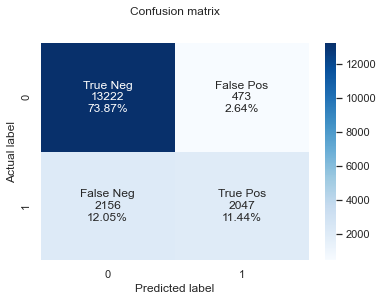

In [109]:
from sklearn import metrics
# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, lr3_y_pred)

group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cnf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cnf_matrix.flatten()/np.sum(cnf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cnf_matrix, annot=labels, fmt='', cmap='Blues')
#sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="Blues" ,fmt='g')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [110]:
from sklearn.metrics import classification_report
print(classification_report(lr3_y_pred, y_test))

              precision    recall  f1-score   support

           0       0.97      0.86      0.91     15378
           1       0.49      0.81      0.61      2520

    accuracy                           0.85     17898
   macro avg       0.73      0.84      0.76     17898
weighted avg       0.90      0.85      0.87     17898



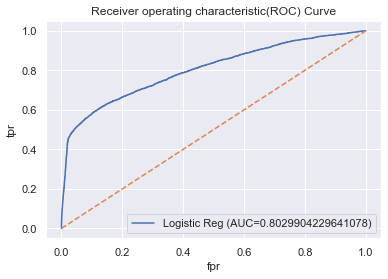

AUC score for test data: 0.8029904229641078
AUC score for train data: 0.8046202955007796


In [111]:
# ROC Curve
lr3_predictions_proba = lr3_model.predict_proba(X_test_selected)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, lr3_predictions_proba)

auc3 = metrics.roc_auc_score(y_test, lr3_predictions_proba) 

plt.plot(fpr,tpr,label="Logistic Reg (AUC="+str(auc3)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score for the case is 0.80 (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_log_train_3 = lr3_model.predict_proba(X_train_selected)[:, 1]
auc3_train = metrics.roc_auc_score(y_train, y_proba_log_train_3)

print(f"AUC score for test data: {auc3}")
print(f"AUC score for train data: {auc3_train}")

In [112]:
# Precision-Recall Curve (PR AUC | average precision)
from sklearn.metrics import average_precision_score

# PR AUC score (average precision)
pr_auc = average_precision_score(y_test, lr3_predictions_proba)
pr_auc_train = average_precision_score(y_train, y_proba_log_train_3)

print(f"Average PR AUC score for test data: {pr_auc}")
print(f"Average PR AUC score for train data: {pr_auc_train}")

Average PR AUC score for test data: 0.6686376505841389
Average PR AUC score for train data: 0.6680699259755163


<Figure size 504x504 with 0 Axes>

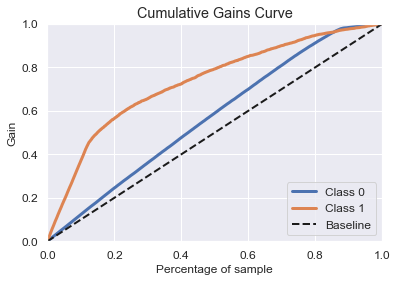

In [113]:
pred_lr3 = lr3_model.predict_proba(X_test_selected)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred_lr3)
plt.show()


In [114]:
# Confusion Matrix Evaluation Metrics
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

test_acc = metrics.accuracy_score(lr3_y_pred, y_test)
train_acc = metrics.accuracy_score(lr3_y_pred_train, y_train)
prec = metrics.precision_score(lr3_y_pred, y_test)
rec = metrics.recall_score(lr3_y_pred, y_test)
f1 = f1_score(lr3_y_pred, y_test)
auc3 = metrics.roc_auc_score(y_test, lr3_predictions_proba)
pr_auc = average_precision_score(y_test, lr3_predictions_proba)

results3 = pd.DataFrame([['Logistic Regression (selected ANOVA F-value)', test_acc, train_acc, prec, rec, f1, auc3, pr_auc]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score', 'AUC Score', 'AUPR Score'])
results3


,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,Logistic Regression (selected ANOVA F-value),0.85311,0.85165,0.48703,0.81230,0.60895,0.80299,0.66864


#### **2> Random Forest** 

Feature Importance Method (using RandomForestClassifier)
As we use decision trees (random forest), we can also try to select variables based on high importance.

In [132]:
# Feature importance is inbuilt with Tree Based Classifiers
from sklearn.ensemble import RandomForestClassifier
np.random.seed(42)

# We already made splited X (independent X columns) and y (target column) in Data Partitioning Step, so we will use them.
# instantiate RandomForestClassifier

# default hyperparameters RF model
rf_model = RandomForestClassifier()
#rf_model = RandomForestClassifier(n_estimators=100, max_features='auto', bootstrap=True, random_state=42)
rf_model.fit(X_train_after_dummy, y_train)

rf_y_pred = rf_model.predict(X_test_after_dummy)
rf_y_pred_train = rf_model.predict(X_train_after_dummy)

Text(0.5, 12.5, 'Predicted label')

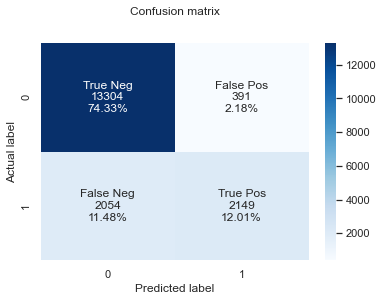

In [133]:
from sklearn import metrics
# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, rf_y_pred)

group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cnf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cnf_matrix.flatten()/np.sum(cnf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cnf_matrix, annot=labels, fmt='', cmap='Blues')
#sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="Blues" ,fmt='g')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')


In [134]:
from sklearn.metrics import classification_report
print(classification_report(rf_y_pred, y_test))

              precision    recall  f1-score   support

           0       0.97      0.87      0.92     15358
           1       0.51      0.85      0.64      2540

    accuracy                           0.86     17898
   macro avg       0.74      0.86      0.78     17898
weighted avg       0.91      0.86      0.88     17898



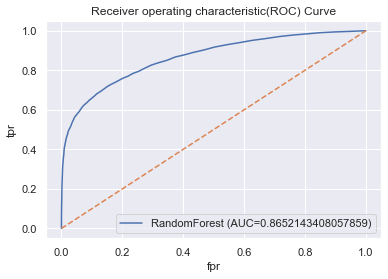

AUC score for test data: 0.8652143408057859
AUC score for train data: 1.0


In [135]:
# ROC Curve
rf_predictions_proba = rf_model.predict_proba(X_test_after_dummy)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, rf_predictions_proba)

auc = metrics.roc_auc_score(y_test, rf_predictions_proba) 

plt.plot(fpr,tpr,label="RandomForest (AUC="+str(auc)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_rf_train = rf_model.predict_proba(X_train_after_dummy)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_rf_train)

print(f"AUC score for test data: {auc}")
print(f"AUC score for train data: {auc_train}")

In [136]:
# Precision-Recall Curve (PR AUC | average precision)
from sklearn.metrics import average_precision_score

# PR AUC score (average precision)
pr_auc = average_precision_score(y_test, rf_predictions_proba)
pr_auc_train = average_precision_score(y_train, y_proba_rf_train)

print(f"Average PR AUC score for test data: {pr_auc}")
print(f"Average PR AUC score for train data: {pr_auc_train}")

Average PR AUC score for test data: 0.754294781954603
Average PR AUC score for train data: 1.0


<Figure size 504x504 with 0 Axes>

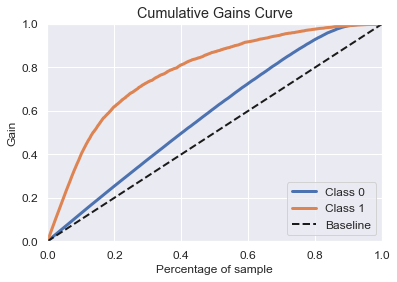

In [137]:
import scikitplot as skplt

# pred1 = clf.predict_proba(X_test)
pred0 = rf_model.predict_proba(X_test_after_dummy)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred0)
plt.show()

In [138]:
# Confusion Matrix Evaluation Metrics
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

test_acc = metrics.accuracy_score(rf_y_pred, y_test)
train_acc = metrics.accuracy_score(rf_y_pred_train, y_train)
prec = metrics.precision_score(rf_y_pred, y_test)
rec = metrics.recall_score(rf_y_pred, y_test)
f1 = f1_score(rf_y_pred, y_test)
auc = metrics.roc_auc_score(y_test, rf_predictions_proba) 
pr_auc = average_precision_score(y_test, rf_predictions_proba)

results_rf = pd.DataFrame([['RandomForest (Base model)', test_acc, train_acc, prec, rec, f1, auc, pr_auc]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score', 'AUC Score', 'AUPR Score'])
results_rf

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,RandomForest (Base model),0.86339,0.99996,0.51130,0.84606,0.63740,0.86521,0.75429


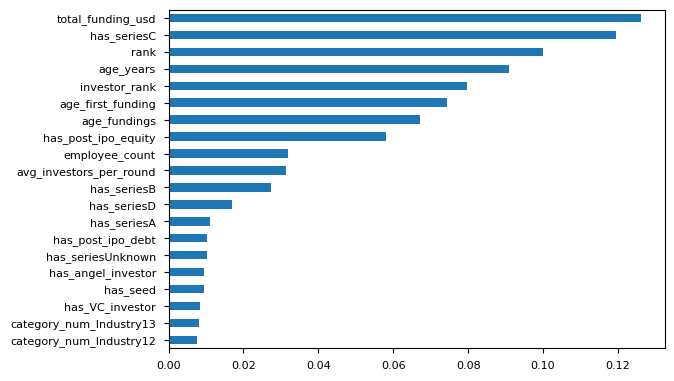

total_funding_usd         0.12613
has_seriesC               0.11960
rank                      0.10003
age_years                 0.09098
investor_rank             0.07965
age_first_funding         0.07438
age_fundings              0.06709
has_post_ipo_equity       0.05795
employee_count            0.03195
avg_investors_per_round   0.03144
has_seriesB               0.02732
has_seriesD               0.01692
has_seriesA               0.01102
has_post_ipo_debt         0.01026
has_seriesUnknown         0.01022
has_angel_investor        0.00960
has_seed                  0.00948
has_VC_investor           0.00840
category_num_Industry13   0.00822
category_num_Industry12   0.00750
dtype: float64


In [189]:
# RandomForest FEATURE IMPORTANCE 
# Print the name and gini importance of each feature
feat_importances = pd.Series(rf_model.feature_importances_, index=X_train_after_dummy.columns)

# determine 20 most important features
df_imp_feat = feat_importances.nlargest(20)

# plot 14 most important features
df_imp_feat.plot(kind='barh').invert_yaxis()
plt.style.use('seaborn-paper')
plt.show()
print(df_imp_feat)

#### **Random Forest Hyperparameter Tuning**

This is quite an overwhelming list! How do we know where to start? A good place is the documentation on the random forest in Scikit-Learn. This tells us the most important settings are the number of trees in the forest (n_estimators) and the number of features considered for splitting at each leaf node (max_features). We could go read the research papers on the random forest and try to theorize the best hyperparameters, but a more efficient use of our time is just to try out a wide range of values and see what works! \
**We will try adjusting the following set of hyperparameters:** \
n_estimators = number of trees in the foreset \
max_features = max number of features considered for splitting a node \
max_depth = max number of levels in each decision tree \
min_samples_split = min number of data points placed in a node before the node is split \
min_samples_leaf = min number of data points allowed in a leaf node \
bootstrap = method for sampling data points (with or without replacement) \

In [93]:
from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(rf_model.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


#### **Random Hyperparameter Tuning - RandomizedSearchCV**
To use RandomizedSearchCV, we first need to create a parameter grid to sample from during fitting:

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
               
pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


On each iteration, the algorithm will choose a difference combination of the features. Altogether, there are 2 * 12 * 2 * 3 * 3 * 10 = 4320 settings! However, the benefit of a random search is that we are not trying every combination, but selecting at random to sample a wide range of values.

In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train_after_dummy, y_train)

In [ ]:
# From these results, we should be able to narrow the range of values for each hyperparameter.
rf_random.best_params_

{'n_estimators': 2000,
 'min_samples_split': 10,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 50,
 'bootstrap': False}

In [ ]:
best_random_model = rf_random.best_estimator_
# random_accuracy = evaluate(best_random, X_test_after_dummy, y_test)
# random_accuracy

In [ ]:
best_random_model

RandomForestClassifier(bootstrap=False, max_depth=50, max_features='auto',
                       min_samples_leaf=2, min_samples_split=10,
                       n_estimators=2000)

In [71]:
# default hyperparameters RF model
# Re run it to save the results
best_random_model = RandomForestClassifier(bootstrap=False, max_depth=50, max_features='auto',
                       min_samples_leaf=2, min_samples_split=10,
                       n_estimators=2000)
#rf_model = RandomForestClassifier(n_estimators=100, max_features='auto', bootstrap=True, random_state=42)
best_random_model.fit(X_train_after_dummy, y_train)

rf_random_y_pred = best_random_model.predict(X_test_after_dummy)
rf_random_y_pred_train = best_random_model.predict(X_train_after_dummy)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.



Text(0.5, 12.5, 'Predicted label')

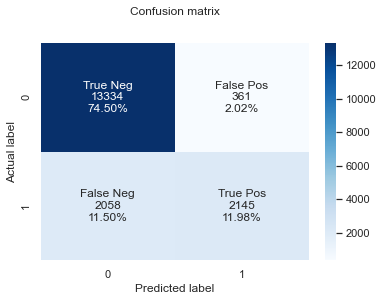

In [72]:
from sklearn import metrics
# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, rf_random_y_pred)

group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cnf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cnf_matrix.flatten()/np.sum(cnf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cnf_matrix, annot=labels, fmt='', cmap='Blues')
#sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="Blues" ,fmt='g')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')


In [73]:
from sklearn.metrics import classification_report
print(classification_report(rf_random_y_pred, y_test))

              precision    recall  f1-score   support

           0       0.97      0.87      0.92     15392
           1       0.51      0.86      0.64      2506

    accuracy                           0.86     17898
   macro avg       0.74      0.86      0.78     17898
weighted avg       0.91      0.86      0.88     17898



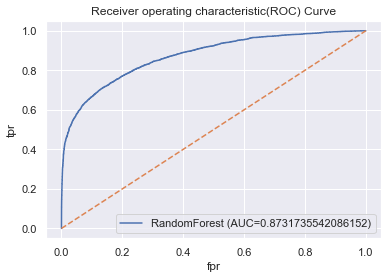

AUC score for test data: 0.8731735542086152
AUC score for train data: 0.9974435245938931


In [74]:
# ROC Curve
rf_random_predictions_proba = best_random_model.predict_proba(X_test_after_dummy)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, rf_random_predictions_proba)

auc = metrics.roc_auc_score(y_test, rf_random_predictions_proba) 

plt.plot(fpr,tpr,label="RandomForest (AUC="+str(auc)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_rf_random_train = best_random_model.predict_proba(X_train_after_dummy)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_rf_random_train)

print(f"AUC score for test data: {auc}")
print(f"AUC score for train data: {auc_train}")

In [75]:
# Precision-Recall Curve (PR AUC | average precision)
from sklearn.metrics import average_precision_score

# PR AUC score (average precision)
pr_auc = average_precision_score(y_test, rf_random_predictions_proba)
pr_auc_train = average_precision_score(y_train, y_proba_rf_random_train)

print(f"Average PR AUC score for test data: {pr_auc}")
print(f"Average PR AUC score for train data: {pr_auc_train}")

Average PR AUC score for test data: 0.7654857627533111
Average PR AUC score for train data: 0.9908908931523408


<Figure size 504x504 with 0 Axes>

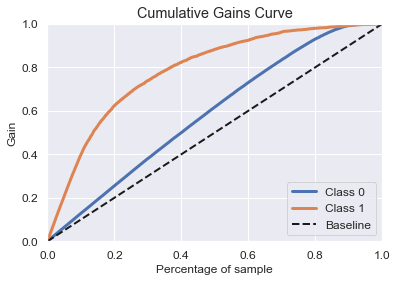

In [76]:
import scikitplot as skplt

# pred1 = clf.predict_proba(X_test)
pred13 = best_random_model.predict_proba(X_test_after_dummy)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred13)
plt.show()

In [77]:
# Final Result
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

test_acc = metrics.accuracy_score(rf_random_y_pred, y_test)
train_acc = metrics.accuracy_score(rf_random_y_pred_train, y_train)
prec = metrics.precision_score(rf_random_y_pred, y_test)
rec = metrics.recall_score(rf_random_y_pred, y_test)
f1 = f1_score(rf_random_y_pred, y_test)
auc = metrics.roc_auc_score(y_test, rf_random_predictions_proba)
pr_auc = average_precision_score(y_test, rf_random_predictions_proba)


results_rf_random = pd.DataFrame([['RandomForest (RandomSearchCV selected model)', test_acc, train_acc, prec, rec, f1, auc, pr_auc]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score', 'AUC Score', 'AUPR Score'])
results_rf_random

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,RandomForest (RandomSearchCV selected model),0.86485,0.95294,0.51035,0.85595,0.63944,0.87317,0.76549


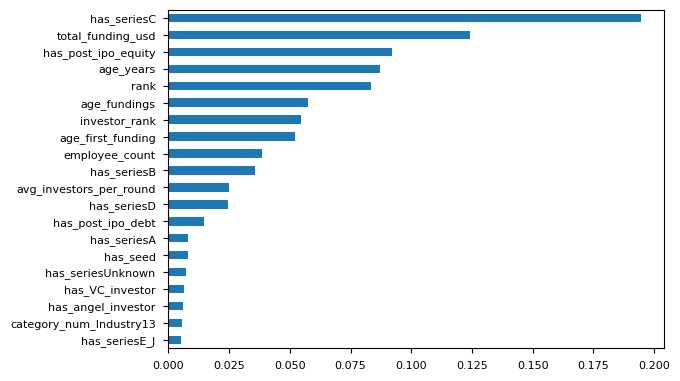

has_seriesC               0.19449
total_funding_usd         0.12428
has_post_ipo_equity       0.09191
age_years                 0.08728
rank                      0.08327
age_fundings              0.05745
investor_rank             0.05470
age_first_funding         0.05231
employee_count            0.03844
has_seriesB               0.03578
avg_investors_per_round   0.02479
has_seriesD               0.02472
has_post_ipo_debt         0.01479
has_seriesA               0.00813
has_seed                  0.00806
has_seriesUnknown         0.00712
has_VC_investor           0.00649
has_angel_investor        0.00598
category_num_Industry13   0.00546
has_seriesE_J             0.00516
dtype: float64


In [188]:
# RandomForest FEATURE IMPORTANCE 
# Print the name and gini importance of each feature
feat_importances_rf_random= pd.Series(best_random_model.feature_importances_, index=X_train_after_dummy.columns)

# determine 20 most important features
df_imp_feat_rf_random = feat_importances_rf_random.nlargest(20)

# plot 14 most important features
df_imp_feat_rf_random.plot(kind='barh').invert_yaxis()
plt.style.use('seaborn-paper')
plt.show()
print(df_imp_feat_rf_random)

#### **Random forest Manual Hyperparameter Tuning**

In [64]:
# Feature importance is inbuilt with Tree Based Classifiers
from sklearn.ensemble import RandomForestClassifier
np.random.seed(42)

# We already made splited X (independent X columns) and y (target column) in Data Partitioning Step, so we will use them.
# instantiate RandomForestClassifier

# default hyperparameters RF model
rf_manual_model = RandomForestClassifier(bootstrap=False, max_depth=50, max_features='auto', min_samples_leaf=6, min_samples_split=10, n_estimators=2000)
#rf_manual_model = RandomForestClassifier(bootstrap=False, max_depth=45, max_features ='sqrt', min_samples_leaf=8, min_samples_split=10, n_estimators=1800)

# {'n_estimators': 2000,
#  'min_samples_split': 10,
#  'min_samples_leaf': 2,
#  'max_features': 'auto',
#  'max_depth': 50,
#  'bootstrap': False}
#rf_model = RandomForestClassifier(n_estimators=100, max_features='auto', bootstrap=True, random_state=42)
rf_manual_model.fit(X_train_after_dummy, y_train)

rf_manual_y_pred = rf_manual_model.predict(X_test_after_dummy)
rf_manual_y_pred_train = rf_manual_model.predict(X_train_after_dummy)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.



Text(0.5, 12.5, 'Predicted label')

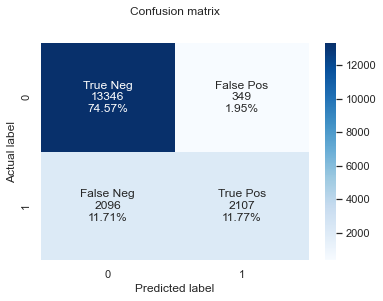

In [65]:
from sklearn import metrics
# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, rf_manual_y_pred)

group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cnf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cnf_matrix.flatten()/np.sum(cnf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cnf_matrix, annot=labels, fmt='', cmap='Blues')
#sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="Blues" ,fmt='g')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')


In [66]:
from sklearn.metrics import classification_report
print(classification_report(rf_manual_y_pred, y_test))

              precision    recall  f1-score   support

           0       0.97      0.86      0.92     15442
           1       0.50      0.86      0.63      2456

    accuracy                           0.86     17898
   macro avg       0.74      0.86      0.77     17898
weighted avg       0.91      0.86      0.88     17898



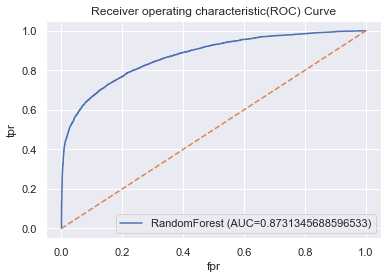

AUC score for test data: 0.8731345688596533
AUC score for train data: 0.9794802258421516


In [67]:
# ROC Curve
rf_manual_predictions_proba = rf_manual_model.predict_proba(X_test_after_dummy)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, rf_manual_predictions_proba)

auc = metrics.roc_auc_score(y_test, rf_manual_predictions_proba) 

plt.plot(fpr,tpr,label="RandomForest (AUC="+str(auc)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_rf_manual_train = rf_manual_model.predict_proba(X_train_after_dummy)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_rf_manual_train)

print(f"AUC score for test data: {auc}")
print(f"AUC score for train data: {auc_train}")

In [68]:
# Precision-Recall Curve (PR AUC | average precision)
from sklearn.metrics import average_precision_score

# PR AUC score (average precision)
pr_auc = average_precision_score(y_test, rf_manual_predictions_proba)
pr_auc_train = average_precision_score(y_train, y_proba_rf_manual_train)

print(f"Average PR AUC score for test data: {pr_auc}")
print(f"Average PR AUC score for train data: {pr_auc_train}")

Average PR AUC score for test data: 0.7643344393522522
Average PR AUC score for train data: 0.9345951518389466


<Figure size 504x504 with 0 Axes>

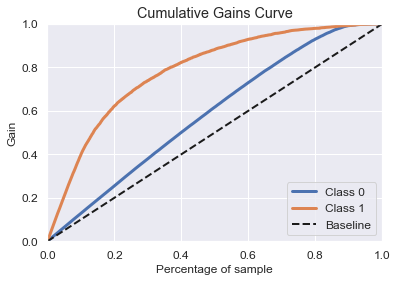

In [69]:
import scikitplot as skplt

# pred1 = clf.predict_proba(X_test)
pred12 = rf_manual_model.predict_proba(X_test_after_dummy)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred12)
plt.show()

In [70]:
# Confusion Matrix Evaluation Metrics
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

test_acc = metrics.accuracy_score(rf_manual_y_pred, y_test)
train_acc = metrics.accuracy_score(rf_manual_y_pred_train, y_train)
prec = metrics.precision_score(rf_manual_y_pred, y_test)
rec = metrics.recall_score(rf_manual_y_pred, y_test)
f1 = f1_score(rf_manual_y_pred, y_test)
auc = metrics.roc_auc_score(y_test, rf_manual_predictions_proba) 
pr_auc = average_precision_score(y_test, rf_manual_predictions_proba)

results_rf_manual = pd.DataFrame([['RandomForest (Manual Tuning model)', test_acc, train_acc, prec, rec, f1, auc, pr_auc]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score', 'AUC Score', 'AUPR Score'])
results_rf_manual

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,RandomForest (Manual Tuning model),0.86339,0.89113,0.50131,0.85790,0.63283,0.87313,0.76433


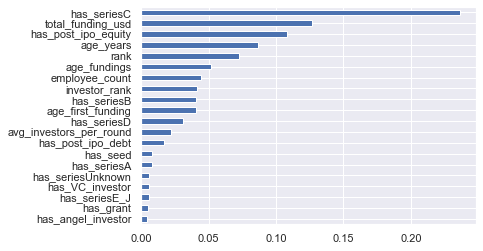

has_seriesC               0.23634
total_funding_usd         0.12644
has_post_ipo_equity       0.10822
age_years                 0.08663
rank                      0.07246
age_fundings              0.05189
employee_count            0.04410
investor_rank             0.04151
has_seriesB               0.04097
age_first_funding         0.04072
has_seriesD               0.03109
avg_investors_per_round   0.02190
has_post_ipo_debt         0.01666
has_seed                  0.00795
has_seriesA               0.00788
has_seriesUnknown         0.00618
has_VC_investor           0.00591
has_seriesE_J             0.00558
has_grant                 0.00483
has_angel_investor        0.00450
dtype: float64


In [110]:
# RandomForest FEATURE IMPORTANCE 
# Print the name and gini importance of each feature
feat_importances_rf_manual = pd.Series(rf_manual_model.feature_importances_, index=X_train_after_dummy.columns)

# determine 20 most important features
df_imp_feat_rf_manual = feat_importances_rf_manual.nlargest(20)

# plot 14 most important features
df_imp_feat_rf_manual.plot(kind='barh').invert_yaxis()
plt.show()
print(df_imp_feat_rf_manual)

#### **Random Forest Hyperparameter Tuning - GridSearchCV**

In [ ]:
# The best Params selected from RandomSearchCV
# previous options
# {'bootstrap': [True, False],
#  'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
#  'max_features': ['auto', 'sqrt'],
#  'min_samples_leaf': [1, 2, 4],
#  'min_samples_split': [2, 5, 10],
#  'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


# {'n_estimators': 2000,
#  'min_samples_split': 10,
#  'min_samples_leaf': 2,
#  'max_features': 'auto',
#  'max_depth': 50,
#  'bootstrap': False}

Random search allowed us to narrow down the range for each hyperparameter. Now that we know where to concentrate our search, we can explicitly specify every combination of settings to try. We do this with GridSearchCV, a method that, instead of sampling randomly from a distribution, evaluates all combinations we define. **To use Grid Search, we make another grid based on the best values provided by random search:**

In [ ]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [False],
    'max_depth': [40, 50, 60],
    'max_features': ['auto'],
    'min_samples_leaf': [2, 4, 6],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [1800, 2000, 2200]
}
# Create a based model
rf = RandomForestClassifier(random_state=42)
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)

In [ ]:
# Fit the grid search to the data
grid_search.fit(X_train_after_dummy, y_train)
grid_search.best_params_

In [ ]:
grid_search.best_params_
# it turns out like below:
# {'bootstrap': False,
#  'max_depth': 40,
#  'max_features': 'auto',
#  'min_samples_leaf': 2,
#  'min_samples_split': 12,
#  'n_estimators': 1800}

In [ ]:
# best_grid = grid_search.best_estimator_
# grid_accuracy = evaluate(best_grid, X_test_after_dummy, y_test)
# grid_accuracy

In [ ]:
# # How much improved from base model to grid search best params model
# print('Improvement of {:0.2f}%.'.format( 100 * (grid_accuracy - base_accuracy) / base_accuracy))

In [57]:
# Selected Best model based on GridSearchCV result

# Feature importance is inbuilt with Tree Based Classifiers
from sklearn.ensemble import RandomForestClassifier
np.random.seed(42)

# We already made splited X (independent X columns) and y (target column) in Data Partitioning Step, so we will use them.
# instantiate RandomForestClassifier

# default hyperparameters RF model
#first best version
rf_grid_model = RandomForestClassifier(bootstrap=False, max_depth=40, max_features='auto', min_samples_leaf=2, min_samples_split=12, n_estimators=1800)

rf_grid_model.fit(X_train_after_dummy, y_train)

rf_grid_y_pred = rf_grid_model.predict(X_test_after_dummy)
rf_grid_y_pred_train = rf_grid_model.predict(X_train_after_dummy)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.



Text(0.5, 12.5, 'Predicted label')

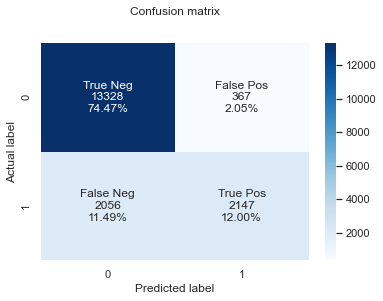

In [58]:
from sklearn import metrics
# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, rf_grid_y_pred)

group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cnf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cnf_matrix.flatten()/np.sum(cnf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cnf_matrix, annot=labels, fmt='', cmap='Blues')
#sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="Blues" ,fmt='g')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')


In [59]:
from sklearn.metrics import classification_report
print(classification_report(rf_grid_y_pred, y_test))

              precision    recall  f1-score   support

           0       0.97      0.87      0.92     15384
           1       0.51      0.85      0.64      2514

    accuracy                           0.86     17898
   macro avg       0.74      0.86      0.78     17898
weighted avg       0.91      0.86      0.88     17898



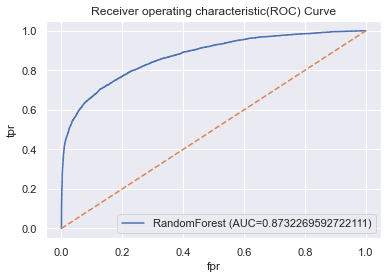

AUC score for test data: 0.8732269592722111
AUC score for train data: 0.9960424655996167


In [60]:
# ROC Curve
rf_grid_predictions_proba = rf_grid_model.predict_proba(X_test_after_dummy)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, rf_grid_predictions_proba)

auc = metrics.roc_auc_score(y_test, rf_grid_predictions_proba) 

plt.plot(fpr,tpr,label="RandomForest (AUC="+str(auc)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_rf_grid_train = rf_grid_model.predict_proba(X_train_after_dummy)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_rf_grid_train)

print(f"AUC score for test data: {auc}")
print(f"AUC score for train data: {auc_train}")

In [61]:
# Precision-Recall Curve (PR AUC | average precision)
from sklearn.metrics import average_precision_score

# PR AUC score (average precision)
pr_auc = average_precision_score(y_test, rf_grid_predictions_proba)
pr_auc_train = average_precision_score(y_train, y_proba_rf_grid_train)

print(f"Average PR AUC score for test data: {pr_auc}")
print(f"Average PR AUC score for train data: {pr_auc_train}")

Average PR AUC score for test data: 0.7656423730726254
Average PR AUC score for train data: 0.9857089823084421


<Figure size 504x504 with 0 Axes>

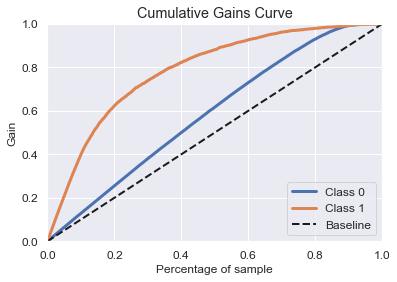

In [62]:
import scikitplot as skplt

# pred1 = clf.predict_proba(X_test)
pred14 = rf_grid_model.predict_proba(X_test_after_dummy)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred14)
plt.show()

In [63]:
# Confusion Matrix Evaluation Metrics
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

test_acc = metrics.accuracy_score(rf_grid_y_pred, y_test)
train_acc = metrics.accuracy_score(rf_grid_y_pred_train, y_train)
prec = metrics.precision_score(rf_grid_y_pred, y_test)
rec = metrics.recall_score(rf_grid_y_pred, y_test)
f1 = f1_score(rf_grid_y_pred, y_test)
auc = metrics.roc_auc_score(y_test, rf_grid_predictions_proba) 
pr_auc = average_precision_score(y_test, rf_grid_predictions_proba)

results_rf_grid = pd.DataFrame([['RandomForest (GridSearchCV Tuning model)', test_acc, train_acc, prec, rec, f1, auc, pr_auc]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score', 'AUC Score', 'AUPR Score'])
results_rf_grid

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,RandomForest (GridSearchCV Tuning model),0.86462,0.94164,0.51083,0.85402,0.63927,0.87323,0.76564


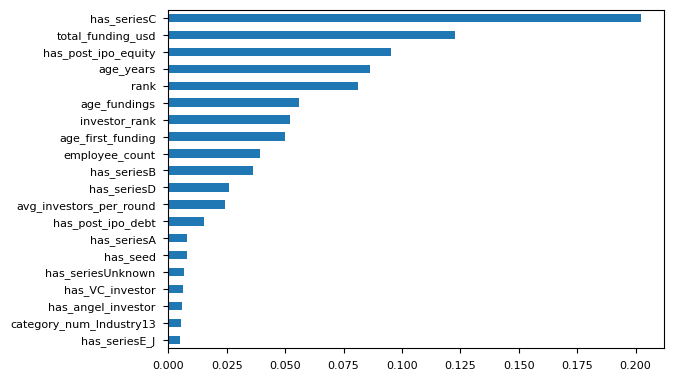

has_seriesC               0.20222
total_funding_usd         0.12260
has_post_ipo_equity       0.09520
age_years                 0.08611
rank                      0.08113
age_fundings              0.05581
investor_rank             0.05186
age_first_funding         0.04988
employee_count            0.03926
has_seriesB               0.03633
has_seriesD               0.02602
avg_investors_per_round   0.02422
has_post_ipo_debt         0.01535
has_seriesA               0.00814
has_seed                  0.00791
has_seriesUnknown         0.00689
has_VC_investor           0.00636
has_angel_investor        0.00578
category_num_Industry13   0.00521
has_seriesE_J             0.00514
dtype: float64


In [186]:
# RandomForest FEATURE IMPORTANCE 
# Print the name and gini importance of each feature
feat_importances_rf_grid = pd.Series(rf_grid_model.feature_importances_, index=X_train_after_dummy.columns)

# determine 20 most important features
df_imp_feat_rf_grid = feat_importances_rf_grid.nlargest(20)

# plot 14 most important features
df_imp_feat_rf_grid.plot(kind='barh').invert_yaxis()
plt.style.use('seaborn-paper')
plt.show()
print(df_imp_feat_rf_grid)


#### **3> XGBoost**

In [115]:
cat_columns_after = list(X_train_after_dummy.select_dtypes('category'))
print(cat_columns_after)

['employee_count', 'has_angel', 'has_pre_seed', 'has_seed', 'has_seriesUnknown', 'has_seriesA', 'has_seriesB', 'has_seriesC', 'has_seriesD', 'has_seriesE_J', 'has_equity_crowdfunding', 'has_product_crowdfunding', 'has_private_equity', 'has_convertible_note', 'has_debt_financing', 'has_secondary_market', 'has_grant', 'has_corporate_round', 'has_initial_coin_offering', 'has_post_ipo_equity', 'has_post_ipo_debt', 'has_post_ipo_secondary', 'has_non_equity_assistance', 'has_undisclosed', 'homepage_active', 'has_VC_investor', 'has_angel_investor', 'category_num_Industry10', 'category_num_Industry11', 'category_num_Industry12', 'category_num_Industry13', 'category_num_Industry14', 'category_num_Industry2', 'category_num_Industry3', 'category_num_Industry4', 'category_num_Industry5', 'category_num_Industry6', 'category_num_Industry7', 'category_num_Industry8', 'category_num_Industry9']


In [116]:
X_train_int = X_train_after_dummy.copy()
X_test_int = X_test_after_dummy.copy()

In [117]:
X_train_int[cat_columns_after] = X_train_int[cat_columns_after].apply(lambda x: x.astype('Int64'))
X_test_int[cat_columns_after] = X_test_int[cat_columns_after].apply(lambda x: x.astype('Int64'))

Accuracy on Train set 0.8601100681640407
Accuracy on Test set 0.8593138898200916
F1-score on Test set: 0.6044612001256676


              precision    recall  f1-score   support

           0       0.86      0.98      0.91     13695
           1       0.89      0.46      0.60      4203

    accuracy                           0.86     17898
   macro avg       0.87      0.72      0.76     17898
weighted avg       0.86      0.86      0.84     17898





Text(0.5, 12.5, 'Predicted label')

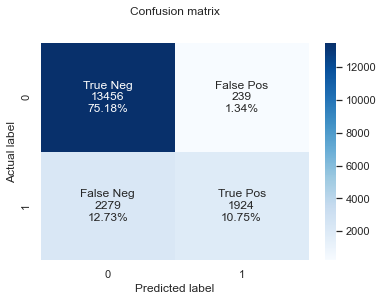

In [118]:
# Xgboost
import xgboost as xgb


# create object model
# for all columns that represent categorical features. After which, users can tell XGBoost to enable training with categorical data by "enable_categorical=True"

Xgboost_model = xgb.XGBClassifier(booster='gbtree', objective = 'binary:logistic',
                                  learning_rate=0.01, verbosity=1, random_state = 42)

# fit the model
Xgboost_model.fit(X_train_int, y_train)

# model score
Xgboost_y_pred_train = Xgboost_model.predict(X_train_int)
Xgboost_y_pred_test = Xgboost_model.predict(X_test_int)

# accuracy score
Xgb_train_score = Xgboost_model.score(X_train_int,y_train)
Xgb_test_score = Xgboost_model.score(X_test_int,y_test)

Xgb_f1_score = metrics.f1_score(Xgboost_y_pred_test, y_test)

print('Accuracy on Train set',Xgb_train_score)
print('Accuracy on Test set',Xgb_test_score)
print('F1-score on Test set:',Xgb_f1_score)
print('\n')
print(metrics.classification_report(y_test, Xgboost_y_pred_test))
print('\n')

# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, Xgboost_y_pred_test)

group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cnf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cnf_matrix.flatten()/np.sum(cnf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)

sns.heatmap(cnf_matrix, annot=labels, fmt='', cmap='Blues')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

#metrics.plot_roc_curve(Xgboost_model, X_test_int, y_test)

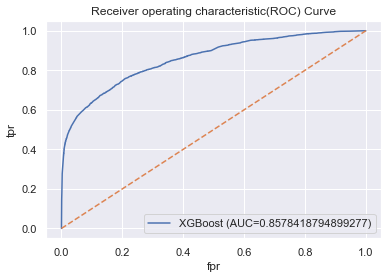

AUC score for test data: 0.8578418794899277
AUC score for train data: 0.862385729650774


In [119]:
# ROC Curve
Xgboost_predictions_proba = Xgboost_model.predict_proba(X_test_int)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, Xgboost_predictions_proba)

auc = metrics.roc_auc_score(y_test, Xgboost_predictions_proba) 

plt.plot(fpr,tpr,label="XGBoost (AUC="+str(auc)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_xgb_train = Xgboost_model.predict_proba(X_train_int)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_xgb_train)

print(f"AUC score for test data: {auc}")
print(f"AUC score for train data: {auc_train}")

In [120]:
# Precision-Recall Curve (PR AUC | average precision)
from sklearn.metrics import average_precision_score

# PR AUC score (average precision)
pr_auc = average_precision_score(y_test, Xgboost_predictions_proba)
pr_auc_train = average_precision_score(y_train, y_proba_xgb_train)

print(f"Average PR AUC score for test data: {pr_auc}")
print(f"Average PR AUC score for train data: {pr_auc_train}")

Average PR AUC score for test data: 0.7471132230662336
Average PR AUC score for train data: 0.7536423284923535


<Figure size 504x504 with 0 Axes>

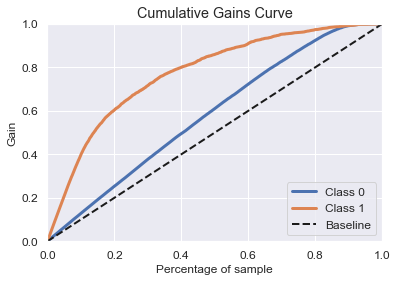

In [121]:
import scikitplot as skplt

# pred1 = clf.predict_proba(X_test)
pred4 = Xgboost_model.predict_proba(X_test_int)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred4)
plt.show()

In [122]:
# Confusion Matrix Evaluation Metrics
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

prec = metrics.precision_score(Xgboost_y_pred_test, y_test)
rec = metrics.recall_score(Xgboost_y_pred_test, y_test)
f1 = f1_score(Xgboost_y_pred_test, y_test)
auc = metrics.roc_auc_score(y_test, Xgboost_predictions_proba) 
pr_auc = average_precision_score(y_test, Xgboost_predictions_proba)

results_xgb = pd.DataFrame([['XGBoost(Base model)', Xgb_test_score, Xgb_train_score, prec, rec, f1, auc, pr_auc]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score', 'AUC Score', 'AUPR Score'])
results_xgb

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,XGBoost(Base model),0.85931,0.86011,0.45777,0.88951,0.60446,0.85784,0.74711


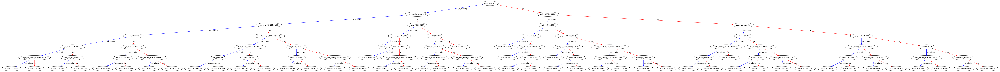

In [127]:
from numpy import loadtxt
from xgboost import XGBClassifier
from xgboost import plot_tree
import matplotlib
import matplotlib.pyplot as plt

# Visualize Gradient Boosting Decision Trees
# plot_tree(Xgboost_model, num_trees=5)
plot_tree(Xgboost_model)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(200, 200)

In [465]:
#fig.savefig('XGBoost_tree.png')

**XGBoost Parameter Tuning for imbalanced data using GridSearch CV**

In [226]:
from sklearn.model_selection import GridSearchCV
from collections import Counter

def find_optimal_parameters(X, y):

    tot = Counter(y)
    print("Ratio of majority class to minority class: ", tot[0] / tot[1])
    parameters = {'max_depth': [3, 4, 5],
                  'scale_pos_weight': [i for i in range(1, round(tot[0] / tot[1])+1, 1)]}

    clf = xgb.XGBClassifier(eval_metric='logloss', use_label_encoder=False)
    model = GridSearchCV(clf, parameters, scoring='recall', cv=5, n_jobs=4, verbose=7)
    model.fit(X, y)
    y_preds = model.predict(X)
    y_probs = model.predict_proba(X)
    print("AUC-ROC: ", roc_auc_score(y, y_probs[:, 1]))
    print("tn, fp, fn, tp: ", confusion_matrix(y, y_preds).ravel())
    print(model.best_params_)
    print(model.best_estimator_)

In [481]:
print(Counter(y_train))

Counter({0: 54781, 1: 16811})


In [482]:
find_optimal_parameters(X_train_int, y_train)

Ratio of majority class to minority class:  3.258640176075189
Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 3/5] END ...max_depth=3, scale_pos_weight=1;, score=0.503 total time=  19.3s
[CV 2/5] END ...max_depth=3, scale_pos_weight=1;, score=0.517 total time=  19.4s
[CV 4/5] END ...max_depth=3, scale_pos_weight=1;, score=0.513 total time=  19.3s
[CV 1/5] END ...max_depth=3, scale_pos_weight=1;, score=0.508 total time=  19.5s
[CV 5/5] END ...max_depth=3, scale_pos_weight=1;, score=0.514 total time=  20.4s
[CV 1/5] END ...max_depth=3, scale_pos_weight=2;, score=0.652 total time=  20.5s
[CV 2/5] END ...max_depth=3, scale_pos_weight=2;, score=0.639 total time=  20.5s
[CV 3/5] END ...max_depth=3, scale_pos_weight=2;, score=0.615 total time=  20.5s
[CV 5/5] END ...max_depth=3, scale_pos_weight=2;, score=0.644 total time=  21.1s
[CV 4/5] END ...max_depth=3, scale_pos_weight=2;, score=0.636 total time=  21.4s
[CV 1/5] END ...max_depth=3, scale_pos_weight=3;, score=0.742 total 

In [123]:
# Xgboost
import xgboost as xgb

Xgboost_tuned_model = xgb.XGBClassifier(base_score=0.5, booster='gbtree', objective = 'binary:logistic', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_to_onehot=4, max_delta_step=0, max_depth=4,
              max_leaves=0, min_child_weight=1,
              monotone_constraints='()', n_estimators=100, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=3)

In [124]:
# fit the model
Xgboost_tuned_model.fit(X_train_int, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_to_onehot=4, max_delta_step=0, max_depth=4,
              max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

Accuracy on Train set 0.8388646776176109
Accuracy on Test set 0.8255671024695497
F1-score on Test set: 0.6623404715552671


              precision    recall  f1-score   support

           0       0.91      0.86      0.88     13695
           1       0.61      0.73      0.66      4203

    accuracy                           0.83     17898
   macro avg       0.76      0.79      0.77     17898
weighted avg       0.84      0.83      0.83     17898





Text(0.5, 12.5, 'Predicted label')

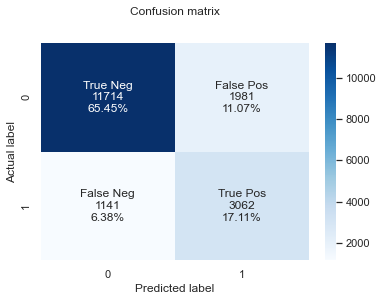

In [125]:
# model score
Xgboost_tuned_y_pred_train = Xgboost_tuned_model.predict(X_train_int)
Xgboost_tuned_y_pred_test = Xgboost_tuned_model.predict(X_test_int)

# accuracy score
Xgb_tuned_train_score = Xgboost_tuned_model.score(X_train_int,y_train)
Xgb_tuned_test_score = Xgboost_tuned_model.score(X_test_int,y_test)

Xgb_tuned_f1_score = metrics.f1_score(Xgboost_tuned_y_pred_test, y_test)

print('Accuracy on Train set',Xgb_tuned_train_score)
print('Accuracy on Test set',Xgb_tuned_test_score)
print('F1-score on Test set:',Xgb_tuned_f1_score)
print('\n')
print(metrics.classification_report(y_test, Xgboost_tuned_y_pred_test))
print('\n')

# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, Xgboost_tuned_y_pred_test)

group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cnf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cnf_matrix.flatten()/np.sum(cnf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)

sns.heatmap(cnf_matrix, annot=labels, fmt='', cmap='Blues')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

#metrics.plot_roc_curve(Xgboost_model, X_test_int, y_test)

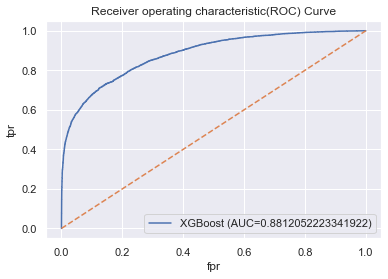

AUC score for test data: 0.8812052223341922
AUC score for train data: 0.9028501584666557


In [126]:
# ROC Curve
Xgboost_tuned_predictions_proba = Xgboost_tuned_model.predict_proba(X_test_int)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, Xgboost_tuned_predictions_proba)

auc = metrics.roc_auc_score(y_test, Xgboost_tuned_predictions_proba) 

plt.plot(fpr,tpr,label="XGBoost (AUC="+str(auc)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_xgb_tuned_train = Xgboost_tuned_model.predict_proba(X_train_int)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_xgb_tuned_train)

print(f"AUC score for test data: {auc}")
print(f"AUC score for train data: {auc_train}")

In [127]:
# Precision-Recall Curve (PR AUC | average precision)
from sklearn.metrics import average_precision_score

# PR AUC score (average precision)
pr_auc = average_precision_score(y_test, Xgboost_tuned_predictions_proba)
pr_auc_train = average_precision_score(y_train, y_proba_xgb_tuned_train)

print(f"Average PR AUC score for test data: {pr_auc}")
print(f"Average PR AUC score for train data: {pr_auc_train}")

Average PR AUC score for test data: 0.7709283620333494
Average PR AUC score for train data: 0.7992583897689716


<Figure size 504x504 with 0 Axes>

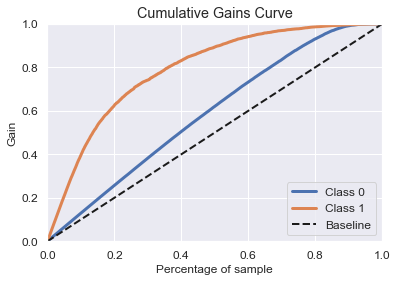

In [128]:
import scikitplot as skplt

# pred1 = clf.predict_proba(X_test)
pred5 = Xgboost_tuned_model.predict_proba(X_test_int)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred5)
plt.show()

In [129]:
# Confusion Matrix Evaluation Metrics
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

prec = metrics.precision_score(Xgboost_tuned_y_pred_test, y_test)
rec = metrics.recall_score(Xgboost_tuned_y_pred_test, y_test)
f1 = f1_score(Xgboost_tuned_y_pred_test, y_test)
auc = metrics.roc_auc_score(y_test, Xgboost_tuned_predictions_proba) 
pr_auc = average_precision_score(y_test, Xgboost_tuned_predictions_proba)

results_xgb_tuned = pd.DataFrame([['XGBoost (params tuning GridSearchCV)', Xgb_tuned_test_score, Xgb_tuned_train_score, prec, rec, f1, auc, pr_auc]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score', 'AUC Score', 'AUPR Score'])
results_xgb_tuned

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,XGBoost (params tuning GridSearchCV),0.82557,0.83886,0.72853,0.60718,0.66234,0.88121,0.77093


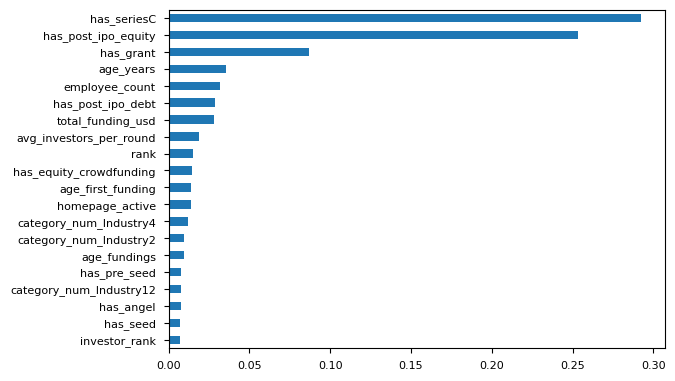

has_seriesC               0.29227
has_post_ipo_equity       0.25347
has_grant                 0.08663
age_years                 0.03580
employee_count            0.03203
has_post_ipo_debt         0.02889
total_funding_usd         0.02841
avg_investors_per_round   0.01860
rank                      0.01484
has_equity_crowdfunding   0.01430
age_first_funding         0.01371
homepage_active           0.01370
category_num_Industry4    0.01228
category_num_Industry2    0.00986
age_fundings              0.00931
has_pre_seed              0.00786
category_num_Industry12   0.00781
has_angel                 0.00761
has_seed                  0.00717
investor_rank             0.00683
dtype: float32


In [187]:
# XGBoost GridSearchCV FEATURE IMPORTANCE 
# Print the name and gini importance of each feature
feat_importances_xgb_grid = pd.Series(Xgboost_tuned_model.feature_importances_, index=X_train_int.columns)

# determine 20 most important features
df_imp_feat_xgb_grid = feat_importances_xgb_grid.nlargest(20)

# plot 14 most important features
df_imp_feat_xgb_grid.plot(kind='barh').invert_yaxis()
plt.style.use('seaborn-paper')
plt.show()
print(df_imp_feat_xgb_grid)

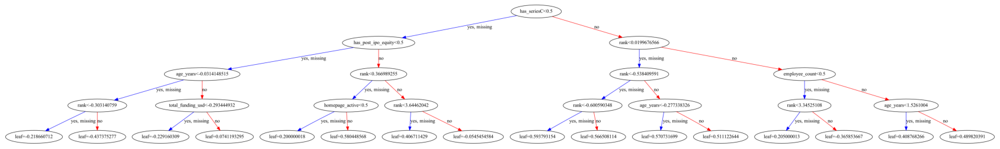

In [136]:
from numpy import loadtxt
from xgboost import XGBClassifier
from xgboost import plot_tree
import matplotlib
import matplotlib.pyplot as plt

# Visualize Gradient Boosting Decision Trees
# plot_tree(Xgboost_model, num_trees=5)
plot_tree(Xgboost_tuned_model)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(30, 400)

In [ ]:
#fig.savefig('XGBoost_tree.png')

### **Comparison between LR Models**

In [130]:
lr_results_total = pd.concat([results, results0, results2, results3], ignore_index=True)
lr_results_total

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,Logistic Regression (Base model),0.86188,0.86272,0.51463,0.83353,0.63636,0.85594,0.71921
1,Logistic Regression (var select with p-value),0.86172,0.86248,0.51368,0.83359,0.63565,0.85543,0.71790
2,Logistic Regression (selected var with RFE),0.86110,0.86025,0.50464,0.84000,0.63050,0.84733,0.70854
3,Logistic Regression (selected ANOVA F-value),0.85311,0.85165,0.48703,0.81230,0.60895,0.80299,0.66864


In [147]:
# lr_results_total.to_csv('lr_results_total.csv')

### **Comparison between RandomForest Models**

In [139]:
rf_results_total = pd.concat([results_rf, results_rf_random, results_rf_manual, results_rf_grid], ignore_index=True)
rf_results_total

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,RandomForest (Base model),0.86339,0.99996,0.51130,0.84606,0.63740,0.86521,0.75429
1,RandomForest (RandomSearchCV selected model),0.86485,0.95294,0.51035,0.85595,0.63944,0.87317,0.76549
2,RandomForest (Manual Tuning model),0.86339,0.89113,0.50131,0.85790,0.63283,0.87313,0.76433
3,RandomForest (GridSearchCV Tuning model),0.86462,0.94164,0.51083,0.85402,0.63927,0.87323,0.76564


In [146]:
# rf_results_total.to_csv('rf_results_total.csv')

### **Comparison between XGBoost Models**

In [140]:
xgb_results_total = pd.concat([results_xgb, results_xgb_tuned], ignore_index=True)
xgb_results_total

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,XGBoost(Base model),0.85931,0.86011,0.45777,0.88951,0.60446,0.85784,0.74711
1,XGBoost (params tuning GridSearchCV),0.82557,0.83886,0.72853,0.60718,0.66234,0.88121,0.77093


In [145]:
# xgb_results_total.to_csv('xgb_results_total.csv')

### **Step 5. Assess**

Model Comparison

In [142]:
# All model Comparison
all_model_results = pd.concat([lr_results_total, rf_results_total, xgb_results_total], ignore_index=True)
all_model_results

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,Logistic Regression (Base model),0.86188,0.86272,0.51463,0.83353,0.63636,0.85594,0.71921
1,Logistic Regression (var select with p-value),0.86172,0.86248,0.51368,0.83359,0.63565,0.85543,0.71790
2,Logistic Regression (selected var with RFE),0.86110,0.86025,0.50464,0.84000,0.63050,0.84733,0.70854
3,Logistic Regression (selected ANOVA F-value),0.85311,0.85165,0.48703,0.81230,0.60895,0.80299,0.66864
4,RandomForest (Base model),0.86339,0.99996,0.51130,0.84606,0.63740,0.86521,0.75429
5,RandomForest (RandomSearchCV selected model),0.86485,0.95294,0.51035,0.85595,0.63944,0.87317,0.76549
6,RandomForest (Manual Tuning model),0.86339,0.89113,0.50131,0.85790,0.63283,0.87313,0.76433
7,RandomForest (GridSearchCV Tuning model),0.86462,0.94164,0.51083,0.85402,0.63927,0.87323,0.76564
8,XGBoost(Base model),0.85931,0.86011,0.45777,0.88951,0.60446,0.85784,0.74711
9,XGBoost (params tuning GridSearchCV),0.82557,0.83886,0.72853,0.60718,0.66234,0.88121,0.77093


In [143]:
all_model_results.sort_values(by=['AUPR Score'], ascending=False)

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
9,XGBoost (params tuning GridSearchCV),0.82557,0.83886,0.72853,0.60718,0.66234,0.88121,0.77093
7,RandomForest (GridSearchCV Tuning model),0.86462,0.94164,0.51083,0.85402,0.63927,0.87323,0.76564
5,RandomForest (RandomSearchCV selected model),0.86485,0.95294,0.51035,0.85595,0.63944,0.87317,0.76549
6,RandomForest (Manual Tuning model),0.86339,0.89113,0.50131,0.85790,0.63283,0.87313,0.76433
4,RandomForest (Base model),0.86339,0.99996,0.51130,0.84606,0.63740,0.86521,0.75429
8,XGBoost(Base model),0.85931,0.86011,0.45777,0.88951,0.60446,0.85784,0.74711
0,Logistic Regression (Base model),0.86188,0.86272,0.51463,0.83353,0.63636,0.85594,0.71921
1,Logistic Regression (var select with p-value),0.86172,0.86248,0.51368,0.83359,0.63565,0.85543,0.71790
2,Logistic Regression (selected var with RFE),0.86110,0.86025,0.50464,0.84000,0.63050,0.84733,0.70854
3,Logistic Regression (selected ANOVA F-value),0.85311,0.85165,0.48703,0.81230,0.60895,0.80299,0.66864


In [144]:
# all_model_results.to_csv('all_model_results.csv')

#### **ROC Plot Comparison**

**Logistic Regression ROC Plots Summary**

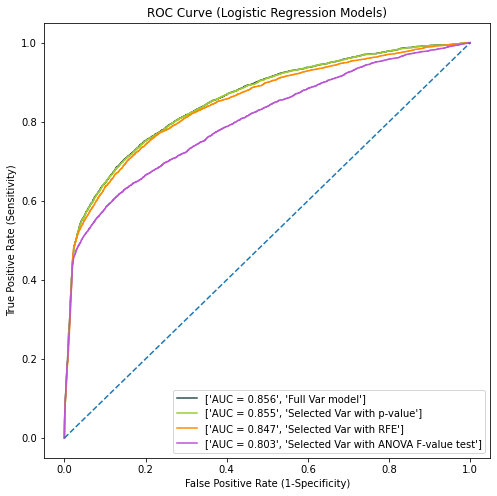

In [184]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline

# LR ROC Curve Summary
fpr, tpr, thresholds = metrics.roc_curve(y_test, lr_predictions_proba) # Full model
fpr1, tpr1, thresholds = metrics.roc_curve(y_test, lr1_predictions_proba) # variable selected p-value model
fpr2, tpr2, thresholds = metrics.roc_curve(y_test, lr2_predictions_proba) # variable selected RFE model
fpr3, tpr3, thresholds = metrics.roc_curve(y_test, lr3_predictions_proba) # variable selected model

auc = metrics.roc_auc_score(y_test, lr_predictions_proba)
auc1 = metrics.roc_auc_score(y_test, lr1_predictions_proba)
auc2 = metrics.roc_auc_score(y_test, lr2_predictions_proba)  
auc3 = metrics.roc_auc_score(y_test, lr3_predictions_proba) 

import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))
plt.title('ROC Curve (Logistic Regression Models)')
plt.plot(fpr,tpr, color='darkslategray',label = ['AUC = %0.3f' % auc,'Full Var model'])
plt.plot(fpr1,tpr1, color='yellowgreen',label = ['AUC = %0.3f' % auc1,'Selected Var with p-value'])
plt.plot(fpr2,tpr2, color='darkorange',label = ['AUC = %0.3f' % auc2,'Selected Var with RFE'])
plt.plot(fpr3,tpr3, color='mediumorchid',label = ['AUC = %0.3f' % auc3,'Selected Var with ANOVA F-value test'])

plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.xlabel('False Positive Rate (1-Specificity)')
plt.style.use('seaborn-paper')


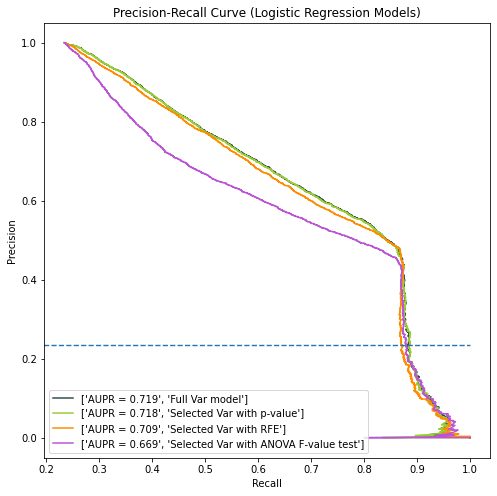

In [193]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline

#calculate precision and recall Logistic Regression models
precision, recall, thresholds = precision_recall_curve(y_test, lr_predictions_proba) # Full Base model
precision1, recall1, thresholds = precision_recall_curve(y_test, lr1_predictions_proba) # variable selected p-value model
precision2, recall2, thresholds = precision_recall_curve(y_test, lr2_predictions_proba) # variable selected RFE model
precision3, recall3, thresholds = precision_recall_curve(y_test, lr3_predictions_proba) # variable selected model

# PR AUC score (average precision)
pr_auc = average_precision_score(y_test, lr_predictions_proba)
pr_auc1 = average_precision_score(y_test, lr1_predictions_proba)
pr_auc2 = average_precision_score(y_test, lr2_predictions_proba)
pr_auc3 = average_precision_score(y_test, lr3_predictions_proba)

import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))
plt.title('Precision-Recall Curve (Logistic Regression Models)')
plt.plot(precision, recall, color='darkslategray',label = ['AUPR = %0.3f' % pr_auc,'Full Var model'])
plt.plot(precision1, recall1, color='yellowgreen',label = ['AUPR = %0.3f' % pr_auc1,'Selected Var with p-value'])
plt.plot(precision2, recall2, color='darkorange',label = ['AUPR = %0.3f' % pr_auc2,'Selected Var with RFE'])
plt.plot(precision3, recall3, color='mediumorchid',label = ['AUPR = %0.3f' % pr_auc3,'Selected Var with ANOVA F-value test'])
plt.legend(loc = 'lower left')

plt.axis('tight')
plt.ylabel('Precision')
plt.xlabel('Recall')
plt.style.use('seaborn-paper')

baseline = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [baseline, baseline], linestyle='--', label='Baseline')

**Random Forest ROC Plots Summary**

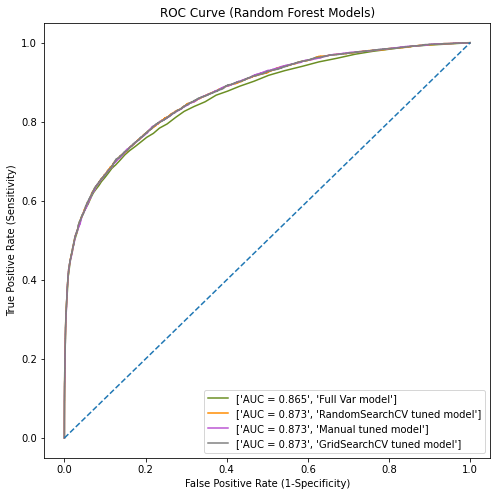

In [189]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline

# Random Forest ROC Curve Summary
fpr_1, tpr_1, threshold = metrics.roc_curve(y_test, rf_predictions_proba) # Full Base model
fpr_2, tpr_2, threshold = metrics.roc_curve(y_test, rf_random_predictions_proba) # RandomSearchCV Parameter Tuning selected model
fpr_3, tpr_3, threshold = metrics.roc_curve(y_test, rf_manual_predictions_proba) # Manual Parameter Tuning selected model
fpr_4, tpr_4, threshold = metrics.roc_curve(y_test, rf_grid_predictions_proba) # GridSearchCV Parameter Tuning selected model

auc_1 = metrics.roc_auc_score(y_test, rf_predictions_proba) 
auc_2 = metrics.roc_auc_score(y_test, rf_random_predictions_proba) 
auc_3 = metrics.roc_auc_score(y_test, rf_manual_predictions_proba) 
auc_4 = metrics.roc_auc_score(y_test, rf_grid_predictions_proba)

import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))
plt.title('ROC Curve (Random Forest Models)')
plt.plot(fpr_1,tpr_1, color='olivedrab',label = ['AUC = %0.3f' % auc_1,'Full Var model'])
plt.plot(fpr_2,tpr_2, color='darkorange',label = ['AUC = %0.3f' % auc_2,'RandomSearchCV tuned model'])
plt.plot(fpr_3,tpr_3, color='mediumorchid',label = ['AUC = %0.3f' % auc_3,'Manual tuned model'])
plt.plot(fpr_4,tpr_4, color='grey',label = ['AUC = %0.3f' % auc_4,'GridSearchCV tuned model'])

plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.xlabel('False Positive Rate (1-Specificity)')
plt.style.use('seaborn-paper')


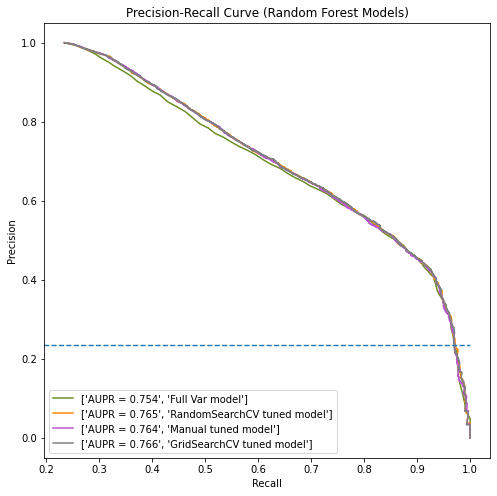

In [190]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline

#calculate precision and recall RF models
precision_1, recall_1, thresholds = precision_recall_curve(y_test, rf_predictions_proba) # Full Base model
precision_2, recall_2, thresholds = precision_recall_curve(y_test, rf_random_predictions_proba) # RandomSearchCV Parameter Tuning selected model
precision_3, recall_3, thresholds = precision_recall_curve(y_test, rf_manual_predictions_proba) # Manual Parameter Tuning selected model
precision_4, recall_4, thresholds = precision_recall_curve(y_test, rf_grid_predictions_proba) # GridSearchCV Parameter Tuning selected model

# PR AUC score (average precision)
pr_auc_1 = average_precision_score(y_test, rf_predictions_proba)
pr_auc_2 = average_precision_score(y_test, rf_random_predictions_proba)
pr_auc_3 = average_precision_score(y_test, rf_manual_predictions_proba)
pr_auc_4 = average_precision_score(y_test, rf_grid_predictions_proba)

import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))
plt.title('Precision-Recall Curve (Random Forest Models)')
plt.plot(precision_1, recall_1, color='olivedrab',label = ['AUPR = %0.3f' % pr_auc_1,'Full Var model'])
plt.plot(precision_2, recall_2, color='darkorange',label = ['AUPR = %0.3f' % pr_auc_2,'RandomSearchCV tuned model'])
plt.plot(precision_3, recall_3, color='mediumorchid',label = ['AUPR = %0.3f' % pr_auc_3,'Manual tuned model'])
plt.plot(precision_4, recall_4, color='grey',label = ['AUPR = %0.3f' % pr_auc_4,'GridSearchCV tuned model'])
plt.legend(loc = 'lower left')

plt.axis('tight')
plt.ylabel('Precision')
plt.xlabel('Recall')
plt.style.use('seaborn-paper')

baseline = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [baseline, baseline], linestyle='--', label='Baseline')

**XGBoost ROC Plots Summary**

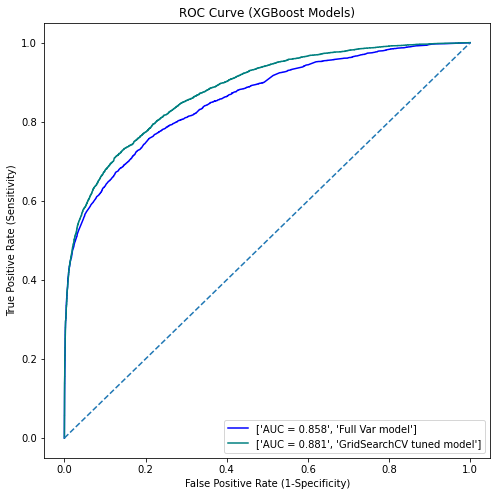

In [194]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline

# XGBoost ROC Curve Summary
fpr_5, tpr_5, threshold = metrics.roc_curve(y_test, Xgboost_predictions_proba) # Full Base model
fpr_6, tpr_6, threshold = metrics.roc_curve(y_test, Xgboost_tuned_predictions_proba) # GridSearchCV Parameter Tuning selected XGB model

auc_5 = metrics.roc_auc_score(y_test, Xgboost_predictions_proba) 
auc_6 = metrics.roc_auc_score(y_test, Xgboost_tuned_predictions_proba)

import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))
plt.title('ROC Curve (XGBoost Models)')
plt.plot(fpr_5,tpr_5, color='blue',label = ['AUC = %0.3f' % auc_5,'Full Var model'])
plt.plot(fpr_6,tpr_6, color='teal',label = ['AUC = %0.3f' % auc_6,'GridSearchCV tuned model'])

plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.xlabel('False Positive Rate (1-Specificity)')
plt.style.use('seaborn-paper')


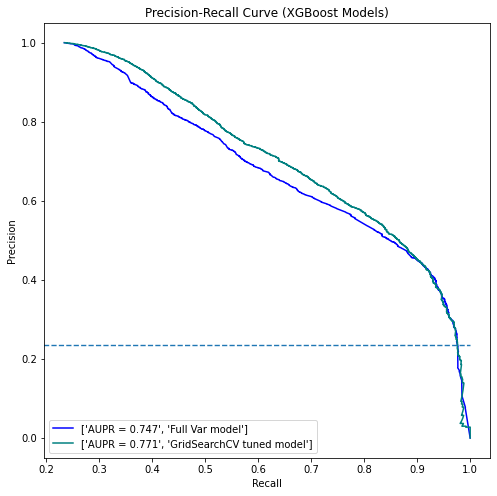

In [195]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline

#calculate precision and recall

precision_5, recall_5, thresholds = precision_recall_curve(y_test, Xgboost_predictions_proba) # Full Base model
precision_6, recall_6, thresholds = precision_recall_curve(y_test, Xgboost_tuned_predictions_proba) # GridSearchCV Parameter Tuning selected XGB model

# PR AUC score (average precision)
pr_auc_5 = average_precision_score(y_test, Xgboost_predictions_proba)
pr_auc_6 = average_precision_score(y_test, Xgboost_tuned_predictions_proba)

import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))
plt.title('Precision-Recall Curve (XGBoost Models)')
plt.plot(precision_5, recall_5, color='blue',label = ['AUPR = %0.3f' % pr_auc_5,'Full Var model'])
plt.plot(precision_6, recall_6, color='teal',label = ['AUPR = %0.3f' % pr_auc_6,'GridSearchCV tuned model'])
plt.legend(loc = 'lower left')

plt.axis('tight')
plt.ylabel('Precision')
plt.xlabel('Recall')
plt.style.use('seaborn-paper')

baseline = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [baseline, baseline], linestyle='--', label='Baseline')

**All models ROC Curve Summary**

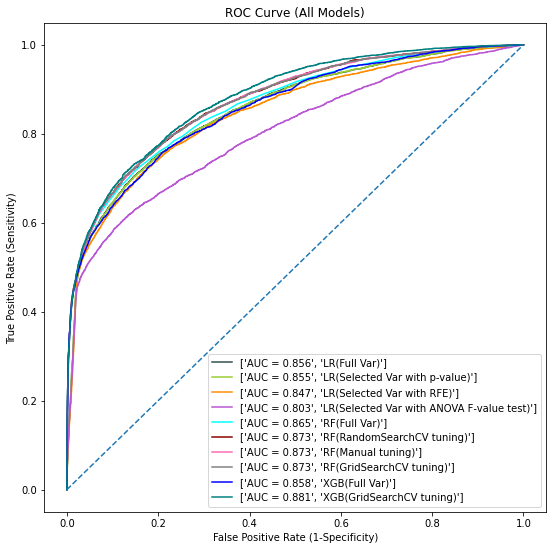

In [198]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline

plt.figure(figsize=(9,9))
plt.title('ROC Curve (All Models)')

plt.plot(fpr,tpr, color='darkslategray',label = ['AUC = %0.3f' % auc,'LR(Full Var)'])
plt.plot(fpr1,tpr1, color='yellowgreen',label = ['AUC = %0.3f' % auc1,'LR(Selected Var with p-value)'])
plt.plot(fpr2,tpr2, color='darkorange',label = ['AUC = %0.3f' % auc2,'LR(Selected Var with RFE)'])
plt.plot(fpr3,tpr3, color='mediumorchid',label = ['AUC = %0.3f' % auc3,'LR(Selected Var with ANOVA F-value test)'])

plt.plot(fpr_1,tpr_1, color='aqua',label = ['AUC = %0.3f' % auc_1,'RF(Full Var)'])
plt.plot(fpr_2,tpr_2, color='darkred',label = ['AUC = %0.3f' % auc_2,'RF(RandomSearchCV tuning)'])
plt.plot(fpr_3,tpr_3, color='hotpink',label = ['AUC = %0.3f' % auc_3,'RF(Manual tuning)'])
plt.plot(fpr_4,tpr_4, color='grey',label = ['AUC = %0.3f' % auc_4,'RF(GridSearchCV tuning)'])

plt.plot(fpr_5,tpr_5, color='blue',label = ['AUC = %0.3f' % auc_5,'XGB(Full Var)'])
plt.plot(fpr_6,tpr_6, color='teal',label = ['AUC = %0.3f' % auc_6,'XGB(GridSearchCV tuning)'])

plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.xlabel('False Positive Rate (1-Specificity)')
plt.style.use('seaborn-paper')


**All models Precision-Recall Curve Summary**

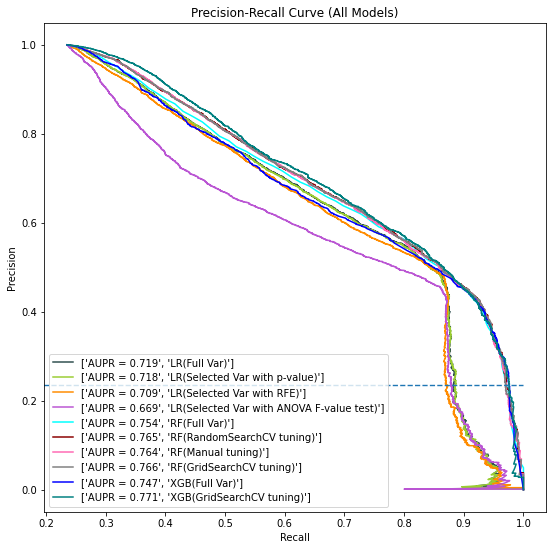

In [199]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.figure(figsize=(9,9))
plt.title('Precision-Recall Curve (All Models)')

plt.plot(precision, recall, color='darkslategray',label = ['AUPR = %0.3f' % pr_auc,'LR(Full Var)'])
plt.plot(precision1, recall1, color='yellowgreen',label = ['AUPR = %0.3f' % pr_auc1,'LR(Selected Var with p-value)'])
plt.plot(precision2, recall2, color='darkorange',label = ['AUPR = %0.3f' % pr_auc2,'LR(Selected Var with RFE)'])
plt.plot(precision3, recall3, color='mediumorchid',label = ['AUPR = %0.3f' % pr_auc3,'LR(Selected Var with ANOVA F-value test)'])

plt.plot(precision_1, recall_1, color='aqua',label = ['AUPR = %0.3f' % pr_auc_1,'RF(Full Var)'])
plt.plot(precision_2, recall_2, color='darkred',label = ['AUPR = %0.3f' % pr_auc_2,'RF(RandomSearchCV tuning)'])
plt.plot(precision_3, recall_3, color='hotpink',label = ['AUPR = %0.3f' % pr_auc_3,'RF(Manual tuning)'])
plt.plot(precision_4, recall_4, color='grey',label = ['AUPR = %0.3f' % pr_auc_4,'RF(GridSearchCV tuning)'])

plt.plot(precision_5, recall_5, color='blue',label = ['AUPR = %0.3f' % pr_auc_5,'XGB(Full Var)'])
plt.plot(precision_6, recall_6, color='teal',label = ['AUPR = %0.3f' % pr_auc_6,'XGB(GridSearchCV tuning)'])

plt.legend(loc = 'lower left')
plt.axis('tight')
plt.ylabel('Precision')
plt.xlabel('Recall')
plt.style.use('seaborn-paper')

baseline = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [baseline, baseline], linestyle='--', label='Baseline')

In [235]:
baseline

0.2348307073416024

In [237]:
import bctools as bc

area_under_PR = bc.curve_PR_plot(true_y= y_test, 
                                 predicted_proba = Xgboost_tuned_predictions_proba, 
                                 beta = 1)

#### **Prediction on new additional/extra test dataset**

In [200]:
df_extra_testset_after_dummy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25092 entries, 0 to 33463
Data columns (total 48 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   rank                       25092 non-null  float64 
 1   total_funding_usd          25092 non-null  float64 
 2   employee_count             25092 non-null  int64   
 3   avg_investors_per_round    25092 non-null  float64 
 4   has_angel                  25092 non-null  int64   
 5   has_pre_seed               25092 non-null  int64   
 6   has_seed                   25092 non-null  int64   
 7   has_seriesUnknown          25092 non-null  int64   
 8   has_seriesA                25092 non-null  int64   
 9   has_seriesB                25092 non-null  int64   
 10  has_seriesC                25092 non-null  int64   
 11  has_seriesD                25092 non-null  int64   
 12  has_seriesE_J              25092 non-null  int64   
 13  has_equity_crowdfunding    2509

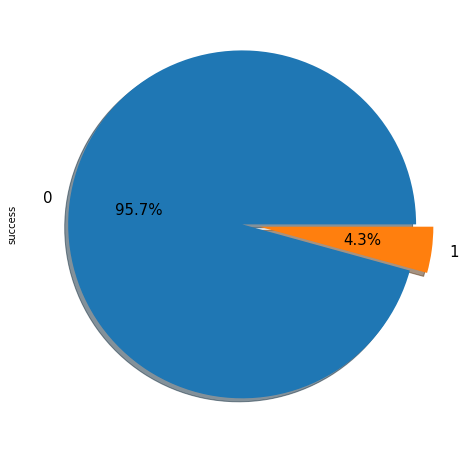

In [203]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline

plt.figure(figsize=[8,8])
df_extra_testset_after_dummy['success'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%', textprops={'fontsize': 15}, shadow=True)
plt.show()

In [204]:
# Splitting X(predictors) and y

X_newtest = df_extra_testset_after_dummy.drop('success', axis=1) 
y_newtest = df_extra_testset_after_dummy['success']

# Train - Test Split

X_newtest_shape = X_newtest.shape
y_newtest_shape = y_newtest.shape
print("X_newtest shape = {}\ny_newtest shape = {}".format(X_newtest_shape, y_newtest_shape))

X_newtest shape = (25092, 47)
y_newtest shape = (25092,)


In [205]:
cat_columns_newtest = list(X_newtest.select_dtypes('category'))
print(cat_columns_newtest)

['category_num_Industry10', 'category_num_Industry11', 'category_num_Industry12', 'category_num_Industry13', 'category_num_Industry14', 'category_num_Industry2', 'category_num_Industry3', 'category_num_Industry4', 'category_num_Industry5', 'category_num_Industry6', 'category_num_Industry7', 'category_num_Industry8', 'category_num_Industry9']


In [206]:
X_newtest_int = X_newtest.copy()

In [207]:
X_newtest_int[cat_columns_newtest] = X_newtest_int[cat_columns_newtest].apply(lambda x: x.astype('Int64'))

In [158]:
# Xgboost_tuned_model = xgb.XGBClassifier(base_score=0.5, booster='gbtree', objective = 'binary:logistic', callbacks=None,
#               colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
#               early_stopping_rounds=None, enable_categorical=False,
#               eval_metric='logloss', gamma=0, gpu_id=-1,
#               grow_policy='depthwise', importance_type=None,
#               interaction_constraints='', learning_rate=0.300000012,
#               max_bin=256, max_cat_to_onehot=4, max_delta_step=0, max_depth=4,
#               max_leaves=0, min_child_weight=1,
#               monotone_constraints='()', n_estimators=100, n_jobs=0,
#               num_parallel_tree=1, predictor='auto', random_state=0,
#               reg_alpha=0, reg_lambda=1, scale_pos_weight=3)

# # fit the model
# Xgboost_tuned_model.fit(X_train_int, y_train)

Accuracy on New Test set 0.9732584090546788
F1-score on New Test set: 0.5559232296492389


              precision    recall  f1-score   support

           0       0.97      1.00      0.99     24018
           1       0.96      0.39      0.56      1074

    accuracy                           0.97     25092
   macro avg       0.97      0.70      0.77     25092
weighted avg       0.97      0.97      0.97     25092





Text(0.5, 15.0, 'Predicted label')

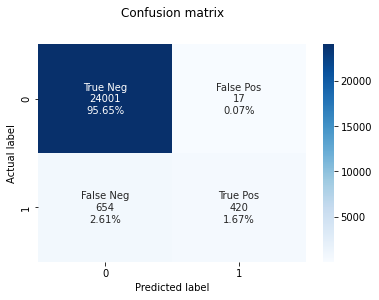

In [208]:
# model score
Xgboost_tuned_y_pred_newtest = Xgboost_tuned_model.predict(X_newtest_int)

# accuracy score
Xgb_tuned_newtest_score = Xgboost_tuned_model.score(X_newtest_int,y_newtest)

Xgb_tuned_new_f1_score = metrics.f1_score(Xgboost_tuned_y_pred_newtest, y_newtest)

print('Accuracy on New Test set',Xgb_tuned_newtest_score)
print('F1-score on New Test set:',Xgb_tuned_new_f1_score)
print('\n')
print(metrics.classification_report(y_newtest, Xgboost_tuned_y_pred_newtest))
print('\n')

# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_newtest, Xgboost_tuned_y_pred_newtest)

group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cnf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cnf_matrix.flatten()/np.sum(cnf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)

sns.heatmap(cnf_matrix, annot=labels, fmt='', cmap='Blues')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

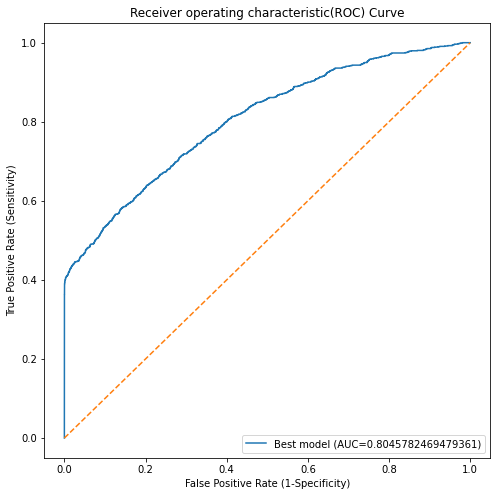

AUC score for New test data: 0.8045782469479361


In [228]:
# ROC Curve
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.figure(figsize=(8,8))

Xgboost_tuned_new_predictions_proba = Xgboost_tuned_model.predict_proba(X_newtest_int)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_newtest, Xgboost_tuned_new_predictions_proba)

auc = metrics.roc_auc_score(y_newtest, Xgboost_tuned_new_predictions_proba) 

plt.plot(fpr,tpr,label="Best model (AUC="+str(auc)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.xlabel('False Positive Rate (1-Specificity)')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)

print(f"AUC score for New test data: {auc}")

In [210]:
# Precision-Recall Curve (PR AUC | average precision)
from sklearn.metrics import average_precision_score

# PR AUC score (average precision)
pr_auc = average_precision_score(y_newtest, Xgboost_tuned_new_predictions_proba)

print(f"Average PR AUC score for New test data: {pr_auc}")

Average PR AUC score for New test data: 0.4920921775063639


<Figure size 504x504 with 0 Axes>

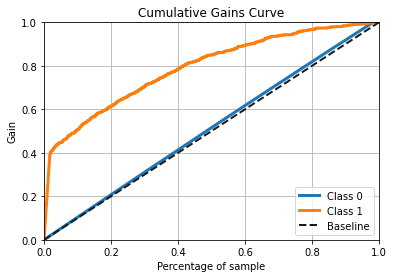

In [211]:
import scikitplot as skplt

# pred1 = clf.predict_proba(X_test)
pred15 = Xgboost_tuned_model.predict_proba(X_newtest_int)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_newtest, pred15)
plt.show()

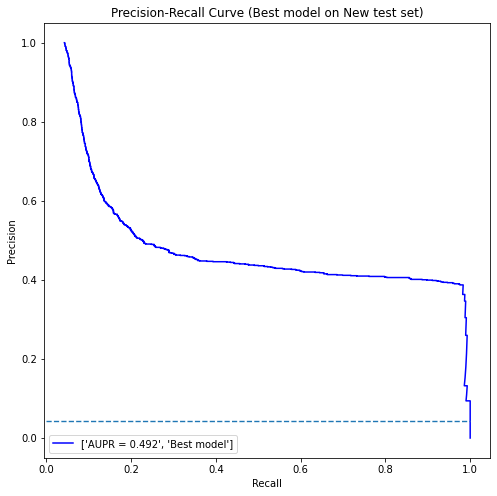

In [215]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline

#calculate precision and recall

precision_7, recall_7, thresholds = precision_recall_curve(y_newtest, Xgboost_tuned_new_predictions_proba) # XGBoost (GridSearchCV) best model on new additional test set

# PR AUC score (average precision)
pr_auc_7 = average_precision_score(y_newtest, Xgboost_tuned_new_predictions_proba)

import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))
plt.title('Precision-Recall Curve (Best model on New test set)')
plt.plot(precision_7, recall_7, color='blue',label = ['AUPR = %0.3f' % pr_auc_7,'Best model'])
plt.legend(loc = 'lower left')

plt.axis('tight')
plt.ylabel('Precision')
plt.xlabel('Recall')
plt.style.use('seaborn-paper')

baseline = len(y_newtest[y_newtest==1]) / len(y_newtest)
plt.plot([0, 1], [baseline, baseline], linestyle='--', label='Baseline')

In [227]:
import bctools as bc

area_under_PR = bc.curve_PR_plot(true_y= y_newtest, 
                                 predicted_proba = Xgboost_tuned_new_predictions_proba, 
                                 beta = 1)

In [214]:
# Confusion Matrix Evaluation Metrics
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

prec = metrics.precision_score(Xgboost_tuned_y_pred_newtest, y_newtest)
rec = metrics.recall_score(Xgboost_tuned_y_pred_newtest, y_newtest)
f1 = f1_score(Xgboost_tuned_y_pred_newtest, y_newtest)
auc = metrics.roc_auc_score(y_newtest, Xgboost_tuned_new_predictions_proba) 
pr_auc = average_precision_score(y_newtest, Xgboost_tuned_new_predictions_proba)

results_xgb_tuned_newtest = pd.DataFrame([['Best model on New test set', Xgb_tuned_newtest_score, prec, rec, f1, auc, pr_auc]],columns=['Model', 'Test Accuracy',  
                                                                                                           'Precision', 'Recall', 'F1 Score', 'AUC Score', 'AUPR Score'])
results_xgb_tuned_newtest

,Model,Test Accuracy,Precision,Recall,F1 Score,AUC Score,AUPR Score
0,Best model on New test set,0.97326,0.39106,0.96110,0.55592,0.80458,0.49209


In [223]:
# results_xgb_tuned_newtest.to_csv('results_xgb_tuned_newtest.csv')

In [217]:
newtest_predicted_add = df_extra_testset_after_dummy.copy()

In [218]:
newtest_predicted_add['predicted_success'] = Xgboost_tuned_y_pred_newtest

In [175]:
# newtest_predicted_add.to_csv('newtest_predicted_add.csv')

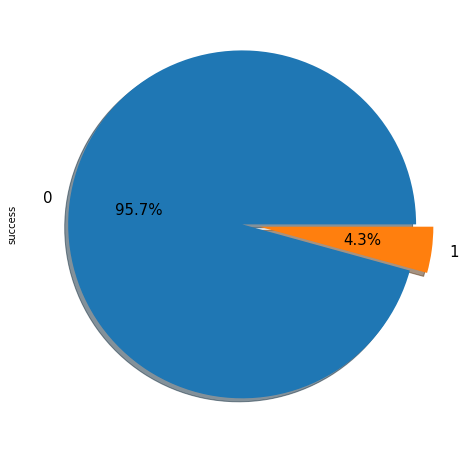

In [224]:
plt.figure(figsize=[8,8])
newtest_predicted_add['success'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%',textprops={'fontsize': 15},shadow=True)
plt.show()

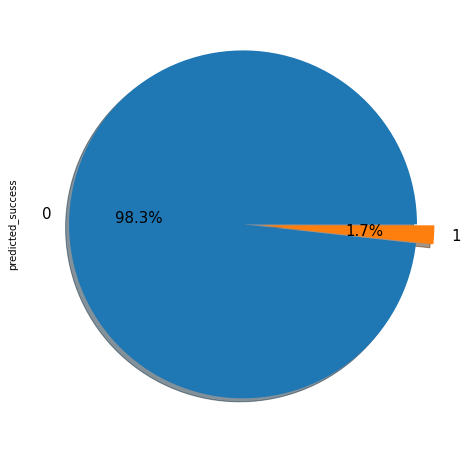

In [225]:
plt.figure(figsize=[8,8])
newtest_predicted_add['predicted_success'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%', textprops={'fontsize': 15}, shadow=True)
plt.show()